In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import numpy as np
import pandas as pd
import os 
from torch.utils.data import DataLoader, TensorDataset
import torch

In [2]:
%matplotlib notebook

In [3]:
seed = 42
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

In [4]:
num_epochs = 10000

In [5]:
# Load the conditions into a Pandas DataFrame
excel_path = './conditions.xlsx'
conditions_df = pd.read_excel(excel_path)

# Display the DataFrame to verify the contents
conditions_df


,Sample Name,Power (W),Speed (mm/s)
0,a,71,21
1,b,85,30
2,c,55,21
3,d,66,30
4,e,85,50
5,f,55,30
6,g,70,50


In [6]:
## Set up the main parameters are all in mm
spot_radius = 0.142 / 2
eta = 0.44
O_PD = 0.02

T_amb = 27.0

rho = 8000 *1e-9 #kg/(mm)^3
Cp = 500.0 #J/(kgK)
kappa = 20 * 1e-3 #W/(mmK)

T_max = 5500 #K
T_min = T_amb

T_melt = 1417

mu = 7 #mPa s
dgamma_dt = 2e-4 #N/(m * K)

In [7]:
# Set up the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [8]:
# Function to get CSV files in a folder
def get_csv_files_in_folder(folder_path):
    csv_file_paths = []
    for filename in os.listdir(folder_path):
        if filename.endswith('.csv'):
            full_file_path = os.path.join(folder_path, filename)
            csv_file_paths.append(full_file_path)
    return csv_file_paths

# Function to extract sample name from CSV file name
def extract_sample_name_from_csv(filename):
    # The sample name is the part of the filename before the last underscore or the file extension
    return os.path.splitext(filename)[0].split('_')[-1]


In [9]:
# Folder_path is where the CSV files are stored
folder_path = './Data/'  
csv_file_paths = get_csv_files_in_folder(folder_path)

csv_file_paths

['./Data/data_sample_g.csv',
 './Data/data_sample_d.csv',
 './Data/data_sample_c.csv',
 './Data/data_sample_a.csv',
 './Data/data_sample_e.csv',
 './Data/data_sample_f.csv',
 './Data/data_sample_b.csv']

In [10]:
# Dictionary to store summary statistics for each dataset
summary_statistics = {}

# Loop through each file path and generate summary statistics
for file_path in csv_file_paths:
    df = pd.read_csv(file_path)
    filename = os.path.basename(file_path)
    sample_name = extract_sample_name_from_csv(filename)
    
    if sample_name in conditions_df['Sample Name'].values:
        summary_statistics[sample_name] = df.describe()
    else:
        print(f"Warning: Sample name {sample_name} from {filename} not found in Excel data.")

# Display the summary statistics for verification
for sample, stats in summary_statistics.items():
    print(f"Summary statistics for sample {sample}:\n{stats}\n")


Summary statistics for sample g:
            x(um)       y(um)    Vx(mm/s)    Vy(mm/s)  Circular variance  \
count  405.000000  405.000000  405.000000  405.000000         405.000000   
mean    72.242500  -45.972500   -4.029064    4.396171           0.107504   
std    102.433491   56.819877   56.907633   63.788638           0.238721   
min    -98.512500 -137.917500 -391.747434 -433.455000           0.000000   
25%    -19.702500  -98.512500    0.000000    0.000000           0.000000   
50%     72.242500  -45.972500    0.000000    0.000000           0.000000   
75%    164.187500    6.567500    0.000000    0.000000           0.000000   
max    242.997500   45.972500  383.217565  394.050000           0.973342   

       particle numbers  
count        405.000000  
mean           0.723457  
std            1.748427  
min            0.000000  
25%            0.000000  
50%            0.000000  
75%            0.000000  
max           15.000000  

Summary statistics for sample d:
            x(

In [11]:
# Dictionary to store the actual data for each dataset
data_frames = {}

# Loop through each file path, read the data, and store both the summary statistics and the data
for file_path in csv_file_paths:
    df = pd.read_csv(file_path)
    filename = os.path.basename(file_path)
    sample_name = extract_sample_name_from_csv(filename)
    
    if sample_name in conditions_df['Sample Name'].values:
        summary_statistics[sample_name] = df.describe()
        data_frames[sample_name] = df  # Storing the actual data
    else:
        print(f"Warning: Sample name {sample_name} from {filename} not found in Excel data.")


<IPython.core.display.Javascript object>


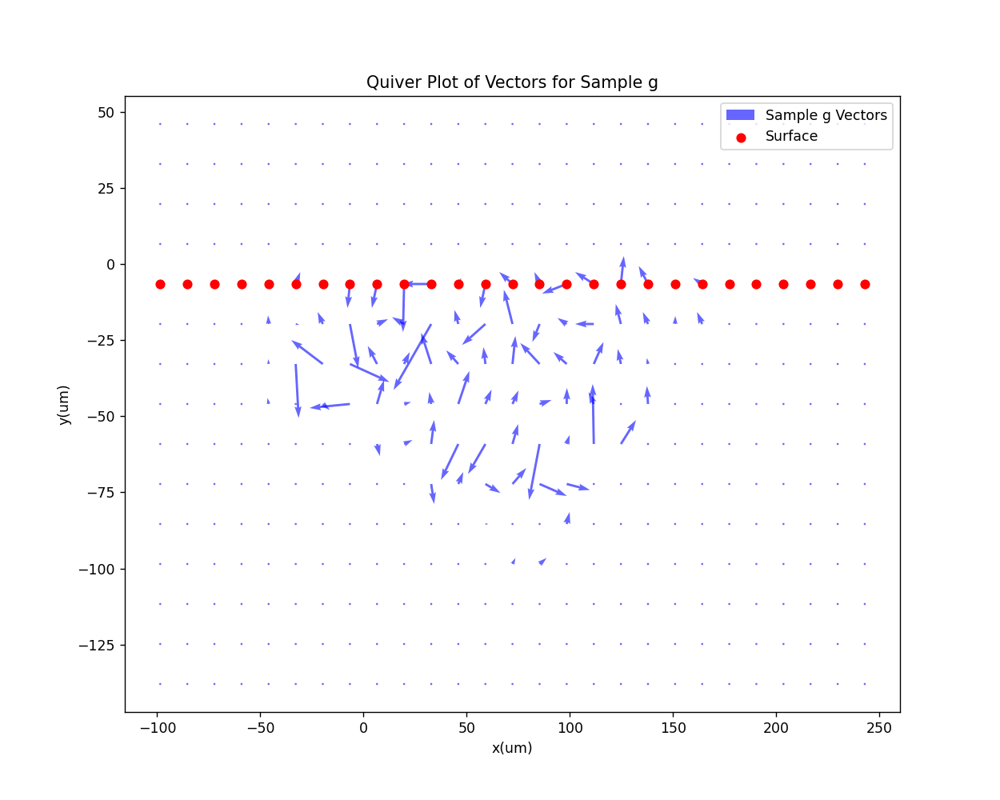

<IPython.core.display.Javascript object>


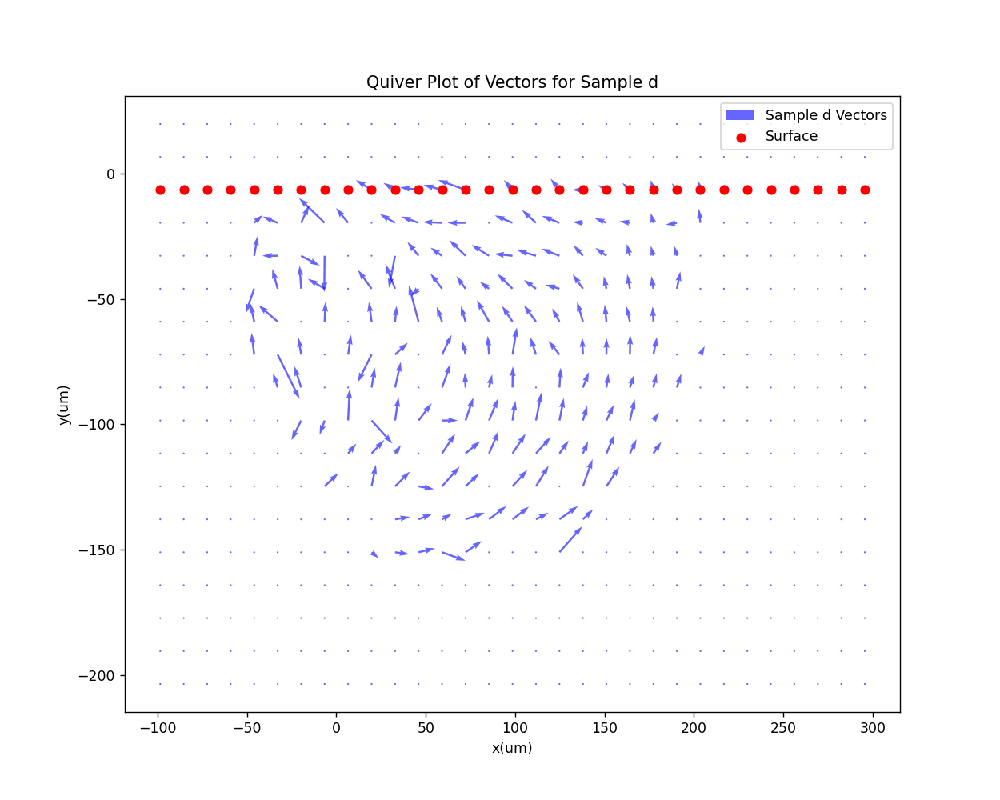

<IPython.core.display.Javascript object>


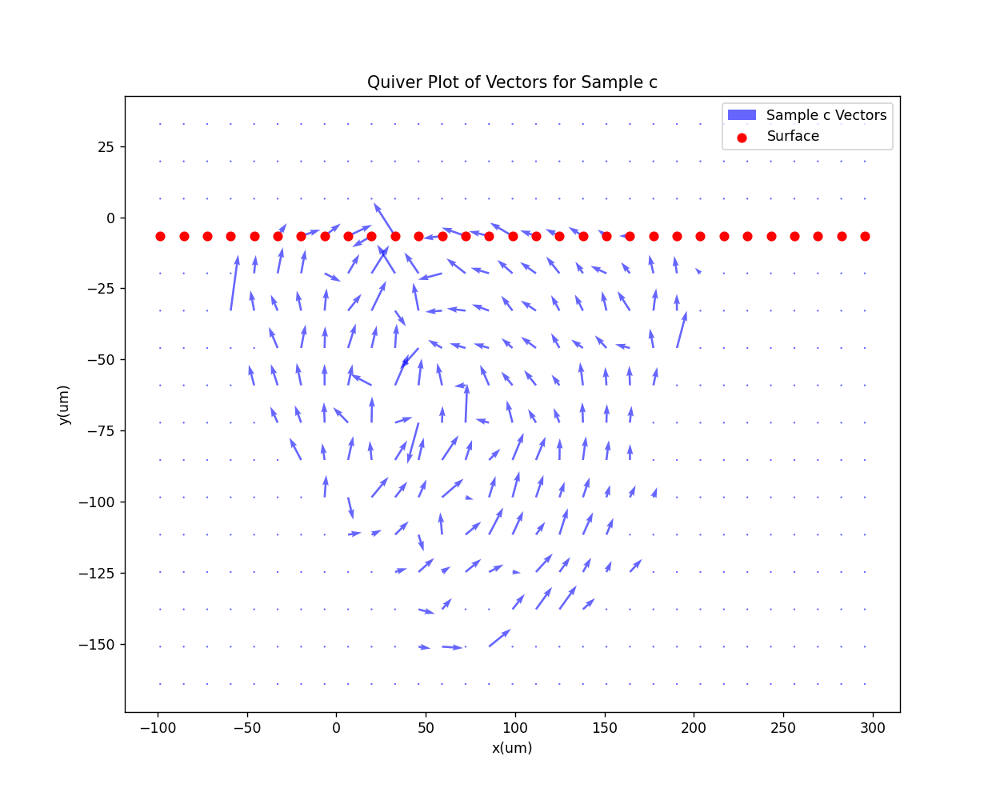

<IPython.core.display.Javascript object>


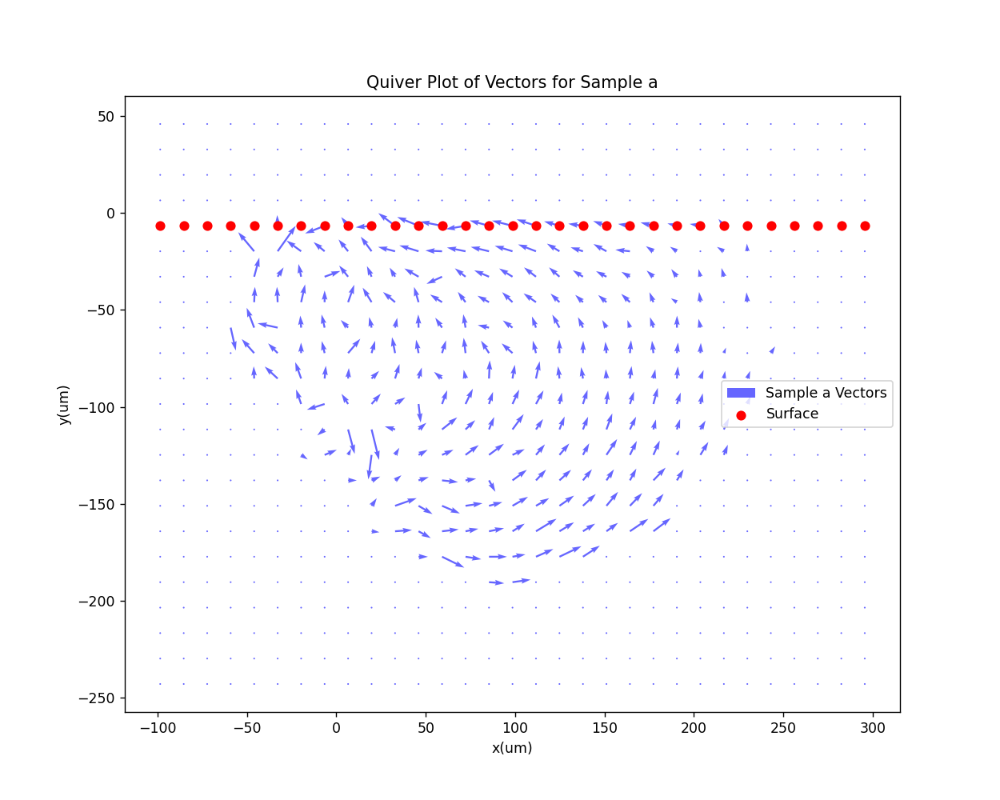

<IPython.core.display.Javascript object>


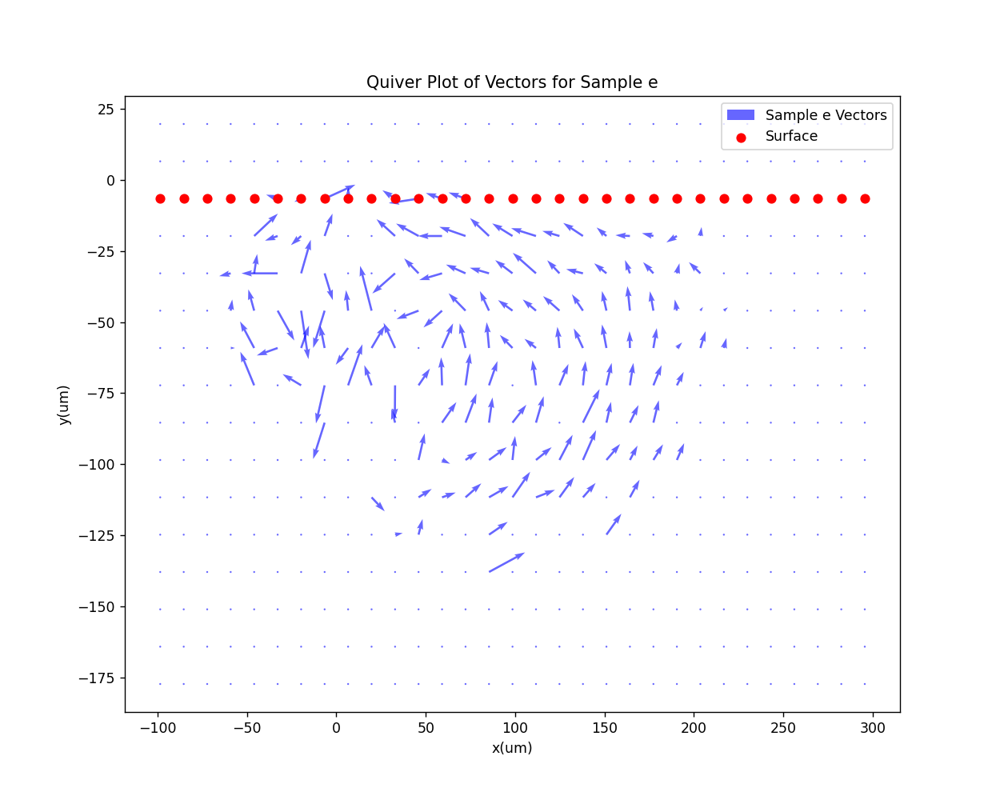

<IPython.core.display.Javascript object>


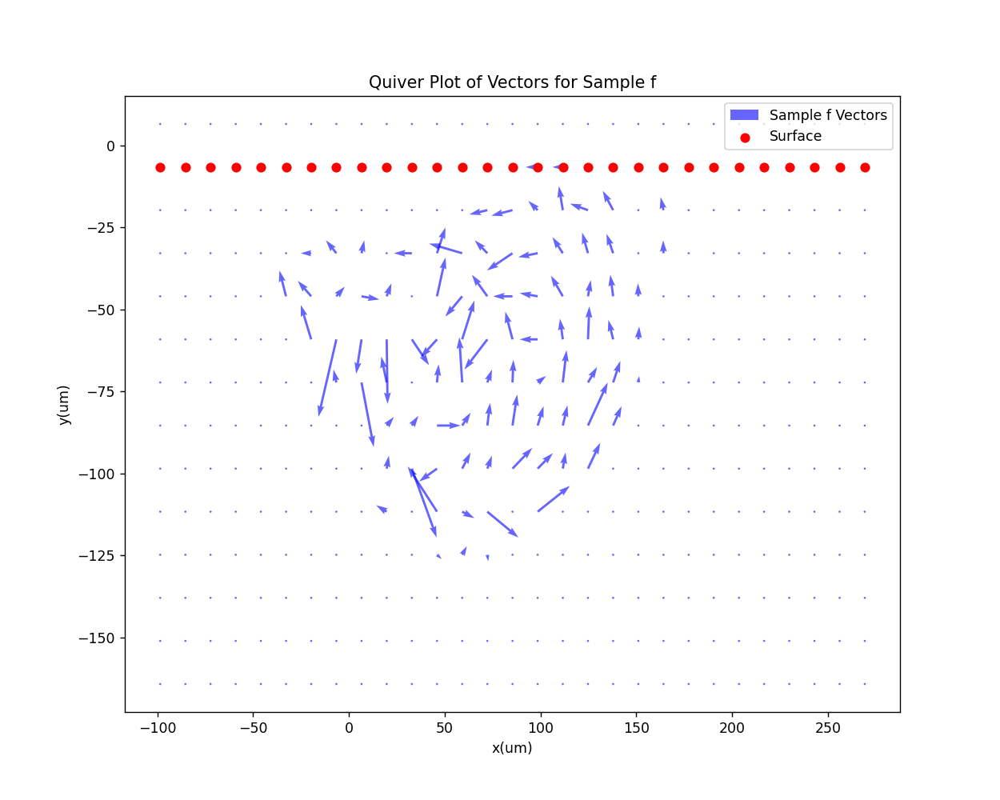

<IPython.core.display.Javascript object>


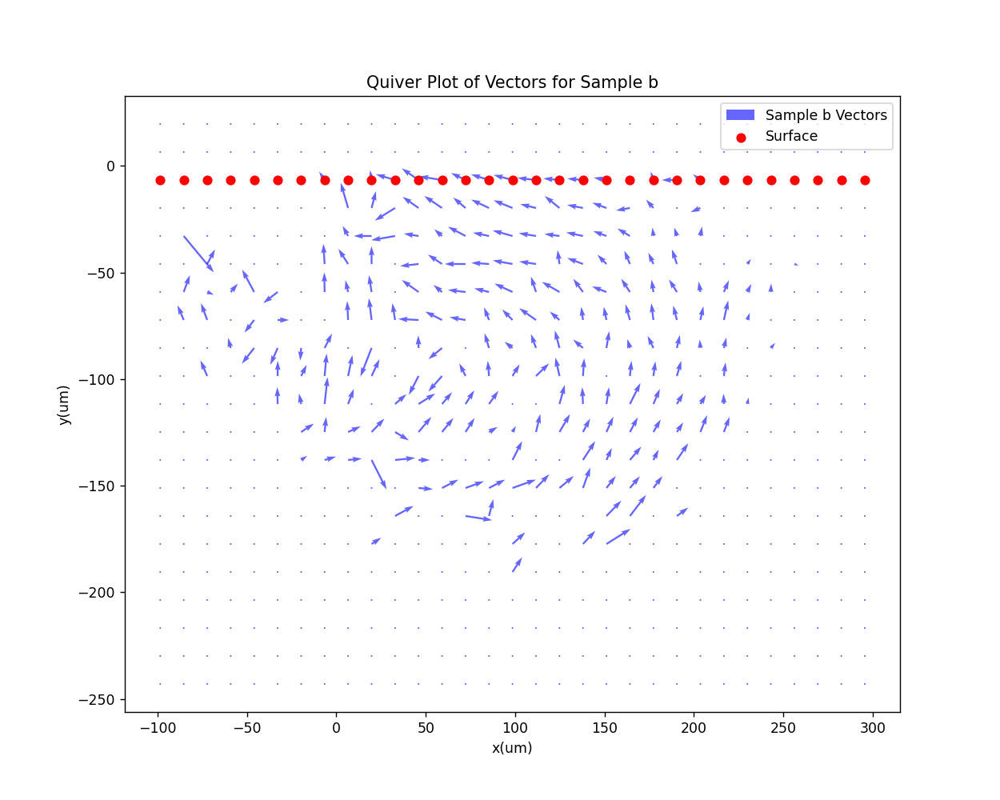

In [12]:
# Define the variable names
variables = list(summary_statistics['a'].columns)

# Loop through each sample and create quiver plots for x and y
for sample, df in data_frames.items():
    plt.figure(figsize=(10, 8))
    
    # Find the minimum absolute distance to y=0
    min_distance_to_zero = np.min(np.abs(df[variables[1]]))

    # Identify all rows where y is closest to 0
    closest_to_zero_rows = df[np.abs(df[variables[1]]) == min_distance_to_zero]

    # Filter to get only the negative y values
    closest_to_zero_rows_negative = closest_to_zero_rows[closest_to_zero_rows[variables[1]] < 0]

    # Quiver plot to show vectors; setting scale to make arrows smaller
    plt.quiver(df[variables[0]], df[variables[1]], df[variables[2]], df[variables[3]], 
               angles='xy', scale_units='xy', scale=20, color='blue', alpha=0.6, label=f'Sample {sample} Vectors')

    # Highlight the negative points closest to y=0 with red dots
    plt.scatter(closest_to_zero_rows_negative[variables[0]], closest_to_zero_rows_negative[variables[1]], 
                color='red', zorder=5, label='Surface')
    
    # Labels and title
    plt.xlabel(variables[0])
    plt.ylabel(variables[1])
    plt.title(f'Quiver Plot of Vectors for Sample {sample}')
    plt.legend()
    
    plt.show()


In [13]:
# Resolution for the grid
resolution = 13.135  # in um

# Calculate the number of points on either side of z=0
num_points_side = int(200 / resolution)

# Generate z coordinates ranging from -50 um to +50 um with the given resolution
# Make sure to include 0 in the middle
z_coordinates = torch.cat([
    torch.arange(-num_points_side * resolution, -0.1, resolution),  # Left of zero
    torch.tensor([0.0]),                                          # Zero
    torch.arange(resolution, num_points_side * resolution + 0.1, resolution)  # Right of zero
])

# Dictionary to store the 3D coordinates as PyTorch tensors for each sample
sample_coordinates = {}

# Loop through each sample and create 3D coordinates
for sample, df in data_frames.items():
    # Extract x and y coordinates from the DataFrame and convert them to PyTorch tensors
    x_coordinates = torch.tensor(df[variables[0]].values, dtype=torch.float32)
    y_coordinates = torch.tensor(df[variables[1]].values, dtype=torch.float32)
    
    # Create empty tensor to store the 3D coordinates (x, y, z) for each point
    total_points = len(x_coordinates) * len(z_coordinates)
    coords_3D = torch.zeros(total_points, 3)
    
    # Fill the 3D coordinates tensor
    index = 0
    for z in z_coordinates:
        for i in range(len(x_coordinates)):
            coords_3D[index, 0] = x_coordinates[i]
            coords_3D[index, 1] = y_coordinates[i]
            coords_3D[index, 2] = z
            index += 1
    
    # Store the 3D coordinates tensor for the sample
    sample_coordinates[sample] = coords_3D

# After generating 3D coordinates for all samples
# Loop to filter out coordinates with positive y-values
for sample in sample_coordinates.keys():
    coords_3D = sample_coordinates[sample]
    coords_filtered = coords_3D[coords_3D[:, 1] <= 0]
    sample_coordinates[sample] = coords_filtered

In [14]:
# Initialize variables to store the global maximum and minimum values for x, y, and z
global_x_max = float('-inf')
global_y_max = float('-inf')
global_z_max = float('-inf')
global_x_min = float('inf')
global_y_min = float('inf')
global_z_min = float('inf')

# Loop through each sample to find the global maximum and minimum for x, y, and z
for sample, coords in sample_coordinates.items():
    global_x_max = max(global_x_max, coords[:, 0].max())
    global_y_max = max(global_y_max, coords[:, 1].max())
    global_z_max = max(global_z_max, coords[:, 2].max())
    
    global_x_min = min(global_x_min, coords[:, 0].min())
    global_y_min = min(global_y_min, coords[:, 1].min())
    global_z_min = min(global_z_min, coords[:, 2].min())

# Calculate the global minimum and maximum values for speed and power
global_speed_min = conditions_df['Speed (mm/s)'].min()
global_speed_max = conditions_df['Speed (mm/s)'].max()
global_power_min = conditions_df['Power (W)'].min()
global_power_max = conditions_df['Power (W)'].max()

# Display the calculated global values
print(f"Global Minimum Speed: {global_speed_min} mm/s")
print(f"Global Maximum Speed: {global_speed_max} mm/s")
print(f"Global Minimum Power: {global_power_min} W")
print(f"Global Maximum Power: {global_power_max} W")
print(f"Global Maximum X: {global_x_max} um")
print(f"Global Maximum Y: {global_y_max} um")
print(f"Global Maximum Z: {global_z_max} um")
print(f"Global Minimum X: {global_x_min} um")
print(f"Global Minimum Y: {global_y_min} um")
print(f"Global Minimum Z: {global_z_min} um")


Global Minimum Speed: 21 mm/s
Global Maximum Speed: 50 mm/s
Global Minimum Power: 55 W
Global Maximum Power: 85 W
Global Maximum X: 295.5375061035156 um
Global Maximum Y: -6.567500114440918 um
Global Maximum Z: 197.02499389648438 um
Global Minimum X: -98.51249694824219 um
Global Minimum Y: -242.99749755859375 um
Global Minimum Z: -197.02499389648438 um


In [15]:
# Dictionary to store the boundary and interior coordinates as PyTorch tensors for each sample
sample_boundary_coordinates = {}
sample_interior_coordinates = {}

# Loop through each sample and separate boundary and interior points
for sample, coords_3D in sample_coordinates.items():
    x_min = coords_3D[:, 0].min()
    x_max = coords_3D[:, 0].max()
    y_min = coords_3D[:, 1].min()
    
    # Define conditions for boundary points
    cond_x_min = (coords_3D[:, 0] == x_min)
    cond_x_max = (coords_3D[:, 0] == x_max)
    cond_y_min = (coords_3D[:, 1] == y_min)
    
    # Extract boundary points
    boundary_points = coords_3D[cond_x_max | cond_y_min] # cond_x_min
    
    # Extract interior points
    interior_points = coords_3D[~(cond_x_max | cond_y_min)] # cond_x_min
    
    # Store them in dictionaries
    sample_boundary_coordinates[sample] = boundary_points
    sample_interior_coordinates[sample] = interior_points

# `sample_boundary_coordinates` contains the boundary points and
# `sample_interior_coordinates` contains the interior points for each sample.


In [16]:
# from mpl_toolkits.mplot3d import Axes3D
# import matplotlib.pyplot as plt

# # Loop through each sample and plot the 3D coordinates
# for sample in sample_coordinates.keys():
#     fig = plt.figure(figsize=(10, 8))
#     ax = fig.add_subplot(111, projection='3d')
    
#     # Scatter plot in 3D for interior points in blue
#     interior_coords = sample_interior_coordinates[sample]
#     ax.scatter(interior_coords[:, 0], interior_coords[:, 1], interior_coords[:, 2], c='b', marker='o', alpha=0.2)
    
#     # Scatter plot in 3D for boundary points in red
#     boundary_coords = sample_boundary_coordinates[sample]
#     ax.scatter(boundary_coords[:, 0], boundary_coords[:, 1], boundary_coords[:, 2], c='r', marker='o', alpha=0.5)
    
#     # Labels and title
#     ax.set_xlabel('X (um)')
#     ax.set_ylabel('Y (um)')
#     ax.set_zlabel('Z (um)')
#     ax.set_title(f'3D Scatter Plot for Sample {sample} (Interior in Blue, Boundary in Red)')
    
#     plt.show()
#     break



In [17]:
# from mpl_toolkits.mplot3d import Axes3D
# import matplotlib.pyplot as plt

# # Loop through each sample and plot the 3D coordinates with velocity vectors at z=0
# for sample in sample_coordinates.keys():
#     fig = plt.figure(figsize=(10, 8))
#     ax = fig.add_subplot(111, projection='3d')
    
#     # Scatter plot in 3D for interior points in blue
#     interior_coords = sample_interior_coordinates[sample]
#     ax.scatter(interior_coords[:, 0], interior_coords[:, 1], interior_coords[:, 2], c='b', marker='o', alpha=0.1, label='Interior Coordinates')
    
#     # Scatter plot in 3D for boundary points in red
#     boundary_coords = sample_boundary_coordinates[sample]
#     ax.scatter(boundary_coords[:, 0], boundary_coords[:, 1], boundary_coords[:, 2], c='r', marker='o', alpha=0.5, label='Boundary Coordinates')
    
#     # Extract data for the sample
#     df_sample = data_frames[sample]
#     x_values = df_sample[variables[0]].values
#     y_values = df_sample[variables[1]].values
#     vx_values = df_sample[variables[2]].values
#     vy_values = df_sample[variables[3]].values
    
#     # Quiver plot for fluid velocity vectors at z=0
#     ax.quiver(x_values, y_values, 0, vx_values, vy_values, 0, color='g', length=0.1, arrow_length_ratio=0.2, label='Velocity Vectors at z=0')
    
#     # Labels and title
#     ax.set_xlabel('X (um)')
#     ax.set_ylabel('Y (um)')
#     ax.set_zlabel('Z (um)')
#     ax.set_title(f'3D Scatter Plot with Velocity Vectors for Sample {sample}')
#     ax.legend()
    
#     plt.show()
#     break


In [18]:
def heat_source(coords: torch.Tensor, power: torch.Tensor, spot_radius: torch.Tensor, eta: torch.Tensor) -> torch.Tensor:
    """
    Computes the heat source based on the input values 
    of x, y, z, power, spot_radius, eta_bulk, eta_powder and O_PD.
    
    Parameters:
        coordinates (torch.Tensor): tensor of coordinate values
        power (torch.Tensor): power value
        eta (torch.Tensor): absorption 
        spot_radius (torch.Tensor): spot radius value (1/e)
    
    Returns:
        Q (torch.Tensor): tensor of heat flux
    """
    x, y, z = coords[:, 0], coords[:, 1], coords[:, 2]
    power = power.view(-1)
    
    # Compute the Gaussian heat source
    Q = 2 * (eta * power) / (torch.pi * spot_radius ** 2 * O_PD * torch.sqrt(torch.tensor(torch.pi))) * torch.exp(
        -((x ** 2) / (spot_radius ** 2) + (z ** 2) / (spot_radius ** 2) + (y ** 2) / (O_PD ** 2)))
    
    # Mask to zero out Q values where y is non-negative
    mask = (y >= 0)
    Q[mask] = 0
    
    return Q


<IPython.core.display.Javascript object>


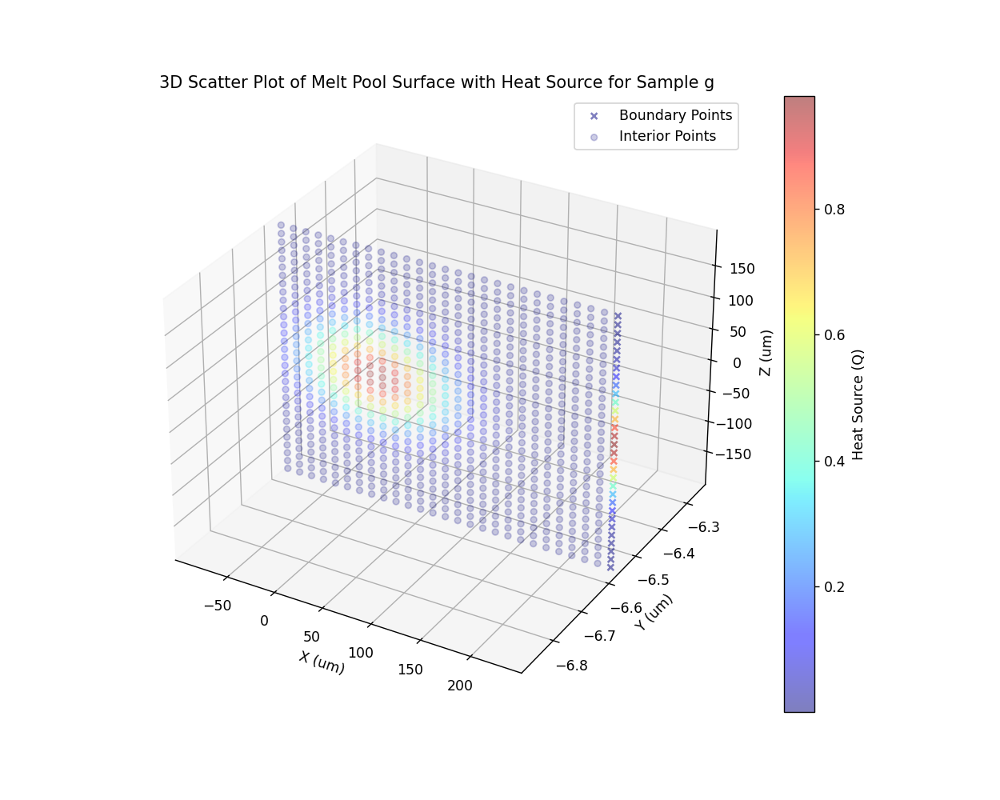

/tmp/ipykernel_56614/394063617.py:43: UserWarning: Attempting to set identical bottom == top == -6.567500114440918 results in singular transformations; automatically expanding.
  ax.set_ylim([filtered_coords[:, 1].min(), filtered_coords[:, 1].max()])


In [19]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Parameters for heat source (convert them to PyTorch tensors)
power = torch.tensor(global_power_max)

# Loop through each sample and plot the 3D coordinates with heat source
for sample in sample_coordinates.keys():
    # Filter the coordinates to only include the plane with y coordinate closest to 0 and negative
    df_sample = data_frames[sample]
    min_distance_to_zero = np.min(np.abs(df_sample[variables[1]].values))
    closest_to_zero_negative_y = df_sample[np.abs(df_sample[variables[1]].values) == min_distance_to_zero]
    closest_to_zero_negative_y = closest_to_zero_negative_y[closest_to_zero_negative_y[variables[1]] < 0]
    
    filtered_coords = sample_coordinates[sample][(sample_coordinates[sample][:, 1] == closest_to_zero_negative_y[variables[1]].values[0]).nonzero().squeeze(), :]
    boundary_coords = sample_boundary_coordinates[sample][(sample_boundary_coordinates[sample][:, 1] == closest_to_zero_negative_y[variables[1]].values[0]).nonzero().squeeze(), :]
    interior_coords = sample_interior_coordinates[sample][(sample_interior_coordinates[sample][:, 1] == closest_to_zero_negative_y[variables[1]].values[0]).nonzero().squeeze(), :]
    
    # Compute heat source for the boundary and interior coordinates
    Q_values_boundary = heat_source(boundary_coords / 1000, power, spot_radius, eta)
    Q_values_interior = heat_source(interior_coords / 1000, power, spot_radius, eta)
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Scatter plot in 3D colored by heat source values for boundary points
    scatter_boundary = ax.scatter(boundary_coords[:, 0], boundary_coords[:, 1], boundary_coords[:, 2], 
                                  c=Q_values_boundary, cmap=cm.jet, marker='x', alpha=0.5, label='Boundary Points')
    
    # Scatter plot in 3D colored by heat source values for interior points
    scatter_interior = ax.scatter(interior_coords[:, 0], interior_coords[:, 1], interior_coords[:, 2], 
                                  c=Q_values_interior, cmap=cm.jet, marker='o', alpha=0.2, label='Interior Points')
 
    
    # Add a color bar to indicate heat source values
    cbar = plt.colorbar(scatter_boundary)
    cbar.set_label('Heat Source (Q)')
    
    # Set axis limits to preserve actual proportions based on the filtered coordinates
    ax.set_xlim([filtered_coords[:, 0].min(), filtered_coords[:, 0].max()])
    ax.set_ylim([filtered_coords[:, 1].min(), filtered_coords[:, 1].max()])
    ax.set_zlim([filtered_coords[:, 2].min(), filtered_coords[:, 2].max()])
    
    # Labels and title
    ax.set_xlabel('X (um)')
    ax.set_ylabel('Y (um)')
    ax.set_zlabel('Z (um)')
    ax.set_title(f'3D Scatter Plot of Melt Pool Surface with Heat Source for Sample {sample}')
    ax.legend()
    
    plt.show()
    break


In [20]:
import torch
import torch.nn as nn

class TempFieldNN(nn.Module):
    def __init__(self, T_amb):
        super(TempFieldNN, self).__init__()

        # Define wide but shallow layers
        self.layer1 = nn.Linear(5, 4096)
        self.layer2 = nn.Linear(4096, 4096)
        self.layer_out = nn.Linear(4096, 1)

        # Initialize the bias of the output layer to T_amb
        nn.init.constant_(self.layer_out.bias, T_amb)

    def forward(self, x):
        # First layer followed by activation
        x1 = self.layer1(x)
        x1_act = torch.tanh(x1)

        # Second layer followed by activation
        x2 = self.layer2(x1_act)
        x2_act = torch.tanh(x2)

        # Residual connection using multiplication
        x_res = x1_act * x2_act

        # Output layer
        x_out = self.layer_out(x_res)
        
        return x_out


# Fluid Flow Neural Network
class FluidFlowNN(nn.Module):
    def __init__(self):
        super(FluidFlowNN, self).__init__()
        self.layer1 = nn.Linear(5, 2048*4)
        self.layer2 = nn.Linear(2048*4, 512*4)
        self.layer_out = nn.Linear(512*4, 3)
        self.silu = nn.SiLU()
        
    def forward(self, x):
        x = self.layer1(x)
        x = self.silu(x)
        x = self.layer2(x)
        x = self.silu(x)
        x = self.layer_out(x)
        return x

# Instantiate the neural networks
temp_net = TempFieldNN(T_amb)
fluid_net = FluidFlowNN()

# Print the architectures
print("Temperature Field Neural Network architecture:")
print(temp_net)
print("\nFluid Flow Neural Network architecture:")
print(fluid_net)


Temperature Field Neural Network architecture:
TempFieldNN(
  (layer1): Linear(in_features=5, out_features=4096, bias=True)
  (layer2): Linear(in_features=4096, out_features=4096, bias=True)
  (layer_out): Linear(in_features=4096, out_features=1, bias=True)
)

Fluid Flow Neural Network architecture:
FluidFlowNN(
  (layer1): Linear(in_features=5, out_features=8192, bias=True)
  (layer2): Linear(in_features=8192, out_features=2048, bias=True)
  (layer_out): Linear(in_features=2048, out_features=3, bias=True)
  (silu): SiLU()
)


Next steps: 
- write a function to normalize the network input
- output can stay unnormalized 
- write function to generate boundary data at random 
- remember to use cross-validation
- write custom loss 

In [21]:
def normalize_tensor(tensor, min_val, max_val):
    """
    Normalize a tensor to range [-1, 1].

    Parameters:
        tensor (torch.Tensor): The tensor to normalize.
        min_val (float): The minimum value for normalization.
        max_val (float): The maximum value for normalization.

    Returns:
        torch.Tensor: The normalized tensor.
    """
    return ((tensor - min_val) / (max_val - min_val)) * 2 - 1

In [22]:
def normalize_coordinates(tensor, x_min, x_max, y_min, y_max, z_min, z_max):
    normalized_tensor = tensor.clone()  # Create a new tensor
    normalized_tensor[:, 0] = ((tensor[:, 0] - x_min) / (x_max - x_min)) * 2 - 1  # Normalize x
    normalized_tensor[:, 1] = ((tensor[:, 1] - y_min) / (y_max - y_min)) * 2 - 1  # Normalize y
    normalized_tensor[:, 2] = ((tensor[:, 2] - z_min) / (z_max - z_min)) * 2 - 1  # Normalize z
    return normalized_tensor


In [23]:
from torch.utils.data import DataLoader, TensorDataset

# Create a list of sample identifiers
sample_identifiers = list(sample_coordinates.keys())
sample_identifiers

['g', 'd', 'c', 'a', 'e', 'f', 'b']

In [24]:
from torch.utils.data import DataLoader, Dataset, TensorDataset
import torch

# Custom Dataset to handle sample-specific data
class SampleSpecificDataset(Dataset):
    def __init__(self, sample_data_list):
        self.data_list = sample_data_list
    
    def __len__(self):
        return len(self.data_list)
    
    def __getitem__(self, index):
        return self.data_list[index]

def create_data_loader(exclude_sample, x_max, x_min, y_max, y_min, z_max, z_min, 
                       sample_coordinates, sample_boundary_coordinates, sample_interior_coordinates, 
                       conditions_df, data_frames, verbose=False):
    
    if (verbose):
        print("Starting the create_data_loader function...")
    
    training_data_list = []
    validation_data_list = []
    
    if (verbose):
        print("Initialized empty lists for storing sample-specific data.")
    
    for sample in sample_coordinates.keys():
        
        if (verbose):
            print('----'*8)
            print(f"Processing sample: {sample}")
        
        # Extract and normalize conditions
        condition_row = conditions_df[conditions_df['Sample Name'] == sample]
        speed = condition_row['Speed (mm/s)'].values[0]
        power = condition_row['Power (W)'].values[0]
        
        if (verbose):
            print(f"Extracted conditions - Speed: {speed}, Power: {power}")
        
        norm_speed = normalize_tensor(torch.tensor([speed]), global_speed_min, global_speed_max)
        norm_power = normalize_tensor(torch.tensor([power]), global_power_min, global_power_max)
        
        if (verbose):
            print(f"Normalized conditions - Speed: {norm_speed.item()}, Power: {norm_power.item()}")
        
        # Capture min and max values before normalization for boundary coordinates
        boundary_min_before = sample_boundary_coordinates[sample].min(dim=0).values
        boundary_max_before = sample_boundary_coordinates[sample].max(dim=0).values
        if (verbose):
            print(f"Boundary Min values before normalization: {boundary_min_before}")
        if (verbose):
            print(f"Boundary Max values before normalization: {boundary_max_before}")

        # Normalize coordinates
        boundary_coords = normalize_coordinates(sample_boundary_coordinates[sample], x_min, x_max, y_min, y_max, z_min, z_max)
        interior_coords = normalize_coordinates(sample_interior_coordinates[sample], x_min, x_max, y_min, y_max, z_min, z_max)

        # Capture min and max values after normalization for boundary coordinates
        boundary_min_after = boundary_coords.min(dim=0).values
        boundary_max_after = boundary_coords.max(dim=0).values
        if (verbose):
            print(f"Boundary Min values after normalization: {boundary_min_after}")
        if (verbose):
            print(f"Boundary Max values after normalization: {boundary_max_after}")
        
        if (verbose):
            print(f"Normalized coordinates. Shape (Boundary): {boundary_coords.shape}, Shape (Interior): {interior_coords.shape}")
        
        # Create condition tensors by repeating the speed and power values
        num_boundary_coords = len(boundary_coords)
        num_interior_coords = len(interior_coords)
        
        condition_boundary = torch.stack([norm_speed.repeat(num_boundary_coords), norm_power.repeat(num_boundary_coords)], dim=1)
        condition_interior = torch.stack([norm_speed.repeat(num_interior_coords), norm_power.repeat(num_interior_coords)], dim=1)
        
        # Concatenate coordinates and conditions
        boundary_data = torch.cat([boundary_coords, condition_boundary], dim=1)
        interior_data = torch.cat([interior_coords, condition_interior], dim=1)
        
        # Append to sample-specific data list
        if sample == exclude_sample:
            validation_data_list.append({'boundary': boundary_data, 'interior': interior_data, 'sample': sample})
        else:
            training_data_list.append({'boundary': boundary_data, 'interior': interior_data, 'sample': sample})
    
    # Create PyTorch Data Loaders using custom dataset
    train_loader = DataLoader(SampleSpecificDataset(training_data_list), batch_size=1, shuffle=True)
    val_loader = DataLoader(SampleSpecificDataset(validation_data_list), batch_size=1, shuffle=False)
    
    if (verbose):
        print("Created PyTorch Data Loaders.")
    
    return train_loader, val_loader


In [25]:
conditions_df['Sample Name'][0]

'a'

In [26]:
# Create Data Loaders
train_loader, val_loader = create_data_loader(conditions_df['Sample Name'][0], global_x_max, global_x_min, global_y_max, 
                                              global_y_min, global_z_max, global_z_min,
                                              sample_coordinates, sample_boundary_coordinates,
                                              sample_interior_coordinates, conditions_df, data_frames)

In [27]:
def unnormalize_tensor(tensor, min_val, max_val):
    """
    Unnormalize a tensor from range [-1, 1] to original range.

    Parameters:
        tensor (torch.Tensor): The tensor to unnormalize.
        min_val (float): The minimum value for unnormalization.
        max_val (float): The maximum value for unnormalization.

    Returns:
        torch.Tensor: The unnormalized tensor.
    """
    return ((tensor + 1) / 2) * (max_val - min_val) + min_val

def unnormalize_coordinates(tensor, x_min, x_max, y_min, y_max, z_min, z_max):
    """
    Unnormalize the x, y, and z coordinates in a tensor to the original range.

    Parameters:
        tensor (torch.Tensor): The tensor to unnormalize. Shape: [N, 3]
        x_min, x_max (float): The minimum and maximum values for the x-coordinate.
        y_min, y_max (float): The minimum and maximum values for the y-coordinate.
        z_min, z_max (float): The minimum and maximum values for the z-coordinate.

    Returns:
        torch.Tensor: The unnormalized tensor. Shape: [N, 3]
    """
    unnormalized_tensor = tensor.clone()  # Create a new tensor
    unnormalized_tensor[:, 0] = ((tensor[:, 0] + 1) * (x_max - x_min) / 2) + x_min  # Unnormalize x
    unnormalized_tensor[:, 1] = ((tensor[:, 1] + 1) * (y_max - y_min) / 2) + y_min  # Unnormalize y
    unnormalized_tensor[:, 2] = ((tensor[:, 2] + 1) * (z_max - z_min) / 2) + z_min  # Unnormalize z
    
    return unnormalized_tensor


<IPython.core.display.Javascript object>


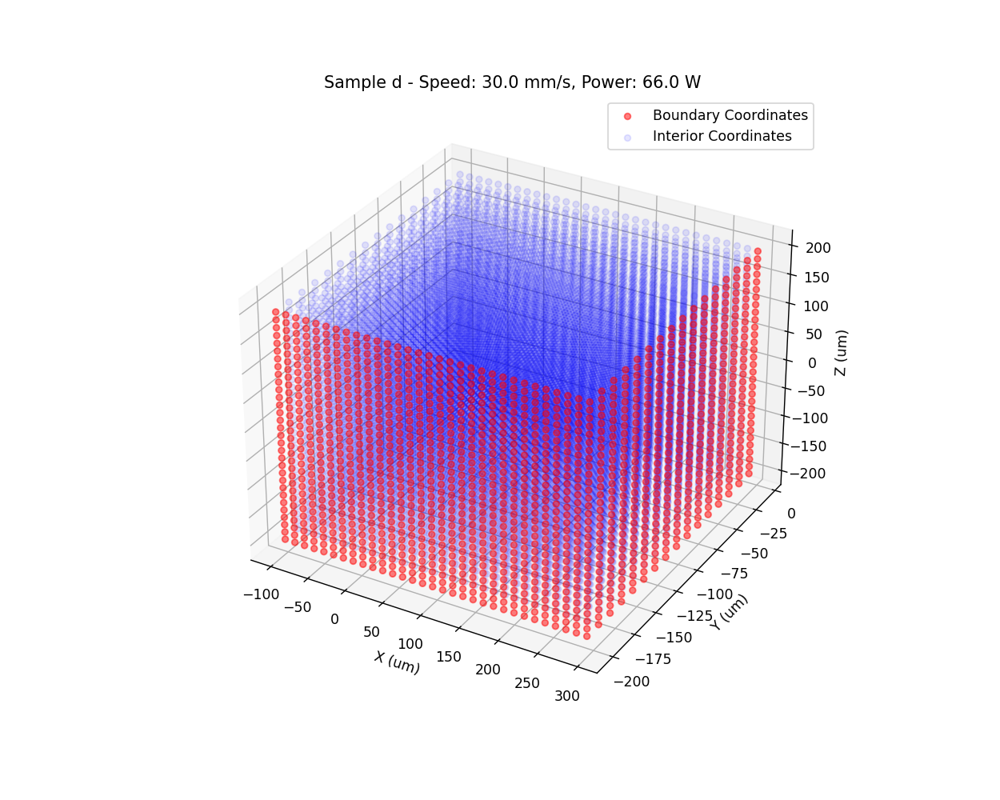

<IPython.core.display.Javascript object>


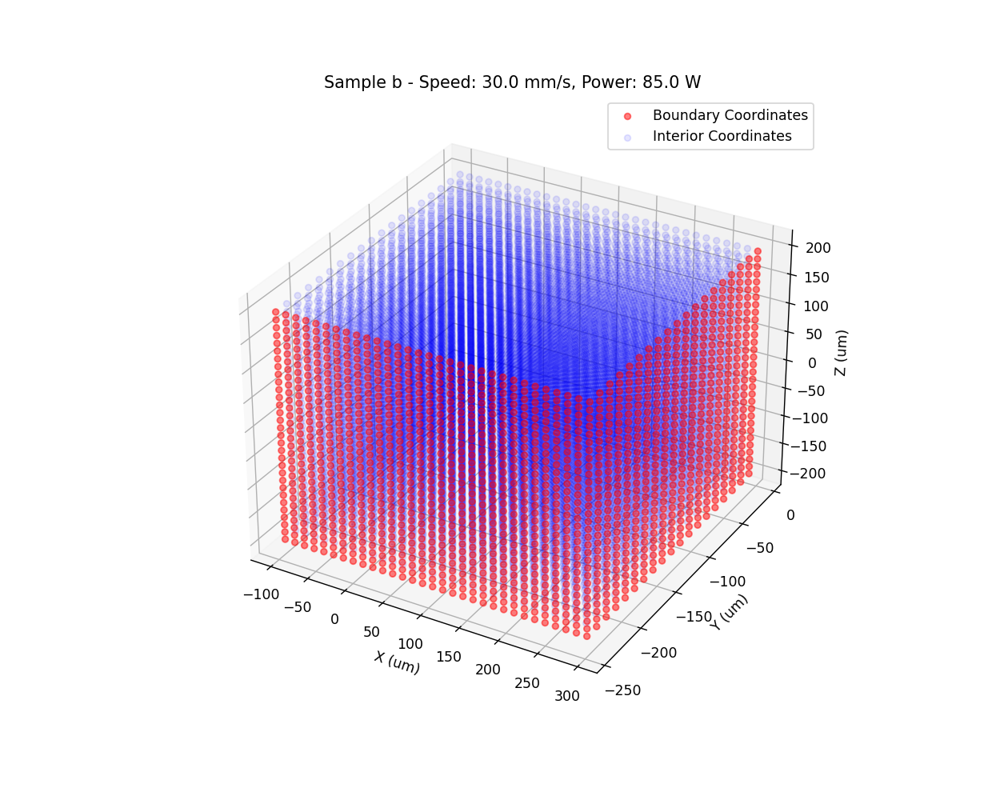

<IPython.core.display.Javascript object>


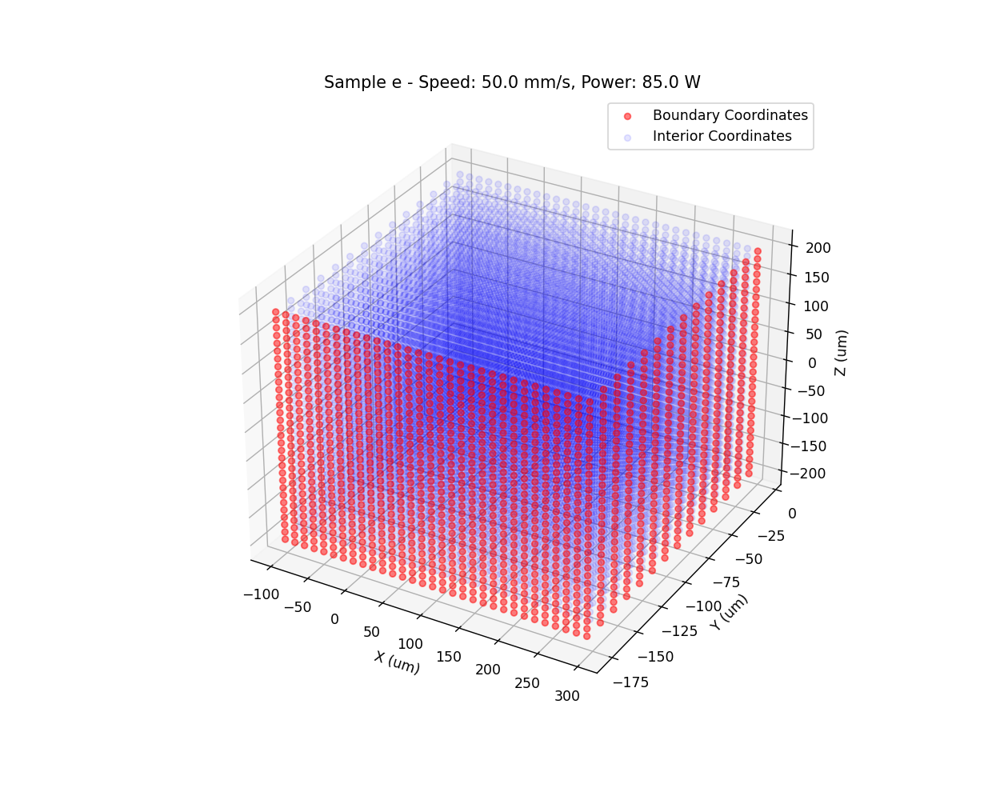

<IPython.core.display.Javascript object>


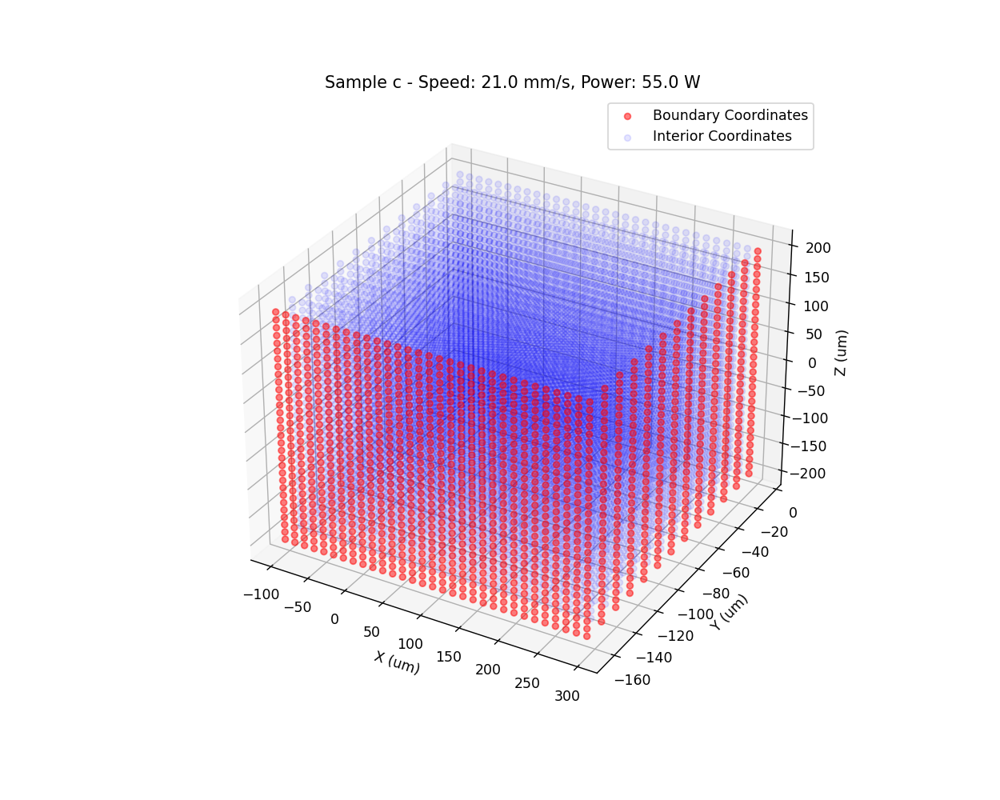

<IPython.core.display.Javascript object>


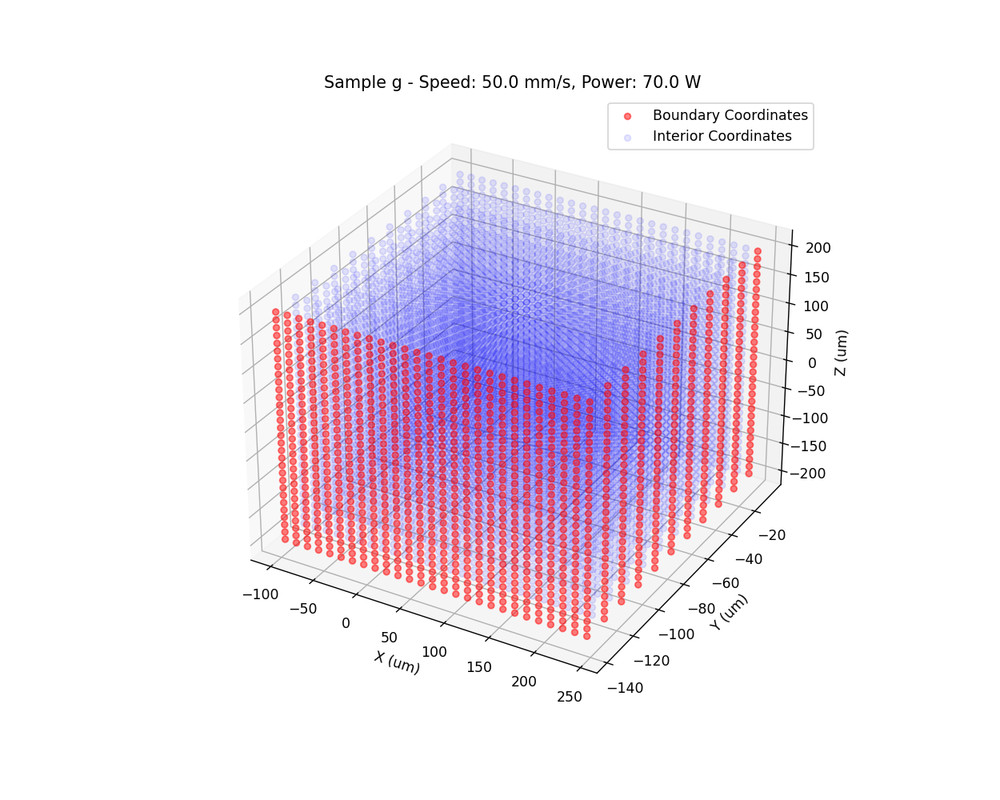

<IPython.core.display.Javascript object>


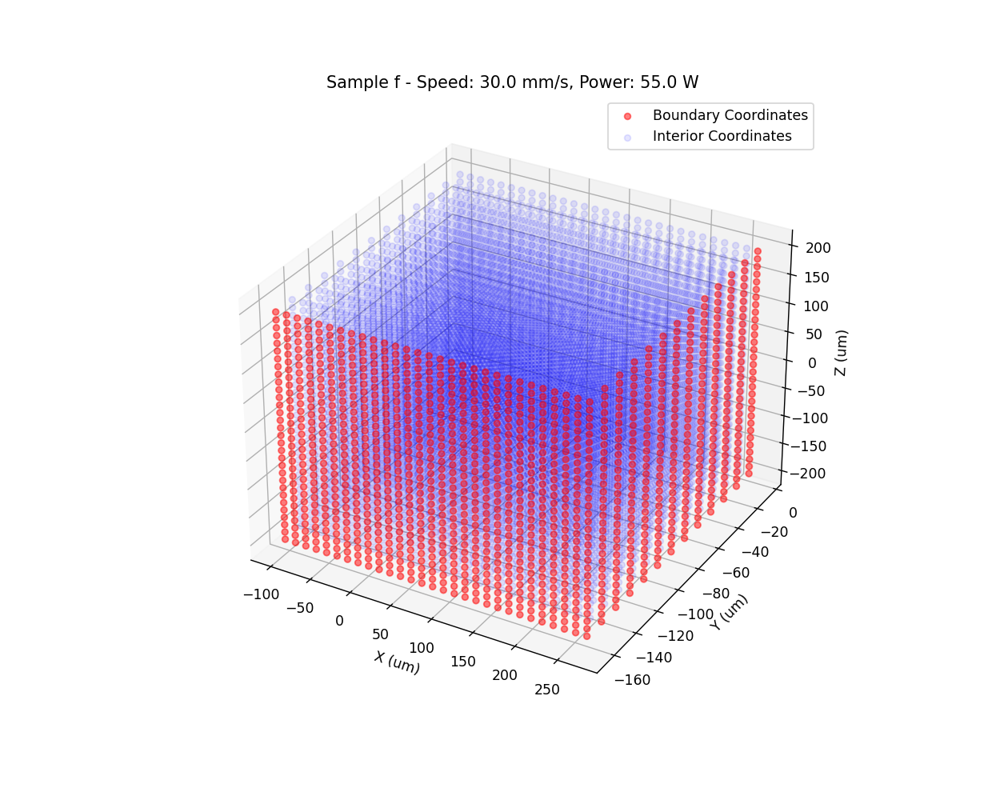

In [28]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Loop through each sample in the training DataLoader
for i, sample_data in enumerate(train_loader, 0):
    # Get the boundary and interior data for the current sample
    boundary_data = sample_data['boundary'][0]
    interior_data = sample_data['interior'][0]
    sample_name = sample_data['sample'][0]

    # Separate the coordinates and conditions
    boundary_coords = boundary_data[:, :3]
    boundary_conditions = boundary_data[:, 3:]

    interior_coords = interior_data[:, :3]
    interior_conditions = interior_data[:, 3:]

    # Unnormalize coordinates
    boundary_coords_unnorm = unnormalize_coordinates(boundary_coords, global_x_min, global_x_max, global_y_min, global_y_max, global_z_min, global_z_max)
    interior_coords_unnorm = unnormalize_coordinates(interior_coords, global_x_min, global_x_max, global_y_min, global_y_max, global_z_min, global_z_max)

    # Unnormalize conditions
    speed_condition = unnormalize_tensor(boundary_conditions[0, 0], global_speed_min, global_speed_max)
    power_condition = unnormalize_tensor(boundary_conditions[0, 1], global_power_min, global_power_max)

    # Create the 3D scatter plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot boundary coordinates in red
    ax.scatter(boundary_coords_unnorm[:, 0], boundary_coords_unnorm[:, 1], boundary_coords_unnorm[:, 2], c='r', marker='o', alpha=0.5, label='Boundary Coordinates')
    
    # Plot interior coordinates in blue
    ax.scatter(interior_coords_unnorm[:, 0], interior_coords_unnorm[:, 1], interior_coords_unnorm[:, 2], c='b', marker='o', alpha=0.1, label='Interior Coordinates')

    # Labels and title with conditions
    ax.set_xlabel('X (um)')
    ax.set_ylabel('Y (um)')
    ax.set_zlabel('Z (um)')
    ax.set_title(f'Sample {sample_name} - Speed: {speed_condition} mm/s, Power: {power_condition} W')
    ax.legend()

    plt.show()


<IPython.core.display.Javascript object>


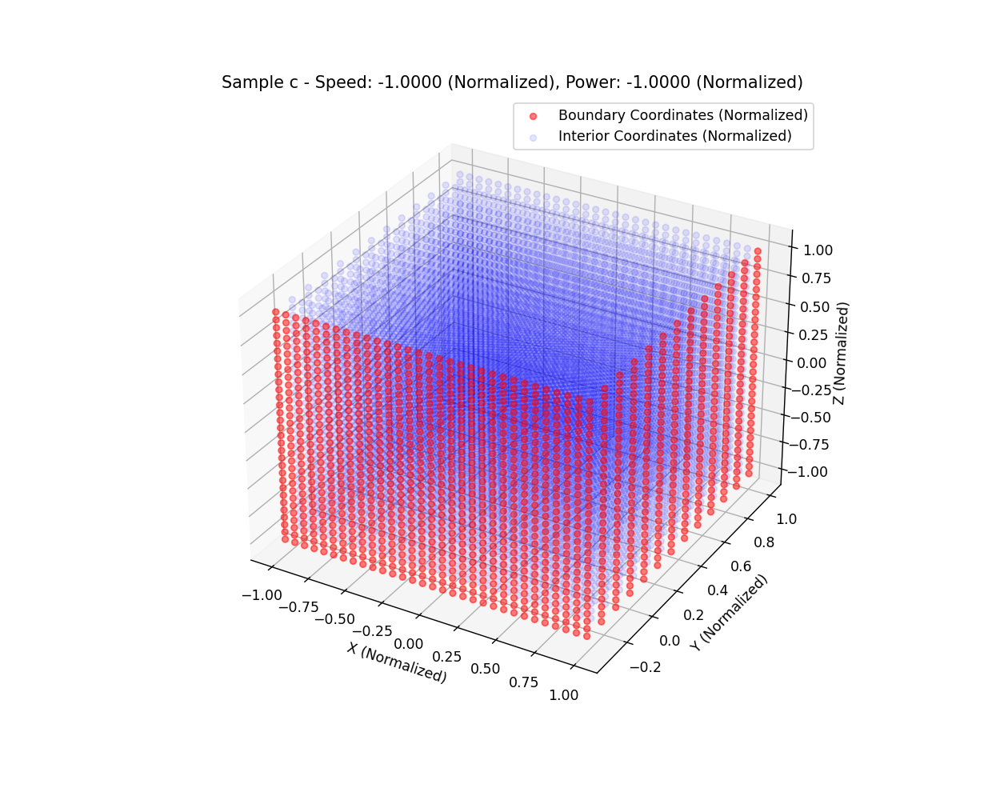

<IPython.core.display.Javascript object>


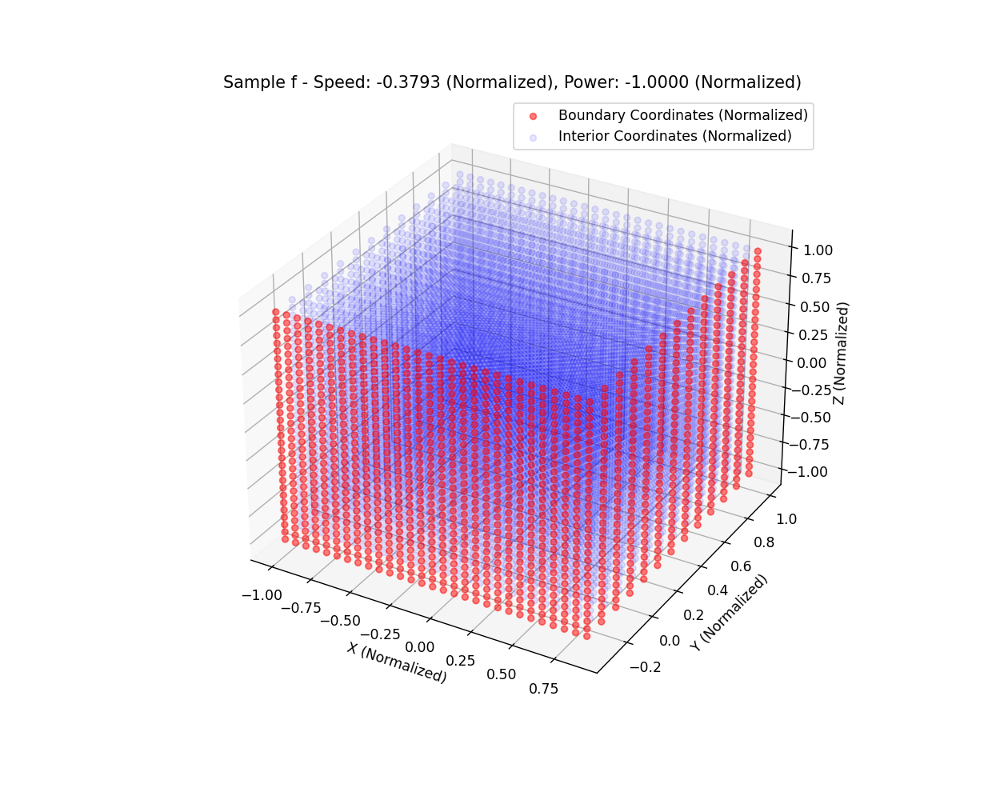

<IPython.core.display.Javascript object>


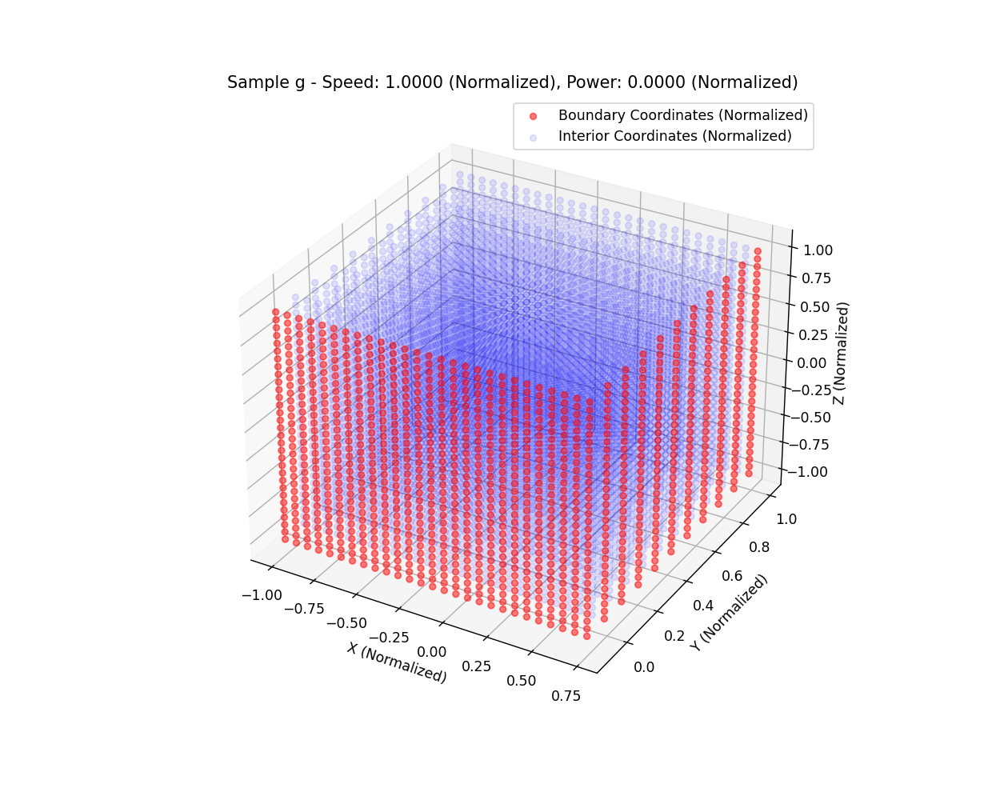

<IPython.core.display.Javascript object>


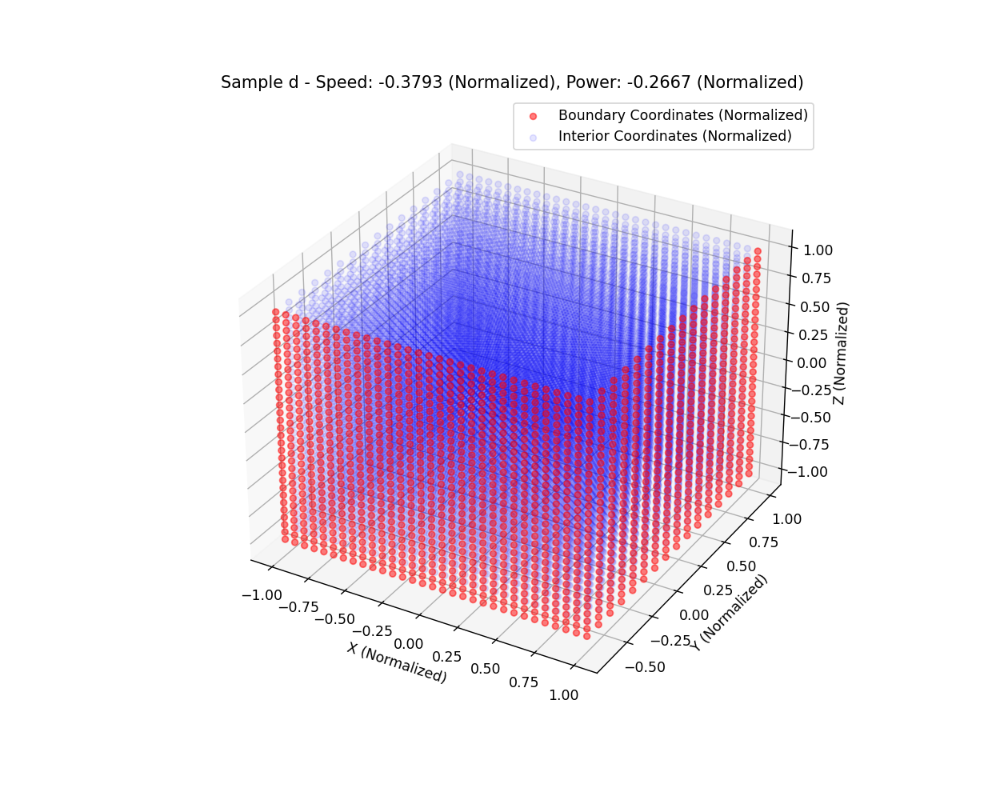

<IPython.core.display.Javascript object>


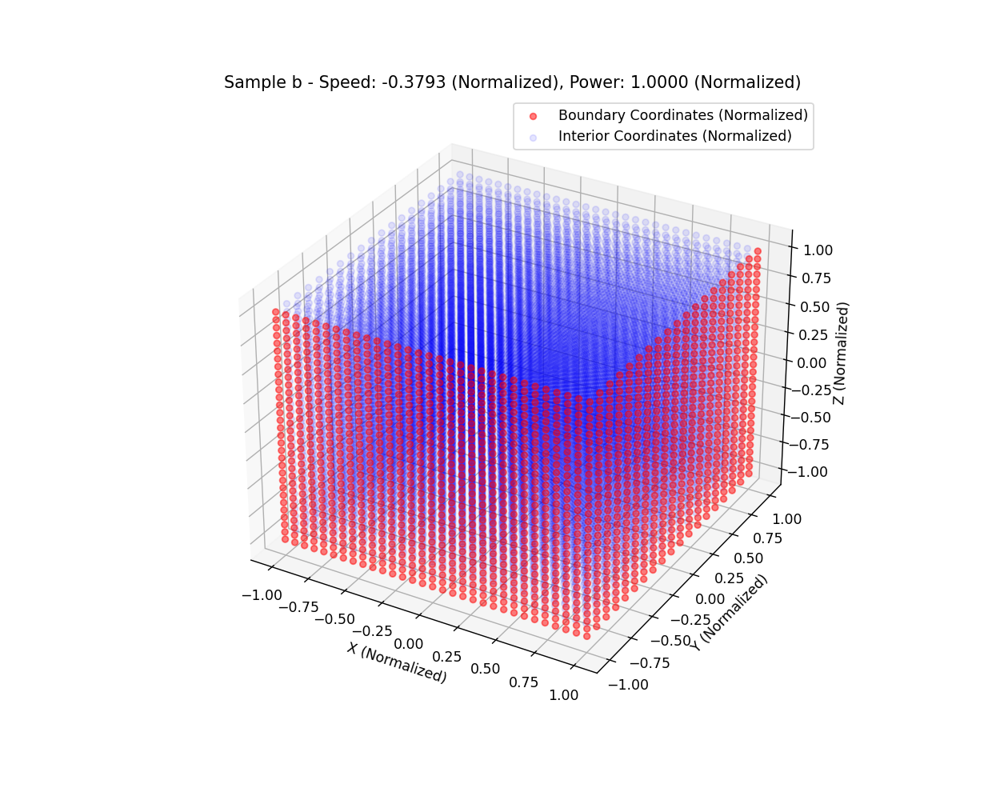

<IPython.core.display.Javascript object>


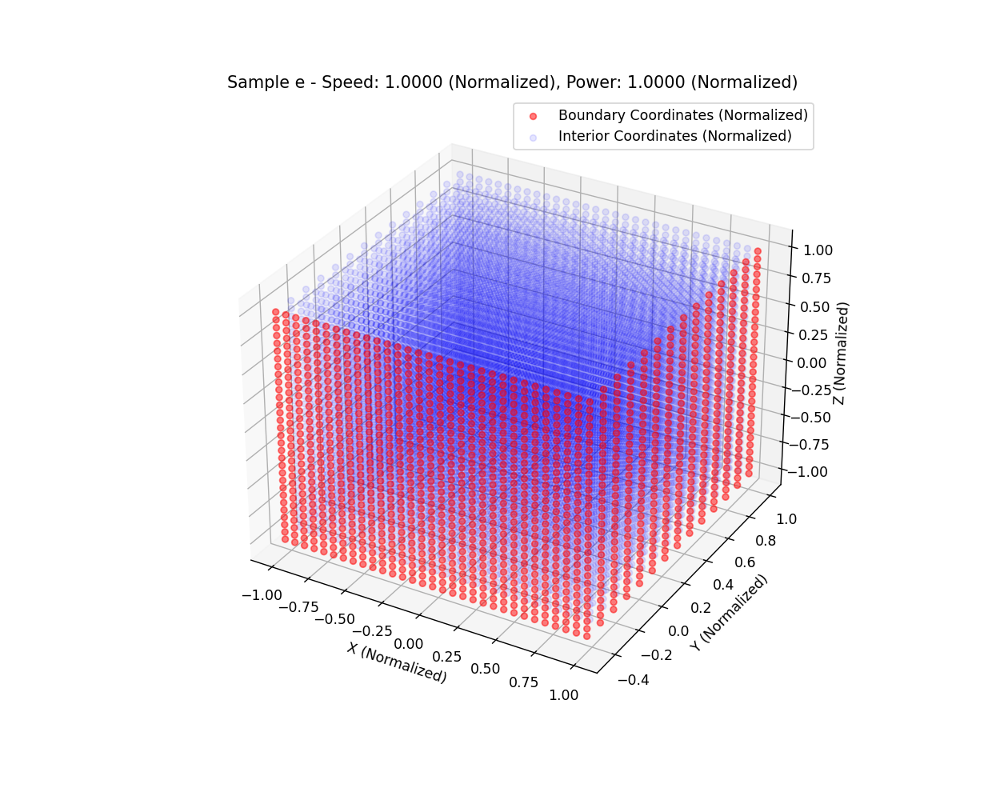

In [29]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Loop through each batch in the training DataLoader
for i, sample_data in enumerate(train_loader, 0):
    # Get the boundary and interior data for the current sample
    boundary_data = sample_data['boundary'][0]
    interior_data = sample_data['interior'][0]
    sample_name = sample_data['sample'][0]

    # Separate the coordinates and conditions
    boundary_coords = boundary_data[:, :3]
    boundary_conditions = boundary_data[:, 3:]

    interior_coords = interior_data[:, :3]
    interior_conditions = interior_data[:, 3:]

    # Extract conditions (no need to unnormalize here)
    speed_condition = boundary_conditions[0, 0]
    power_condition = boundary_conditions[0, 1]

    # Create the 3D scatter plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot boundary coordinates in red
    ax.scatter(boundary_coords[:, 0], boundary_coords[:, 1], boundary_coords[:, 2], c='r', marker='o', alpha=0.5, label='Boundary Coordinates (Normalized)')
    
    # Plot interior coordinates in blue
    ax.scatter(interior_coords[:, 0], interior_coords[:, 1], interior_coords[:, 2], c='b', marker='o', alpha=0.1, label='Interior Coordinates (Normalized)')

    # Labels and title with conditions
    ax.set_xlabel('X (Normalized)')
    ax.set_ylabel('Y (Normalized)')
    ax.set_zlabel('Z (Normalized)')
    ax.set_title(f'Sample {sample_name} - Speed: {speed_condition:.4f} (Normalized), Power: {power_condition:.4f} (Normalized)')
    ax.legend()

    plt.show()


In [30]:
# Set up the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [32]:
from torch.optim import LBFGS, Adam

# Initialize Neural Networks
#temp_net = TempFieldNN(300.0).to(device).train()

# Initialize Optimizer
params = list(temp_net.parameters())
#optimizer = LBFGS(params, line_search_fn="strong_wolfe") # Adam(params, lr=1e-3) #
optimizer = Adam(params, lr=1e-4) #

# Loss function
criterion = nn.MSELoss()

# List of all sample names
all_samples = conditions_df['Sample Name'].tolist()

exclude_sample = all_samples[0]

print(f"Excluding sample: {exclude_sample} for validation.")

# Create Data Loaders
train_loader, val_loader = create_data_loader(exclude_sample, global_x_max, global_x_min, global_y_max, 
                                              global_y_min, global_z_max, global_z_min,
                                              sample_coordinates, sample_boundary_coordinates,
                                              sample_interior_coordinates, conditions_df, data_frames)

for i, sample_data in enumerate(train_loader, 0):
    boundary_data = sample_data['boundary'][0].to(device)
    interior_data = sample_data['interior'][0].to(device)
    sample_name = sample_data['sample'][0]

    # Unnormalize conditions
    speed = unnormalize_tensor(interior_data[:, 3], global_speed_min, global_speed_max)
    power = unnormalize_tensor(interior_data[:, 4], global_power_min, global_power_max)

    # Unnormalize coordinates
    interior_coords_unnorm = unnormalize_coordinates(interior_data[:, :3], global_x_min, 
                                                     global_x_max, global_y_min, 
                                                     global_y_max, global_z_min, global_z_max)

    print(f"Processing sample: {sample_name}")

    # Set the coordinates to require gradient computation
    boundary_data.requires_grad = True
    interior_data.requires_grad = True

    # Compute heat source for the interior coordinates
    Q_values_interior = heat_source(interior_coords_unnorm / 1000, power, spot_radius, eta)  
    break

# Inner training loop
for epoch in range(num_epochs):  
    loss_epoch = 0.0
          

    def closure():
        optimizer.zero_grad()
        # Initialize total loss
        total_loss = 0.0

        # Temperature Boundary Computations
        temp_at_boundary = temp_net(boundary_data)

        # Compute temperature gradients at the boundary
        temp_gradients_boundary = torch.autograd.grad(
            temp_at_boundary.sum(), boundary_data,
            create_graph=True, retain_graph=True
        )[0][:, :3]

        # Compute the adiabatic residual at the boundary
        adiabatic_residual_boundary = torch.mean(temp_gradients_boundary ** 2)
        total_loss += adiabatic_residual_boundary

        # Compute temperature residual at the boundary
        temp_residual_boundary = temp_at_boundary - T_amb
        temp_residual_boundary_mean = torch.mean(temp_residual_boundary ** 2)
        total_loss += temp_residual_boundary_mean

        # Temperature Interior Computations
        temp_at_interior = temp_net(interior_data)

        # Compute temperature gradients at the interior
        temp_gradients_interior = torch.autograd.grad(
            temp_at_interior.sum(), interior_data,
            create_graph=True, retain_graph=True
        )[0]

        # Compute second partial derivatives (Laplacian components) for temperature at the interior
        temp_gradients_interior_second = torch.autograd.grad(
            temp_gradients_interior.sum(), interior_data,
            create_graph=True, retain_graph=True
        )[0][:, :3]

        # Compute the Laplacian of temperature at the interior
        temp_laplacian_interior = temp_gradients_interior_second.sum(dim=1)

        # Compute the heat equation residual
        heat_equation_residual = (
            rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
            - kappa * temp_laplacian_interior + Q_values_interior
        )

        # Compute the mean square of the heat equation residual
        heat_equation_residual_mean = torch.mean(heat_equation_residual ** 2)

        # Add heat equation residual to the total loss
        total_loss += heat_equation_residual_mean

        # Add Penalty for Negative Temperatures
        negative_temp_penalty = torch.nn.ReLU()(-temp_at_interior)
        negative_temp_penalty_mean = torch.mean(negative_temp_penalty ** 2)

        # Add negative temperature penalty to the total loss
        total_loss += negative_temp_penalty_mean

        total_loss.backward()
        return total_loss

    # Backward pass and optimization using L-BFGS
    loss = optimizer.step(closure)
    loss_epoch += loss.item()
    


    print(f"DONE with Epoch: {epoch}, Loss EPOCH: {loss_epoch}")  
print(f"Finished LOOCV for excluded sample: {exclude_sample}")

print("Finished all LOOCV cycles.")


Excluding sample: a for validation.
Processing sample: b
DONE with Epoch: 0, Loss EPOCH: 46689000.0
DONE with Epoch: 1, Loss EPOCH: 46586072.0
DONE with Epoch: 2, Loss EPOCH: 46540620.0
DONE with Epoch: 3, Loss EPOCH: 46530208.0
DONE with Epoch: 4, Loss EPOCH: 46526752.0
DONE with Epoch: 5, Loss EPOCH: 46520096.0
DONE with Epoch: 6, Loss EPOCH: 46511044.0
DONE with Epoch: 7, Loss EPOCH: 46501712.0
DONE with Epoch: 8, Loss EPOCH: 46493644.0
DONE with Epoch: 9, Loss EPOCH: 46487700.0
DONE with Epoch: 10, Loss EPOCH: 46483820.0
DONE with Epoch: 11, Loss EPOCH: 46481084.0
DONE with Epoch: 12, Loss EPOCH: 46478332.0
DONE with Epoch: 13, Loss EPOCH: 46474924.0
DONE with Epoch: 14, Loss EPOCH: 46471004.0
DONE with Epoch: 15, Loss EPOCH: 46467208.0
DONE with Epoch: 16, Loss EPOCH: 46464132.0
DONE with Epoch: 17, Loss EPOCH: 46461936.0
DONE with Epoch: 18, Loss EPOCH: 46460376.0
DONE with Epoch: 19, Loss EPOCH: 46458960.0
DONE with Epoch: 20, Loss EPOCH: 46457324.0
DONE with Epoch: 21, Loss EPO

DONE with Epoch: 184, Loss EPOCH: 46095832.0
DONE with Epoch: 185, Loss EPOCH: 46091904.0
DONE with Epoch: 186, Loss EPOCH: 46087960.0
DONE with Epoch: 187, Loss EPOCH: 46083988.0
DONE with Epoch: 188, Loss EPOCH: 46079960.0
DONE with Epoch: 189, Loss EPOCH: 46075880.0
DONE with Epoch: 190, Loss EPOCH: 46071776.0
DONE with Epoch: 191, Loss EPOCH: 46067636.0
DONE with Epoch: 192, Loss EPOCH: 46063460.0
DONE with Epoch: 193, Loss EPOCH: 46059244.0
DONE with Epoch: 194, Loss EPOCH: 46055000.0
DONE with Epoch: 195, Loss EPOCH: 46050720.0
DONE with Epoch: 196, Loss EPOCH: 46046448.0
DONE with Epoch: 197, Loss EPOCH: 46042160.0
DONE with Epoch: 198, Loss EPOCH: 46037808.0
DONE with Epoch: 199, Loss EPOCH: 46033416.0
DONE with Epoch: 200, Loss EPOCH: 46028996.0
DONE with Epoch: 201, Loss EPOCH: 46024556.0
DONE with Epoch: 202, Loss EPOCH: 46020084.0
DONE with Epoch: 203, Loss EPOCH: 46015584.0
DONE with Epoch: 204, Loss EPOCH: 46011028.0
DONE with Epoch: 205, Loss EPOCH: 46006432.0
DONE with 

DONE with Epoch: 367, Loss EPOCH: 44723384.0
DONE with Epoch: 368, Loss EPOCH: 44711664.0
DONE with Epoch: 369, Loss EPOCH: 44699904.0
DONE with Epoch: 370, Loss EPOCH: 44688128.0
DONE with Epoch: 371, Loss EPOCH: 44676292.0
DONE with Epoch: 372, Loss EPOCH: 44664412.0
DONE with Epoch: 373, Loss EPOCH: 44652480.0
DONE with Epoch: 374, Loss EPOCH: 44640516.0
DONE with Epoch: 375, Loss EPOCH: 44628536.0
DONE with Epoch: 376, Loss EPOCH: 44616576.0
DONE with Epoch: 377, Loss EPOCH: 44604572.0
DONE with Epoch: 378, Loss EPOCH: 44592604.0
DONE with Epoch: 379, Loss EPOCH: 44580356.0
DONE with Epoch: 380, Loss EPOCH: 44567984.0
DONE with Epoch: 381, Loss EPOCH: 44555392.0
DONE with Epoch: 382, Loss EPOCH: 44542916.0
DONE with Epoch: 383, Loss EPOCH: 44530608.0
DONE with Epoch: 384, Loss EPOCH: 44518396.0
DONE with Epoch: 385, Loss EPOCH: 44506200.0
DONE with Epoch: 386, Loss EPOCH: 44493852.0
DONE with Epoch: 387, Loss EPOCH: 44481380.0
DONE with Epoch: 388, Loss EPOCH: 44468664.0
DONE with 

DONE with Epoch: 550, Loss EPOCH: 41753096.0
DONE with Epoch: 551, Loss EPOCH: 41732836.0
DONE with Epoch: 552, Loss EPOCH: 41712532.0
DONE with Epoch: 553, Loss EPOCH: 41692452.0
DONE with Epoch: 554, Loss EPOCH: 41671624.0
DONE with Epoch: 555, Loss EPOCH: 41650648.0
DONE with Epoch: 556, Loss EPOCH: 41628436.0
DONE with Epoch: 557, Loss EPOCH: 41606268.0
DONE with Epoch: 558, Loss EPOCH: 41584340.0
DONE with Epoch: 559, Loss EPOCH: 41563132.0
DONE with Epoch: 560, Loss EPOCH: 41542460.0
DONE with Epoch: 561, Loss EPOCH: 41521844.0
DONE with Epoch: 562, Loss EPOCH: 41501324.0
DONE with Epoch: 563, Loss EPOCH: 41480196.0
DONE with Epoch: 564, Loss EPOCH: 41458784.0
DONE with Epoch: 565, Loss EPOCH: 41436896.0
DONE with Epoch: 566, Loss EPOCH: 41414904.0
DONE with Epoch: 567, Loss EPOCH: 41393144.0
DONE with Epoch: 568, Loss EPOCH: 41371592.0
DONE with Epoch: 569, Loss EPOCH: 41350284.0
DONE with Epoch: 570, Loss EPOCH: 41328908.0
DONE with Epoch: 571, Loss EPOCH: 41307520.0
DONE with 

DONE with Epoch: 733, Loss EPOCH: 37301020.0
DONE with Epoch: 734, Loss EPOCH: 37270384.0
DONE with Epoch: 735, Loss EPOCH: 37236656.0
DONE with Epoch: 736, Loss EPOCH: 37205440.0
DONE with Epoch: 737, Loss EPOCH: 37178072.0
DONE with Epoch: 738, Loss EPOCH: 37153092.0
DONE with Epoch: 739, Loss EPOCH: 37128040.0
DONE with Epoch: 740, Loss EPOCH: 37099568.0
DONE with Epoch: 741, Loss EPOCH: 37069240.0
DONE with Epoch: 742, Loss EPOCH: 37038248.0
DONE with Epoch: 743, Loss EPOCH: 37009268.0
DONE with Epoch: 744, Loss EPOCH: 36982372.0
DONE with Epoch: 745, Loss EPOCH: 36955964.0
DONE with Epoch: 746, Loss EPOCH: 36928752.0
DONE with Epoch: 747, Loss EPOCH: 36899508.0
DONE with Epoch: 748, Loss EPOCH: 36869560.0
DONE with Epoch: 749, Loss EPOCH: 36839836.0
DONE with Epoch: 750, Loss EPOCH: 36811176.0
DONE with Epoch: 751, Loss EPOCH: 36783416.0
DONE with Epoch: 752, Loss EPOCH: 36755764.0
DONE with Epoch: 753, Loss EPOCH: 36727732.0
DONE with Epoch: 754, Loss EPOCH: 36698772.0
DONE with 

DONE with Epoch: 916, Loss EPOCH: 31666908.0
DONE with Epoch: 917, Loss EPOCH: 31634862.0
DONE with Epoch: 918, Loss EPOCH: 31603090.0
DONE with Epoch: 919, Loss EPOCH: 31570722.0
DONE with Epoch: 920, Loss EPOCH: 31538820.0
DONE with Epoch: 921, Loss EPOCH: 31505986.0
DONE with Epoch: 922, Loss EPOCH: 31473126.0
DONE with Epoch: 923, Loss EPOCH: 31439204.0
DONE with Epoch: 924, Loss EPOCH: 31405440.0
DONE with Epoch: 925, Loss EPOCH: 31371332.0
DONE with Epoch: 926, Loss EPOCH: 31337466.0
DONE with Epoch: 927, Loss EPOCH: 31303900.0
DONE with Epoch: 928, Loss EPOCH: 31270796.0
DONE with Epoch: 929, Loss EPOCH: 31237978.0
DONE with Epoch: 930, Loss EPOCH: 31205382.0
DONE with Epoch: 931, Loss EPOCH: 31173000.0
DONE with Epoch: 932, Loss EPOCH: 31140732.0
DONE with Epoch: 933, Loss EPOCH: 31108614.0
DONE with Epoch: 934, Loss EPOCH: 31076686.0
DONE with Epoch: 935, Loss EPOCH: 31045264.0
DONE with Epoch: 936, Loss EPOCH: 31014114.0
DONE with Epoch: 937, Loss EPOCH: 30984102.0
DONE with 

DONE with Epoch: 1096, Loss EPOCH: 25761266.0
DONE with Epoch: 1097, Loss EPOCH: 25729372.0
DONE with Epoch: 1098, Loss EPOCH: 25696248.0
DONE with Epoch: 1099, Loss EPOCH: 25663250.0
DONE with Epoch: 1100, Loss EPOCH: 25628712.0
DONE with Epoch: 1101, Loss EPOCH: 25594152.0
DONE with Epoch: 1102, Loss EPOCH: 25558806.0
DONE with Epoch: 1103, Loss EPOCH: 25523850.0
DONE with Epoch: 1104, Loss EPOCH: 25489198.0
DONE with Epoch: 1105, Loss EPOCH: 25455204.0
DONE with Epoch: 1106, Loss EPOCH: 25421822.0
DONE with Epoch: 1107, Loss EPOCH: 25388956.0
DONE with Epoch: 1108, Loss EPOCH: 25356438.0
DONE with Epoch: 1109, Loss EPOCH: 25324130.0
DONE with Epoch: 1110, Loss EPOCH: 25292044.0
DONE with Epoch: 1111, Loss EPOCH: 25260054.0
DONE with Epoch: 1112, Loss EPOCH: 25228406.0
DONE with Epoch: 1113, Loss EPOCH: 25196794.0
DONE with Epoch: 1114, Loss EPOCH: 25165776.0
DONE with Epoch: 1115, Loss EPOCH: 25134520.0
DONE with Epoch: 1116, Loss EPOCH: 25104044.0
DONE with Epoch: 1117, Loss EPOCH:

DONE with Epoch: 1275, Loss EPOCH: 19979900.0
DONE with Epoch: 1276, Loss EPOCH: 19948332.0
DONE with Epoch: 1277, Loss EPOCH: 19916764.0
DONE with Epoch: 1278, Loss EPOCH: 19885206.0
DONE with Epoch: 1279, Loss EPOCH: 19853714.0
DONE with Epoch: 1280, Loss EPOCH: 19822230.0
DONE with Epoch: 1281, Loss EPOCH: 19790804.0
DONE with Epoch: 1282, Loss EPOCH: 19759348.0
DONE with Epoch: 1283, Loss EPOCH: 19727848.0
DONE with Epoch: 1284, Loss EPOCH: 19696318.0
DONE with Epoch: 1285, Loss EPOCH: 19665182.0
DONE with Epoch: 1286, Loss EPOCH: 19634298.0
DONE with Epoch: 1287, Loss EPOCH: 19603730.0
DONE with Epoch: 1288, Loss EPOCH: 19573642.0
DONE with Epoch: 1289, Loss EPOCH: 19544720.0
DONE with Epoch: 1290, Loss EPOCH: 19516496.0
DONE with Epoch: 1291, Loss EPOCH: 19490462.0
DONE with Epoch: 1292, Loss EPOCH: 19464954.0
DONE with Epoch: 1293, Loss EPOCH: 19442182.0
DONE with Epoch: 1294, Loss EPOCH: 19415620.0
DONE with Epoch: 1295, Loss EPOCH: 19388494.0
DONE with Epoch: 1296, Loss EPOCH:

DONE with Epoch: 1454, Loss EPOCH: 14617128.0
DONE with Epoch: 1455, Loss EPOCH: 14584664.0
DONE with Epoch: 1456, Loss EPOCH: 14553553.0
DONE with Epoch: 1457, Loss EPOCH: 14524826.0
DONE with Epoch: 1458, Loss EPOCH: 14498391.0
DONE with Epoch: 1459, Loss EPOCH: 14473196.0
DONE with Epoch: 1460, Loss EPOCH: 14447814.0
DONE with Epoch: 1461, Loss EPOCH: 14421529.0
DONE with Epoch: 1462, Loss EPOCH: 14393608.0
DONE with Epoch: 1463, Loss EPOCH: 14364796.0
DONE with Epoch: 1464, Loss EPOCH: 14335473.0
DONE with Epoch: 1465, Loss EPOCH: 14306574.0
DONE with Epoch: 1466, Loss EPOCH: 14278481.0
DONE with Epoch: 1467, Loss EPOCH: 14251281.0
DONE with Epoch: 1468, Loss EPOCH: 14224723.0
DONE with Epoch: 1469, Loss EPOCH: 14198424.0
DONE with Epoch: 1470, Loss EPOCH: 14172077.0
DONE with Epoch: 1471, Loss EPOCH: 14145366.0
DONE with Epoch: 1472, Loss EPOCH: 14118335.0
DONE with Epoch: 1473, Loss EPOCH: 14090897.0
DONE with Epoch: 1474, Loss EPOCH: 14063303.0
DONE with Epoch: 1475, Loss EPOCH:

DONE with Epoch: 1633, Loss EPOCH: 10213115.0
DONE with Epoch: 1634, Loss EPOCH: 10191587.0
DONE with Epoch: 1635, Loss EPOCH: 10170085.0
DONE with Epoch: 1636, Loss EPOCH: 10148616.0
DONE with Epoch: 1637, Loss EPOCH: 10127181.0
DONE with Epoch: 1638, Loss EPOCH: 10105776.0
DONE with Epoch: 1639, Loss EPOCH: 10084394.0
DONE with Epoch: 1640, Loss EPOCH: 10063030.0
DONE with Epoch: 1641, Loss EPOCH: 10041703.0
DONE with Epoch: 1642, Loss EPOCH: 10020442.0
DONE with Epoch: 1643, Loss EPOCH: 9999299.0
DONE with Epoch: 1644, Loss EPOCH: 9978271.0
DONE with Epoch: 1645, Loss EPOCH: 9957416.0
DONE with Epoch: 1646, Loss EPOCH: 9936793.0
DONE with Epoch: 1647, Loss EPOCH: 9916622.0
DONE with Epoch: 1648, Loss EPOCH: 9896995.0
DONE with Epoch: 1649, Loss EPOCH: 9878428.0
DONE with Epoch: 1650, Loss EPOCH: 9861039.0
DONE with Epoch: 1651, Loss EPOCH: 9846123.0
DONE with Epoch: 1652, Loss EPOCH: 9833234.0
DONE with Epoch: 1653, Loss EPOCH: 9824920.0
DONE with Epoch: 1654, Loss EPOCH: 9816649.0


DONE with Epoch: 1815, Loss EPOCH: 6898150.0
DONE with Epoch: 1816, Loss EPOCH: 6882769.5
DONE with Epoch: 1817, Loss EPOCH: 6867421.0
DONE with Epoch: 1818, Loss EPOCH: 6852110.0
DONE with Epoch: 1819, Loss EPOCH: 6836840.5
DONE with Epoch: 1820, Loss EPOCH: 6821612.0
DONE with Epoch: 1821, Loss EPOCH: 6806418.0
DONE with Epoch: 1822, Loss EPOCH: 6791259.0
DONE with Epoch: 1823, Loss EPOCH: 6776129.5
DONE with Epoch: 1824, Loss EPOCH: 6761027.5
DONE with Epoch: 1825, Loss EPOCH: 6745950.0
DONE with Epoch: 1826, Loss EPOCH: 6730897.5
DONE with Epoch: 1827, Loss EPOCH: 6715866.5
DONE with Epoch: 1828, Loss EPOCH: 6700861.0
DONE with Epoch: 1829, Loss EPOCH: 6685879.5
DONE with Epoch: 1830, Loss EPOCH: 6670923.0
DONE with Epoch: 1831, Loss EPOCH: 6655994.5
DONE with Epoch: 1832, Loss EPOCH: 6641093.5
DONE with Epoch: 1833, Loss EPOCH: 6626222.5
DONE with Epoch: 1834, Loss EPOCH: 6611383.0
DONE with Epoch: 1835, Loss EPOCH: 6596576.0
DONE with Epoch: 1836, Loss EPOCH: 6581807.0
DONE with 

DONE with Epoch: 1998, Loss EPOCH: 4569136.5
DONE with Epoch: 1999, Loss EPOCH: 4559638.5
DONE with Epoch: 2000, Loss EPOCH: 4549074.0
DONE with Epoch: 2001, Loss EPOCH: 4537845.0
DONE with Epoch: 2002, Loss EPOCH: 4526954.5
DONE with Epoch: 2003, Loss EPOCH: 4516885.5
DONE with Epoch: 2004, Loss EPOCH: 4507316.5
DONE with Epoch: 2005, Loss EPOCH: 4497577.5
DONE with Epoch: 2006, Loss EPOCH: 4487293.0
DONE with Epoch: 2007, Loss EPOCH: 4476695.5
DONE with Epoch: 2008, Loss EPOCH: 4466236.5
DONE with Epoch: 2009, Loss EPOCH: 4456184.0
DONE with Epoch: 2010, Loss EPOCH: 4446424.0
DONE with Epoch: 2011, Loss EPOCH: 4436643.0
DONE with Epoch: 2012, Loss EPOCH: 4426637.0
DONE with Epoch: 2013, Loss EPOCH: 4416431.0
DONE with Epoch: 2014, Loss EPOCH: 4406238.5
DONE with Epoch: 2015, Loss EPOCH: 4396229.0
DONE with Epoch: 2016, Loss EPOCH: 4386410.0
DONE with Epoch: 2017, Loss EPOCH: 4376654.0
DONE with Epoch: 2018, Loss EPOCH: 4366825.5
DONE with Epoch: 2019, Loss EPOCH: 4356889.5
DONE with 

DONE with Epoch: 2179, Loss EPOCH: 3019923.75
DONE with Epoch: 2180, Loss EPOCH: 3012549.5
DONE with Epoch: 2181, Loss EPOCH: 3005697.5
DONE with Epoch: 2182, Loss EPOCH: 2999332.25
DONE with Epoch: 2183, Loss EPOCH: 2992949.75
DONE with Epoch: 2184, Loss EPOCH: 2986163.5
DONE with Epoch: 2185, Loss EPOCH: 2979087.0
DONE with Epoch: 2186, Loss EPOCH: 2972073.75
DONE with Epoch: 2187, Loss EPOCH: 2965379.75
DONE with Epoch: 2188, Loss EPOCH: 2958919.25
DONE with Epoch: 2189, Loss EPOCH: 2952420.5
DONE with Epoch: 2190, Loss EPOCH: 2945743.5
DONE with Epoch: 2191, Loss EPOCH: 2938927.5
DONE with Epoch: 2192, Loss EPOCH: 2932129.75
DONE with Epoch: 2193, Loss EPOCH: 2925495.75
DONE with Epoch: 2194, Loss EPOCH: 2919020.5
DONE with Epoch: 2195, Loss EPOCH: 2912558.0
DONE with Epoch: 2196, Loss EPOCH: 2905983.0
DONE with Epoch: 2197, Loss EPOCH: 2899336.75
DONE with Epoch: 2198, Loss EPOCH: 2892713.75
DONE with Epoch: 2199, Loss EPOCH: 2886162.25
DONE with Epoch: 2200, Loss EPOCH: 2879688.2

DONE with Epoch: 2359, Loss EPOCH: 2015269.375
DONE with Epoch: 2360, Loss EPOCH: 2012691.0
DONE with Epoch: 2361, Loss EPOCH: 2002744.125
DONE with Epoch: 2362, Loss EPOCH: 1992252.5
DONE with Epoch: 2363, Loss EPOCH: 1987112.375
DONE with Epoch: 2364, Loss EPOCH: 1986503.0
DONE with Epoch: 2365, Loss EPOCH: 1985088.75
DONE with Epoch: 2366, Loss EPOCH: 1979357.375
DONE with Epoch: 2367, Loss EPOCH: 1971325.875
DONE with Epoch: 2368, Loss EPOCH: 1964870.625
DONE with Epoch: 2369, Loss EPOCH: 1961537.75
DONE with Epoch: 2370, Loss EPOCH: 1959374.625
DONE with Epoch: 2371, Loss EPOCH: 1955636.0
DONE with Epoch: 2372, Loss EPOCH: 1949846.125
DONE with Epoch: 2373, Loss EPOCH: 1943644.625
DONE with Epoch: 2374, Loss EPOCH: 1938873.0
DONE with Epoch: 2375, Loss EPOCH: 1935582.125
DONE with Epoch: 2376, Loss EPOCH: 1932331.75
DONE with Epoch: 2377, Loss EPOCH: 1927934.375
DONE with Epoch: 2378, Loss EPOCH: 1922560.5
DONE with Epoch: 2379, Loss EPOCH: 1917420.875
DONE with Epoch: 2380, Loss 

DONE with Epoch: 2537, Loss EPOCH: 1344928.0
DONE with Epoch: 2538, Loss EPOCH: 1341850.875
DONE with Epoch: 2539, Loss EPOCH: 1338852.875
DONE with Epoch: 2540, Loss EPOCH: 1335802.75
DONE with Epoch: 2541, Loss EPOCH: 1332790.0
DONE with Epoch: 2542, Loss EPOCH: 1329802.25
DONE with Epoch: 2543, Loss EPOCH: 1326793.625
DONE with Epoch: 2544, Loss EPOCH: 1323773.25
DONE with Epoch: 2545, Loss EPOCH: 1320787.0
DONE with Epoch: 2546, Loss EPOCH: 1317824.75
DONE with Epoch: 2547, Loss EPOCH: 1314822.25
DONE with Epoch: 2548, Loss EPOCH: 1311855.375
DONE with Epoch: 2549, Loss EPOCH: 1308910.5
DONE with Epoch: 2550, Loss EPOCH: 1305942.25
DONE with Epoch: 2551, Loss EPOCH: 1302998.75
DONE with Epoch: 2552, Loss EPOCH: 1300064.25
DONE with Epoch: 2553, Loss EPOCH: 1297122.5
DONE with Epoch: 2554, Loss EPOCH: 1294214.25
DONE with Epoch: 2555, Loss EPOCH: 1291302.5
DONE with Epoch: 2556, Loss EPOCH: 1288390.75
DONE with Epoch: 2557, Loss EPOCH: 1285510.125
DONE with Epoch: 2558, Loss EPOCH: 

DONE with Epoch: 2714, Loss EPOCH: 907459.5625
DONE with Epoch: 2715, Loss EPOCH: 905443.0625
DONE with Epoch: 2716, Loss EPOCH: 903429.5625
DONE with Epoch: 2717, Loss EPOCH: 901417.625
DONE with Epoch: 2718, Loss EPOCH: 899405.1875
DONE with Epoch: 2719, Loss EPOCH: 897392.625
DONE with Epoch: 2720, Loss EPOCH: 895385.625
DONE with Epoch: 2721, Loss EPOCH: 893384.9375
DONE with Epoch: 2722, Loss EPOCH: 891393.0625
DONE with Epoch: 2723, Loss EPOCH: 889408.5
DONE with Epoch: 2724, Loss EPOCH: 887427.625
DONE with Epoch: 2725, Loss EPOCH: 885448.5
DONE with Epoch: 2726, Loss EPOCH: 883472.1875
DONE with Epoch: 2727, Loss EPOCH: 881497.1875
DONE with Epoch: 2728, Loss EPOCH: 879529.25
DONE with Epoch: 2729, Loss EPOCH: 877567.1875
DONE with Epoch: 2730, Loss EPOCH: 875610.6875
DONE with Epoch: 2731, Loss EPOCH: 873658.0625
DONE with Epoch: 2732, Loss EPOCH: 871708.5
DONE with Epoch: 2733, Loss EPOCH: 869762.1875
DONE with Epoch: 2734, Loss EPOCH: 867819.1875
DONE with Epoch: 2735, Loss 

DONE with Epoch: 2893, Loss EPOCH: 610779.3125
DONE with Epoch: 2894, Loss EPOCH: 609405.5625
DONE with Epoch: 2895, Loss EPOCH: 608034.0
DONE with Epoch: 2896, Loss EPOCH: 606662.5
DONE with Epoch: 2897, Loss EPOCH: 605293.5625
DONE with Epoch: 2898, Loss EPOCH: 603927.5
DONE with Epoch: 2899, Loss EPOCH: 602563.625
DONE with Epoch: 2900, Loss EPOCH: 601202.8125
DONE with Epoch: 2901, Loss EPOCH: 599844.25
DONE with Epoch: 2902, Loss EPOCH: 598487.9375
DONE with Epoch: 2903, Loss EPOCH: 597133.8125
DONE with Epoch: 2904, Loss EPOCH: 595781.3125
DONE with Epoch: 2905, Loss EPOCH: 594430.75
DONE with Epoch: 2906, Loss EPOCH: 593083.0
DONE with Epoch: 2907, Loss EPOCH: 591737.5625
DONE with Epoch: 2908, Loss EPOCH: 590394.5625
DONE with Epoch: 2909, Loss EPOCH: 589054.4375
DONE with Epoch: 2910, Loss EPOCH: 587717.1875
DONE with Epoch: 2911, Loss EPOCH: 586382.1875
DONE with Epoch: 2912, Loss EPOCH: 585050.5625
DONE with Epoch: 2913, Loss EPOCH: 583721.0625
DONE with Epoch: 2914, Loss EP

DONE with Epoch: 3069, Loss EPOCH: 408257.6875
DONE with Epoch: 3070, Loss EPOCH: 407319.53125
DONE with Epoch: 3071, Loss EPOCH: 406367.1875
DONE with Epoch: 3072, Loss EPOCH: 405418.96875
DONE with Epoch: 3073, Loss EPOCH: 404474.09375
DONE with Epoch: 3074, Loss EPOCH: 403525.25
DONE with Epoch: 3075, Loss EPOCH: 402582.28125
DONE with Epoch: 3076, Loss EPOCH: 401657.8125
DONE with Epoch: 3077, Loss EPOCH: 400746.6875
DONE with Epoch: 3078, Loss EPOCH: 399833.21875
DONE with Epoch: 3079, Loss EPOCH: 398910.90625
DONE with Epoch: 3080, Loss EPOCH: 397987.21875
DONE with Epoch: 3081, Loss EPOCH: 397067.28125
DONE with Epoch: 3082, Loss EPOCH: 396149.625
DONE with Epoch: 3083, Loss EPOCH: 395232.09375
DONE with Epoch: 3084, Loss EPOCH: 394320.875
DONE with Epoch: 3085, Loss EPOCH: 393419.5625
DONE with Epoch: 3086, Loss EPOCH: 392521.0
DONE with Epoch: 3087, Loss EPOCH: 391614.6875
DONE with Epoch: 3088, Loss EPOCH: 390695.90625
DONE with Epoch: 3089, Loss EPOCH: 389773.5625
DONE with 

DONE with Epoch: 3244, Loss EPOCH: 272853.375
DONE with Epoch: 3245, Loss EPOCH: 272171.09375
DONE with Epoch: 3246, Loss EPOCH: 271383.21875
DONE with Epoch: 3247, Loss EPOCH: 270612.90625
DONE with Epoch: 3248, Loss EPOCH: 269948.625
DONE with Epoch: 3249, Loss EPOCH: 269394.3125
DONE with Epoch: 3250, Loss EPOCH: 268883.25
DONE with Epoch: 3251, Loss EPOCH: 268336.53125
DONE with Epoch: 3252, Loss EPOCH: 267714.1875
DONE with Epoch: 3253, Loss EPOCH: 267034.625
DONE with Epoch: 3254, Loss EPOCH: 266348.78125
DONE with Epoch: 3255, Loss EPOCH: 265704.625
DONE with Epoch: 3256, Loss EPOCH: 265115.40625
DONE with Epoch: 3257, Loss EPOCH: 264559.46875
DONE with Epoch: 3258, Loss EPOCH: 264000.65625
DONE with Epoch: 3259, Loss EPOCH: 263412.28125
DONE with Epoch: 3260, Loss EPOCH: 262792.59375
DONE with Epoch: 3261, Loss EPOCH: 262159.625
DONE with Epoch: 3262, Loss EPOCH: 261536.1875
DONE with Epoch: 3263, Loss EPOCH: 260936.078125
DONE with Epoch: 3264, Loss EPOCH: 260358.015625
DONE w

DONE with Epoch: 3416, Loss EPOCH: 187647.671875
DONE with Epoch: 3417, Loss EPOCH: 191223.96875
DONE with Epoch: 3418, Loss EPOCH: 192774.15625
DONE with Epoch: 3419, Loss EPOCH: 191087.28125
DONE with Epoch: 3420, Loss EPOCH: 187241.796875
DONE with Epoch: 3421, Loss EPOCH: 183653.109375
DONE with Epoch: 3422, Loss EPOCH: 182129.390625
DONE with Epoch: 3423, Loss EPOCH: 182802.109375
DONE with Epoch: 3424, Loss EPOCH: 184360.28125
DONE with Epoch: 3425, Loss EPOCH: 185178.703125
DONE with Epoch: 3426, Loss EPOCH: 184444.40625
DONE with Epoch: 3427, Loss EPOCH: 182506.34375
DONE with Epoch: 3428, Loss EPOCH: 180476.875
DONE with Epoch: 3429, Loss EPOCH: 179325.640625
DONE with Epoch: 3430, Loss EPOCH: 179274.375
DONE with Epoch: 3431, Loss EPOCH: 179797.21875
DONE with Epoch: 3432, Loss EPOCH: 180107.4375
DONE with Epoch: 3433, Loss EPOCH: 179722.171875
DONE with Epoch: 3434, Loss EPOCH: 178696.984375
DONE with Epoch: 3435, Loss EPOCH: 177499.609375
DONE with Epoch: 3436, Loss EPOCH: 

DONE with Epoch: 3586, Loss EPOCH: 130802.046875
DONE with Epoch: 3587, Loss EPOCH: 131700.125
DONE with Epoch: 3588, Loss EPOCH: 132627.96875
DONE with Epoch: 3589, Loss EPOCH: 133529.84375
DONE with Epoch: 3590, Loss EPOCH: 134431.75
DONE with Epoch: 3591, Loss EPOCH: 135899.0625
DONE with Epoch: 3592, Loss EPOCH: 138541.328125
DONE with Epoch: 3593, Loss EPOCH: 143050.09375
DONE with Epoch: 3594, Loss EPOCH: 149189.46875
DONE with Epoch: 3595, Loss EPOCH: 156149.59375
DONE with Epoch: 3596, Loss EPOCH: 161627.75
DONE with Epoch: 3597, Loss EPOCH: 163352.09375
DONE with Epoch: 3598, Loss EPOCH: 158949.296875
DONE with Epoch: 3599, Loss EPOCH: 149292.109375
DONE with Epoch: 3600, Loss EPOCH: 137482.53125
DONE with Epoch: 3601, Loss EPOCH: 128355.5859375
DONE with Epoch: 3602, Loss EPOCH: 124597.265625
DONE with Epoch: 3603, Loss EPOCH: 125893.5
DONE with Epoch: 3604, Loss EPOCH: 129825.0703125
DONE with Epoch: 3605, Loss EPOCH: 133682.09375
DONE with Epoch: 3606, Loss EPOCH: 135582.29

DONE with Epoch: 3755, Loss EPOCH: 91419.078125
DONE with Epoch: 3756, Loss EPOCH: 92538.7421875
DONE with Epoch: 3757, Loss EPOCH: 94404.7578125
DONE with Epoch: 3758, Loss EPOCH: 97351.34375
DONE with Epoch: 3759, Loss EPOCH: 101949.796875
DONE with Epoch: 3760, Loss EPOCH: 108594.3203125
DONE with Epoch: 3761, Loss EPOCH: 117868.359375
DONE with Epoch: 3762, Loss EPOCH: 128760.4921875
DONE with Epoch: 3763, Loss EPOCH: 139715.53125
DONE with Epoch: 3764, Loss EPOCH: 145001.390625
DONE with Epoch: 3765, Loss EPOCH: 140860.125
DONE with Epoch: 3766, Loss EPOCH: 124839.515625
DONE with Epoch: 3767, Loss EPOCH: 104639.1640625
DONE with Epoch: 3768, Loss EPOCH: 90239.1484375
DONE with Epoch: 3769, Loss EPOCH: 88030.4453125
DONE with Epoch: 3770, Loss EPOCH: 95688.5234375
DONE with Epoch: 3771, Loss EPOCH: 105554.328125
DONE with Epoch: 3772, Loss EPOCH: 110385.3671875
DONE with Epoch: 3773, Loss EPOCH: 106652.3046875
DONE with Epoch: 3774, Loss EPOCH: 97541.171875
DONE with Epoch: 3775, 

DONE with Epoch: 3925, Loss EPOCH: 63259.38671875
DONE with Epoch: 3926, Loss EPOCH: 63133.97265625
DONE with Epoch: 3927, Loss EPOCH: 63008.96484375
DONE with Epoch: 3928, Loss EPOCH: 62884.76953125
DONE with Epoch: 3929, Loss EPOCH: 62760.71484375
DONE with Epoch: 3930, Loss EPOCH: 62637.18359375
DONE with Epoch: 3931, Loss EPOCH: 62514.01171875
DONE with Epoch: 3932, Loss EPOCH: 62391.1796875
DONE with Epoch: 3933, Loss EPOCH: 62268.421875
DONE with Epoch: 3934, Loss EPOCH: 62145.796875
DONE with Epoch: 3935, Loss EPOCH: 62023.03125
DONE with Epoch: 3936, Loss EPOCH: 61899.95703125
DONE with Epoch: 3937, Loss EPOCH: 61776.78125
DONE with Epoch: 3938, Loss EPOCH: 61652.90234375
DONE with Epoch: 3939, Loss EPOCH: 61528.890625
DONE with Epoch: 3940, Loss EPOCH: 61405.5703125
DONE with Epoch: 3941, Loss EPOCH: 61283.09765625
DONE with Epoch: 3942, Loss EPOCH: 61162.32421875
DONE with Epoch: 3943, Loss EPOCH: 61043.15625
DONE with Epoch: 3944, Loss EPOCH: 60925.40234375
DONE with Epoch: 

DONE with Epoch: 4092, Loss EPOCH: 45947.26171875
DONE with Epoch: 4093, Loss EPOCH: 45885.80859375
DONE with Epoch: 4094, Loss EPOCH: 45828.140625
DONE with Epoch: 4095, Loss EPOCH: 45763.640625
DONE with Epoch: 4096, Loss EPOCH: 45677.03515625
DONE with Epoch: 4097, Loss EPOCH: 45559.75
DONE with Epoch: 4098, Loss EPOCH: 45427.32421875
DONE with Epoch: 4099, Loss EPOCH: 45311.8671875
DONE with Epoch: 4100, Loss EPOCH: 45231.03515625
DONE with Epoch: 4101, Loss EPOCH: 45168.44921875
DONE with Epoch: 4102, Loss EPOCH: 45093.3359375
DONE with Epoch: 4103, Loss EPOCH: 44994.62109375
DONE with Epoch: 4104, Loss EPOCH: 44890.15234375
DONE with Epoch: 4105, Loss EPOCH: 44801.59765625
DONE with Epoch: 4106, Loss EPOCH: 44727.25390625
DONE with Epoch: 4107, Loss EPOCH: 44649.8359375
DONE with Epoch: 4108, Loss EPOCH: 44561.1015625
DONE with Epoch: 4109, Loss EPOCH: 44469.83203125
DONE with Epoch: 4110, Loss EPOCH: 44385.64453125
DONE with Epoch: 4111, Loss EPOCH: 44306.39453125
DONE with Epoc

DONE with Epoch: 4260, Loss EPOCH: 33824.19921875
DONE with Epoch: 4261, Loss EPOCH: 33764.68359375
DONE with Epoch: 4262, Loss EPOCH: 33705.63671875
DONE with Epoch: 4263, Loss EPOCH: 33646.89453125
DONE with Epoch: 4264, Loss EPOCH: 33588.2734375
DONE with Epoch: 4265, Loss EPOCH: 33529.765625
DONE with Epoch: 4266, Loss EPOCH: 33471.453125
DONE with Epoch: 4267, Loss EPOCH: 33413.1484375
DONE with Epoch: 4268, Loss EPOCH: 33354.9296875
DONE with Epoch: 4269, Loss EPOCH: 33296.69921875
DONE with Epoch: 4270, Loss EPOCH: 33238.4921875
DONE with Epoch: 4271, Loss EPOCH: 33180.4921875
DONE with Epoch: 4272, Loss EPOCH: 33122.515625
DONE with Epoch: 4273, Loss EPOCH: 33064.60546875
DONE with Epoch: 4274, Loss EPOCH: 33006.94140625
DONE with Epoch: 4275, Loss EPOCH: 32949.39453125
DONE with Epoch: 4276, Loss EPOCH: 32892.0625
DONE with Epoch: 4277, Loss EPOCH: 32834.7109375
DONE with Epoch: 4278, Loss EPOCH: 32777.53125
DONE with Epoch: 4279, Loss EPOCH: 32720.451171875
DONE with Epoch: 4

DONE with Epoch: 4426, Loss EPOCH: 25546.072265625
DONE with Epoch: 4427, Loss EPOCH: 25502.92578125
DONE with Epoch: 4428, Loss EPOCH: 25458.69140625
DONE with Epoch: 4429, Loss EPOCH: 25414.546875
DONE with Epoch: 4430, Loss EPOCH: 25371.2265625
DONE with Epoch: 4431, Loss EPOCH: 25329.212890625
DONE with Epoch: 4432, Loss EPOCH: 25288.470703125
DONE with Epoch: 4433, Loss EPOCH: 25248.287109375
DONE with Epoch: 4434, Loss EPOCH: 25208.3359375
DONE with Epoch: 4435, Loss EPOCH: 25168.166015625
DONE with Epoch: 4436, Loss EPOCH: 25127.669921875
DONE with Epoch: 4437, Loss EPOCH: 25086.783203125
DONE with Epoch: 4438, Loss EPOCH: 25045.66015625
DONE with Epoch: 4439, Loss EPOCH: 25004.33984375
DONE with Epoch: 4440, Loss EPOCH: 24963.111328125
DONE with Epoch: 4441, Loss EPOCH: 24922.10546875
DONE with Epoch: 4442, Loss EPOCH: 24881.34375
DONE with Epoch: 4443, Loss EPOCH: 24840.908203125
DONE with Epoch: 4444, Loss EPOCH: 24800.880859375
DONE with Epoch: 4445, Loss EPOCH: 24761.265625

DONE with Epoch: 4591, Loss EPOCH: 19741.83984375
DONE with Epoch: 4592, Loss EPOCH: 19695.791015625
DONE with Epoch: 4593, Loss EPOCH: 19649.484375
DONE with Epoch: 4594, Loss EPOCH: 19610.02734375
DONE with Epoch: 4595, Loss EPOCH: 19580.3359375
DONE with Epoch: 4596, Loss EPOCH: 19558.39453125
DONE with Epoch: 4597, Loss EPOCH: 19539.021484375
DONE with Epoch: 4598, Loss EPOCH: 19517.56640625
DONE with Epoch: 4599, Loss EPOCH: 19491.7109375
DONE with Epoch: 4600, Loss EPOCH: 19462.05078125
DONE with Epoch: 4601, Loss EPOCH: 19431.322265625
DONE with Epoch: 4602, Loss EPOCH: 19401.3359375
DONE with Epoch: 4603, Loss EPOCH: 19373.009765625
DONE with Epoch: 4604, Loss EPOCH: 19344.994140625
DONE with Epoch: 4605, Loss EPOCH: 19315.125
DONE with Epoch: 4606, Loss EPOCH: 19282.525390625
DONE with Epoch: 4607, Loss EPOCH: 19248.171875
DONE with Epoch: 4608, Loss EPOCH: 19214.24609375
DONE with Epoch: 4609, Loss EPOCH: 19181.943359375
DONE with Epoch: 4610, Loss EPOCH: 19151.296875
DONE wi

DONE with Epoch: 4755, Loss EPOCH: 15526.2705078125
DONE with Epoch: 4756, Loss EPOCH: 15487.494140625
DONE with Epoch: 4757, Loss EPOCH: 15473.4912109375
DONE with Epoch: 4758, Loss EPOCH: 15473.4794921875
DONE with Epoch: 4759, Loss EPOCH: 15475.125
DONE with Epoch: 4760, Loss EPOCH: 15468.6044921875
DONE with Epoch: 4761, Loss EPOCH: 15450.5478515625
DONE with Epoch: 4762, Loss EPOCH: 15420.70703125
DONE with Epoch: 4763, Loss EPOCH: 15383.421875
DONE with Epoch: 4764, Loss EPOCH: 15343.796875
DONE with Epoch: 4765, Loss EPOCH: 15308.017578125
DONE with Epoch: 4766, Loss EPOCH: 15279.4443359375
DONE with Epoch: 4767, Loss EPOCH: 15257.169921875
DONE with Epoch: 4768, Loss EPOCH: 15238.2314453125
DONE with Epoch: 4769, Loss EPOCH: 15220.5390625
DONE with Epoch: 4770, Loss EPOCH: 15203.07421875
DONE with Epoch: 4771, Loss EPOCH: 15184.3525390625
DONE with Epoch: 4772, Loss EPOCH: 15162.375
DONE with Epoch: 4773, Loss EPOCH: 15136.5517578125
DONE with Epoch: 4774, Loss EPOCH: 15108.703

DONE with Epoch: 4917, Loss EPOCH: 12517.375
DONE with Epoch: 4918, Loss EPOCH: 12531.033203125
DONE with Epoch: 4919, Loss EPOCH: 12548.0537109375
DONE with Epoch: 4920, Loss EPOCH: 12551.7099609375
DONE with Epoch: 4921, Loss EPOCH: 12534.638671875
DONE with Epoch: 4922, Loss EPOCH: 12499.125
DONE with Epoch: 4923, Loss EPOCH: 12455.7998046875
DONE with Epoch: 4924, Loss EPOCH: 12416.5537109375
DONE with Epoch: 4925, Loss EPOCH: 12389.337890625
DONE with Epoch: 4926, Loss EPOCH: 12375.6328125
DONE with Epoch: 4927, Loss EPOCH: 12371.552734375
DONE with Epoch: 4928, Loss EPOCH: 12370.9990234375
DONE with Epoch: 4929, Loss EPOCH: 12369.03515625
DONE with Epoch: 4930, Loss EPOCH: 12361.736328125
DONE with Epoch: 4931, Loss EPOCH: 12349.189453125
DONE with Epoch: 4932, Loss EPOCH: 12330.81640625
DONE with Epoch: 4933, Loss EPOCH: 12309.10546875
DONE with Epoch: 4934, Loss EPOCH: 12284.9853515625
DONE with Epoch: 4935, Loss EPOCH: 12261.240234375
DONE with Epoch: 4936, Loss EPOCH: 12239.0

DONE with Epoch: 5079, Loss EPOCH: 10308.8623046875
DONE with Epoch: 5080, Loss EPOCH: 10293.08984375
DONE with Epoch: 5081, Loss EPOCH: 10287.2998046875
DONE with Epoch: 5082, Loss EPOCH: 10286.5947265625
DONE with Epoch: 5083, Loss EPOCH: 10285.9599609375
DONE with Epoch: 5084, Loss EPOCH: 10281.7197265625
DONE with Epoch: 5085, Loss EPOCH: 10272.216796875
DONE with Epoch: 5086, Loss EPOCH: 10257.1923828125
DONE with Epoch: 5087, Loss EPOCH: 10238.1572265625
DONE with Epoch: 5088, Loss EPOCH: 10217.02734375
DONE with Epoch: 5089, Loss EPOCH: 10196.455078125
DONE with Epoch: 5090, Loss EPOCH: 10178.662109375
DONE with Epoch: 5091, Loss EPOCH: 10165.3251953125
DONE with Epoch: 5092, Loss EPOCH: 10156.982421875
DONE with Epoch: 5093, Loss EPOCH: 10152.94140625
DONE with Epoch: 5094, Loss EPOCH: 10151.060546875
DONE with Epoch: 5095, Loss EPOCH: 10148.2265625
DONE with Epoch: 5096, Loss EPOCH: 10140.431640625
DONE with Epoch: 5097, Loss EPOCH: 10125.5048828125
DONE with Epoch: 5098, Loss

DONE with Epoch: 5242, Loss EPOCH: 8677.8955078125
DONE with Epoch: 5243, Loss EPOCH: 8648.611328125
DONE with Epoch: 5244, Loss EPOCH: 8626.548828125
DONE with Epoch: 5245, Loss EPOCH: 8614.8212890625
DONE with Epoch: 5246, Loss EPOCH: 8607.642578125
DONE with Epoch: 5247, Loss EPOCH: 8596.5009765625
DONE with Epoch: 5248, Loss EPOCH: 8579.603515625
DONE with Epoch: 5249, Loss EPOCH: 8562.3310546875
DONE with Epoch: 5250, Loss EPOCH: 8549.9873046875
DONE with Epoch: 5251, Loss EPOCH: 8542.1904296875
DONE with Epoch: 5252, Loss EPOCH: 8534.341796875
DONE with Epoch: 5253, Loss EPOCH: 8522.798828125
DONE with Epoch: 5254, Loss EPOCH: 8508.59765625
DONE with Epoch: 5255, Loss EPOCH: 8495.6826171875
DONE with Epoch: 5256, Loss EPOCH: 8486.2548828125
DONE with Epoch: 5257, Loss EPOCH: 8478.701171875
DONE with Epoch: 5258, Loss EPOCH: 8470.01953125
DONE with Epoch: 5259, Loss EPOCH: 8459.486328125
DONE with Epoch: 5260, Loss EPOCH: 8449.0634765625
DONE with Epoch: 5261, Loss EPOCH: 8440.368

DONE with Epoch: 5405, Loss EPOCH: 7341.2568359375
DONE with Epoch: 5406, Loss EPOCH: 7334.29052734375
DONE with Epoch: 5407, Loss EPOCH: 7327.359375
DONE with Epoch: 5408, Loss EPOCH: 7320.4619140625
DONE with Epoch: 5409, Loss EPOCH: 7313.5888671875
DONE with Epoch: 5410, Loss EPOCH: 7306.7373046875
DONE with Epoch: 5411, Loss EPOCH: 7299.9462890625
DONE with Epoch: 5412, Loss EPOCH: 7293.2890625
DONE with Epoch: 5413, Loss EPOCH: 7286.736328125
DONE with Epoch: 5414, Loss EPOCH: 7280.31982421875
DONE with Epoch: 5415, Loss EPOCH: 7274.08056640625
DONE with Epoch: 5416, Loss EPOCH: 7268.0322265625
DONE with Epoch: 5417, Loss EPOCH: 7262.22119140625
DONE with Epoch: 5418, Loss EPOCH: 7256.7646484375
DONE with Epoch: 5419, Loss EPOCH: 7251.6455078125
DONE with Epoch: 5420, Loss EPOCH: 7247.0625
DONE with Epoch: 5421, Loss EPOCH: 7243.10009765625
DONE with Epoch: 5422, Loss EPOCH: 7239.97314453125
DONE with Epoch: 5423, Loss EPOCH: 7237.60498046875
DONE with Epoch: 5424, Loss EPOCH: 723

DONE with Epoch: 5566, Loss EPOCH: 6383.14599609375
DONE with Epoch: 5567, Loss EPOCH: 6378.68212890625
DONE with Epoch: 5568, Loss EPOCH: 6374.45361328125
DONE with Epoch: 5569, Loss EPOCH: 6370.6259765625
DONE with Epoch: 5570, Loss EPOCH: 6367.21728515625
DONE with Epoch: 5571, Loss EPOCH: 6364.57666015625
DONE with Epoch: 5572, Loss EPOCH: 6362.84814453125
DONE with Epoch: 5573, Loss EPOCH: 6362.36474609375
DONE with Epoch: 5574, Loss EPOCH: 6363.59521484375
DONE with Epoch: 5575, Loss EPOCH: 6367.1787109375
DONE with Epoch: 5576, Loss EPOCH: 6374.13818359375
DONE with Epoch: 5577, Loss EPOCH: 6385.982421875
DONE with Epoch: 5578, Loss EPOCH: 6404.6865234375
DONE with Epoch: 5579, Loss EPOCH: 6433.431640625
DONE with Epoch: 5580, Loss EPOCH: 6477.3154296875
DONE with Epoch: 5581, Loss EPOCH: 6543.23828125
DONE with Epoch: 5582, Loss EPOCH: 6643.89990234375
DONE with Epoch: 5583, Loss EPOCH: 6796.0966796875
DONE with Epoch: 5584, Loss EPOCH: 7030.77001953125
DONE with Epoch: 5585, L

DONE with Epoch: 5728, Loss EPOCH: 5735.1015625
DONE with Epoch: 5729, Loss EPOCH: 5793.044921875
DONE with Epoch: 5730, Loss EPOCH: 5891.53369140625
DONE with Epoch: 5731, Loss EPOCH: 6052.3017578125
DONE with Epoch: 5732, Loss EPOCH: 6316.5947265625
DONE with Epoch: 5733, Loss EPOCH: 6742.9716796875
DONE with Epoch: 5734, Loss EPOCH: 7451.79443359375
DONE with Epoch: 5735, Loss EPOCH: 8593.595703125
DONE with Epoch: 5736, Loss EPOCH: 10501.3271484375
DONE with Epoch: 5737, Loss EPOCH: 13491.5634765625
DONE with Epoch: 5738, Loss EPOCH: 18398.669921875
DONE with Epoch: 5739, Loss EPOCH: 25489.751953125
DONE with Epoch: 5740, Loss EPOCH: 36188.640625
DONE with Epoch: 5741, Loss EPOCH: 48276.05859375
DONE with Epoch: 5742, Loss EPOCH: 61477.69921875
DONE with Epoch: 5743, Loss EPOCH: 65299.19140625
DONE with Epoch: 5744, Loss EPOCH: 58129.40234375
DONE with Epoch: 5745, Loss EPOCH: 36232.0859375
DONE with Epoch: 5746, Loss EPOCH: 14747.4970703125
DONE with Epoch: 5747, Loss EPOCH: 6162.

DONE with Epoch: 5889, Loss EPOCH: 5009.68603515625
DONE with Epoch: 5890, Loss EPOCH: 5007.30419921875
DONE with Epoch: 5891, Loss EPOCH: 5005.47607421875
DONE with Epoch: 5892, Loss EPOCH: 5004.43896484375
DONE with Epoch: 5893, Loss EPOCH: 5004.47314453125
DONE with Epoch: 5894, Loss EPOCH: 5005.650390625
DONE with Epoch: 5895, Loss EPOCH: 5007.7958984375
DONE with Epoch: 5896, Loss EPOCH: 5010.02734375
DONE with Epoch: 5897, Loss EPOCH: 5010.6630859375
DONE with Epoch: 5898, Loss EPOCH: 5007.64404296875
DONE with Epoch: 5899, Loss EPOCH: 5000.4306640625
DONE with Epoch: 5900, Loss EPOCH: 4991.25390625
DONE with Epoch: 5901, Loss EPOCH: 4984.78955078125
DONE with Epoch: 5902, Loss EPOCH: 4985.00341796875
DONE with Epoch: 5903, Loss EPOCH: 4992.693359375
DONE with Epoch: 5904, Loss EPOCH: 5006.447265625
DONE with Epoch: 5905, Loss EPOCH: 5025.4873046875
DONE with Epoch: 5906, Loss EPOCH: 5052.35888671875
DONE with Epoch: 5907, Loss EPOCH: 5094.91162109375
DONE with Epoch: 5908, Loss 

DONE with Epoch: 6051, Loss EPOCH: 4506.80078125
DONE with Epoch: 6052, Loss EPOCH: 4505.09423828125
DONE with Epoch: 6053, Loss EPOCH: 4503.83203125
DONE with Epoch: 6054, Loss EPOCH: 4503.2158203125
DONE with Epoch: 6055, Loss EPOCH: 4503.58642578125
DONE with Epoch: 6056, Loss EPOCH: 4505.240234375
DONE with Epoch: 6057, Loss EPOCH: 4508.87353515625
DONE with Epoch: 6058, Loss EPOCH: 4515.17333984375
DONE with Epoch: 6059, Loss EPOCH: 4525.720703125
DONE with Epoch: 6060, Loss EPOCH: 4541.998046875
DONE with Epoch: 6061, Loss EPOCH: 4567.6015625
DONE with Epoch: 6062, Loss EPOCH: 4605.6943359375
DONE with Epoch: 6063, Loss EPOCH: 4664.62451171875
DONE with Epoch: 6064, Loss EPOCH: 4750.39208984375
DONE with Epoch: 6065, Loss EPOCH: 4881.87451171875
DONE with Epoch: 6066, Loss EPOCH: 5067.27001953125
DONE with Epoch: 6067, Loss EPOCH: 5346.91845703125
DONE with Epoch: 6068, Loss EPOCH: 5718.7783203125
DONE with Epoch: 6069, Loss EPOCH: 6259.81787109375
DONE with Epoch: 6070, Loss EPO

DONE with Epoch: 6212, Loss EPOCH: 4103.3076171875
DONE with Epoch: 6213, Loss EPOCH: 4106.478515625
DONE with Epoch: 6214, Loss EPOCH: 4112.81787109375
DONE with Epoch: 6215, Loss EPOCH: 4124.21044921875
DONE with Epoch: 6216, Loss EPOCH: 4143.4677734375
DONE with Epoch: 6217, Loss EPOCH: 4175.4873046875
DONE with Epoch: 6218, Loss EPOCH: 4227.8037109375
DONE with Epoch: 6219, Loss EPOCH: 4313.93505859375
DONE with Epoch: 6220, Loss EPOCH: 4453.7861328125
DONE with Epoch: 6221, Loss EPOCH: 4685.18017578125
DONE with Epoch: 6222, Loss EPOCH: 5061.5166015625
DONE with Epoch: 6223, Loss EPOCH: 5690.61279296875
DONE with Epoch: 6224, Loss EPOCH: 6707.68212890625
DONE with Epoch: 6225, Loss EPOCH: 8417.083984375
DONE with Epoch: 6226, Loss EPOCH: 11114.9609375
DONE with Epoch: 6227, Loss EPOCH: 15585.3037109375
DONE with Epoch: 6228, Loss EPOCH: 22116.125
DONE with Epoch: 6229, Loss EPOCH: 32128.955078125
DONE with Epoch: 6230, Loss EPOCH: 43698.3984375
DONE with Epoch: 6231, Loss EPOCH: 5

DONE with Epoch: 6372, Loss EPOCH: 3754.5400390625
DONE with Epoch: 6373, Loss EPOCH: 3752.834716796875
DONE with Epoch: 6374, Loss EPOCH: 3750.837646484375
DONE with Epoch: 6375, Loss EPOCH: 3748.63916015625
DONE with Epoch: 6376, Loss EPOCH: 3746.41552734375
DONE with Epoch: 6377, Loss EPOCH: 3744.433837890625
DONE with Epoch: 6378, Loss EPOCH: 3742.917724609375
DONE with Epoch: 6379, Loss EPOCH: 3742.020751953125
DONE with Epoch: 6380, Loss EPOCH: 3741.750732421875
DONE with Epoch: 6381, Loss EPOCH: 3742.170654296875
DONE with Epoch: 6382, Loss EPOCH: 3743.44091796875
DONE with Epoch: 6383, Loss EPOCH: 3745.787841796875
DONE with Epoch: 6384, Loss EPOCH: 3750.003173828125
DONE with Epoch: 6385, Loss EPOCH: 3757.090087890625
DONE with Epoch: 6386, Loss EPOCH: 3768.9677734375
DONE with Epoch: 6387, Loss EPOCH: 3788.3974609375
DONE with Epoch: 6388, Loss EPOCH: 3820.2158203125
DONE with Epoch: 6389, Loss EPOCH: 3870.697509765625
DONE with Epoch: 6390, Loss EPOCH: 3950.044921875
DONE wi

DONE with Epoch: 6532, Loss EPOCH: 3889.278564453125
DONE with Epoch: 6533, Loss EPOCH: 4078.187255859375
DONE with Epoch: 6534, Loss EPOCH: 4352.96337890625
DONE with Epoch: 6535, Loss EPOCH: 4767.13720703125
DONE with Epoch: 6536, Loss EPOCH: 5368.46923828125
DONE with Epoch: 6537, Loss EPOCH: 6281.556640625
DONE with Epoch: 6538, Loss EPOCH: 7584.5126953125
DONE with Epoch: 6539, Loss EPOCH: 9549.572265625
DONE with Epoch: 6540, Loss EPOCH: 12220.744140625
DONE with Epoch: 6541, Loss EPOCH: 16093.8251953125
DONE with Epoch: 6542, Loss EPOCH: 20741.326171875
DONE with Epoch: 6543, Loss EPOCH: 26658.671875
DONE with Epoch: 6544, Loss EPOCH: 31611.37890625
DONE with Epoch: 6545, Loss EPOCH: 35401.60546875
DONE with Epoch: 6546, Loss EPOCH: 33781.99609375
DONE with Epoch: 6547, Loss EPOCH: 27864.251953125
DONE with Epoch: 6548, Loss EPOCH: 17714.359375
DONE with Epoch: 6549, Loss EPOCH: 8723.0791015625
DONE with Epoch: 6550, Loss EPOCH: 4270.478515625
DONE with Epoch: 6551, Loss EPOCH: 

DONE with Epoch: 6692, Loss EPOCH: 3442.3369140625
DONE with Epoch: 6693, Loss EPOCH: 3457.84814453125
DONE with Epoch: 6694, Loss EPOCH: 3543.40185546875
DONE with Epoch: 6695, Loss EPOCH: 3654.864990234375
DONE with Epoch: 6696, Loss EPOCH: 3742.31787109375
DONE with Epoch: 6697, Loss EPOCH: 3776.325439453125
DONE with Epoch: 6698, Loss EPOCH: 3734.193603515625
DONE with Epoch: 6699, Loss EPOCH: 3633.8564453125
DONE with Epoch: 6700, Loss EPOCH: 3493.810791015625
DONE with Epoch: 6701, Loss EPOCH: 3357.607421875
DONE with Epoch: 6702, Loss EPOCH: 3255.442138671875
DONE with Epoch: 6703, Loss EPOCH: 3209.599365234375
DONE with Epoch: 6704, Loss EPOCH: 3220.382568359375
DONE with Epoch: 6705, Loss EPOCH: 3271.130126953125
DONE with Epoch: 6706, Loss EPOCH: 3336.371826171875
DONE with Epoch: 6707, Loss EPOCH: 3390.4150390625
DONE with Epoch: 6708, Loss EPOCH: 3419.450439453125
DONE with Epoch: 6709, Loss EPOCH: 3416.9697265625
DONE with Epoch: 6710, Loss EPOCH: 3392.239990234375
DONE wi

DONE with Epoch: 6851, Loss EPOCH: 7468.064453125
DONE with Epoch: 6852, Loss EPOCH: 8928.2265625
DONE with Epoch: 6853, Loss EPOCH: 9211.94140625
DONE with Epoch: 6854, Loss EPOCH: 8185.30029296875
DONE with Epoch: 6855, Loss EPOCH: 6482.69921875
DONE with Epoch: 6856, Loss EPOCH: 4744.240234375
DONE with Epoch: 6857, Loss EPOCH: 3663.404296875
DONE with Epoch: 6858, Loss EPOCH: 3438.54638671875
DONE with Epoch: 6859, Loss EPOCH: 3910.601806640625
DONE with Epoch: 6860, Loss EPOCH: 4653.32763671875
DONE with Epoch: 6861, Loss EPOCH: 5269.21435546875
DONE with Epoch: 6862, Loss EPOCH: 5470.65966796875
DONE with Epoch: 6863, Loss EPOCH: 5217.2587890625
DONE with Epoch: 6864, Loss EPOCH: 4665.33056640625
DONE with Epoch: 6865, Loss EPOCH: 4024.891357421875
DONE with Epoch: 6866, Loss EPOCH: 3529.721435546875
DONE with Epoch: 6867, Loss EPOCH: 3278.62841796875
DONE with Epoch: 6868, Loss EPOCH: 3277.33544921875
DONE with Epoch: 6869, Loss EPOCH: 3436.26806640625
DONE with Epoch: 6870, Los

DONE with Epoch: 7010, Loss EPOCH: 2803.6884765625
DONE with Epoch: 7011, Loss EPOCH: 2801.872314453125
DONE with Epoch: 7012, Loss EPOCH: 2800.37548828125
DONE with Epoch: 7013, Loss EPOCH: 2799.72900390625
DONE with Epoch: 7014, Loss EPOCH: 2800.139892578125
DONE with Epoch: 7015, Loss EPOCH: 2801.798828125
DONE with Epoch: 7016, Loss EPOCH: 2804.880126953125
DONE with Epoch: 7017, Loss EPOCH: 2809.969970703125
DONE with Epoch: 7018, Loss EPOCH: 2817.744384765625
DONE with Epoch: 7019, Loss EPOCH: 2829.202880859375
DONE with Epoch: 7020, Loss EPOCH: 2845.720947265625
DONE with Epoch: 7021, Loss EPOCH: 2869.767578125
DONE with Epoch: 7022, Loss EPOCH: 2904.396240234375
DONE with Epoch: 7023, Loss EPOCH: 2955.272705078125
DONE with Epoch: 7024, Loss EPOCH: 3029.572998046875
DONE with Epoch: 7025, Loss EPOCH: 3140.67919921875
DONE with Epoch: 7026, Loss EPOCH: 3304.273681640625
DONE with Epoch: 7027, Loss EPOCH: 3552.10888671875
DONE with Epoch: 7028, Loss EPOCH: 3918.925537109375
DONE 

DONE with Epoch: 7170, Loss EPOCH: 12520.7919921875
DONE with Epoch: 7171, Loss EPOCH: 12555.3994140625
DONE with Epoch: 7172, Loss EPOCH: 9880.8056640625
DONE with Epoch: 7173, Loss EPOCH: 6454.54541015625
DONE with Epoch: 7174, Loss EPOCH: 4008.544189453125
DONE with Epoch: 7175, Loss EPOCH: 3602.20947265625
DONE with Epoch: 7176, Loss EPOCH: 4764.89599609375
DONE with Epoch: 7177, Loss EPOCH: 6309.19921875
DONE with Epoch: 7178, Loss EPOCH: 7061.75537109375
DONE with Epoch: 7179, Loss EPOCH: 6583.35888671875
DONE with Epoch: 7180, Loss EPOCH: 5319.4521484375
DONE with Epoch: 7181, Loss EPOCH: 3996.9638671875
DONE with Epoch: 7182, Loss EPOCH: 3312.07568359375
DONE with Epoch: 7183, Loss EPOCH: 3377.799560546875
DONE with Epoch: 7184, Loss EPOCH: 3912.09375
DONE with Epoch: 7185, Loss EPOCH: 4426.41064453125
DONE with Epoch: 7186, Loss EPOCH: 4596.7548828125
DONE with Epoch: 7187, Loss EPOCH: 4360.1259765625
DONE with Epoch: 7188, Loss EPOCH: 3853.001708984375
DONE with Epoch: 7189, 

DONE with Epoch: 7329, Loss EPOCH: 2551.939697265625
DONE with Epoch: 7330, Loss EPOCH: 2512.229248046875
DONE with Epoch: 7331, Loss EPOCH: 2493.9052734375
DONE with Epoch: 7332, Loss EPOCH: 2492.237548828125
DONE with Epoch: 7333, Loss EPOCH: 2497.443359375
DONE with Epoch: 7334, Loss EPOCH: 2502.20849609375
DONE with Epoch: 7335, Loss EPOCH: 2503.787841796875
DONE with Epoch: 7336, Loss EPOCH: 2503.55029296875
DONE with Epoch: 7337, Loss EPOCH: 2502.925048828125
DONE with Epoch: 7338, Loss EPOCH: 2503.048828125
DONE with Epoch: 7339, Loss EPOCH: 2503.801513671875
DONE with Epoch: 7340, Loss EPOCH: 2504.599609375
DONE with Epoch: 7341, Loss EPOCH: 2504.216796875
DONE with Epoch: 7342, Loss EPOCH: 2501.213623046875
DONE with Epoch: 7343, Loss EPOCH: 2494.6298828125
DONE with Epoch: 7344, Loss EPOCH: 2484.76708984375
DONE with Epoch: 7345, Loss EPOCH: 2473.40185546875
DONE with Epoch: 7346, Loss EPOCH: 2462.972412109375
DONE with Epoch: 7347, Loss EPOCH: 2455.392578125
DONE with Epoch:

DONE with Epoch: 7488, Loss EPOCH: 4464.7822265625
DONE with Epoch: 7489, Loss EPOCH: 5299.2900390625
DONE with Epoch: 7490, Loss EPOCH: 6507.32470703125
DONE with Epoch: 7491, Loss EPOCH: 8116.837890625
DONE with Epoch: 7492, Loss EPOCH: 10387.6728515625
DONE with Epoch: 7493, Loss EPOCH: 13172.296875
DONE with Epoch: 7494, Loss EPOCH: 16787.7734375
DONE with Epoch: 7495, Loss EPOCH: 20388.892578125
DONE with Epoch: 7496, Loss EPOCH: 24042.203125
DONE with Epoch: 7497, Loss EPOCH: 25623.568359375
DONE with Epoch: 7498, Loss EPOCH: 25166.861328125
DONE with Epoch: 7499, Loss EPOCH: 20934.685546875
DONE with Epoch: 7500, Loss EPOCH: 14966.98046875
DONE with Epoch: 7501, Loss EPOCH: 8550.3466796875
DONE with Epoch: 7502, Loss EPOCH: 4406.0458984375
DONE with Epoch: 7503, Loss EPOCH: 3363.862548828125
DONE with Epoch: 7504, Loss EPOCH: 4984.0537109375
DONE with Epoch: 7505, Loss EPOCH: 7681.04638671875
DONE with Epoch: 7506, Loss EPOCH: 9803.75
DONE with Epoch: 7507, Loss EPOCH: 10251.187

DONE with Epoch: 7647, Loss EPOCH: 2251.376953125
DONE with Epoch: 7648, Loss EPOCH: 2270.144287109375
DONE with Epoch: 7649, Loss EPOCH: 2285.14892578125
DONE with Epoch: 7650, Loss EPOCH: 2294.264892578125
DONE with Epoch: 7651, Loss EPOCH: 2299.042724609375
DONE with Epoch: 7652, Loss EPOCH: 2300.61767578125
DONE with Epoch: 7653, Loss EPOCH: 2301.818115234375
DONE with Epoch: 7654, Loss EPOCH: 2303.657958984375
DONE with Epoch: 7655, Loss EPOCH: 2307.4853515625
DONE with Epoch: 7656, Loss EPOCH: 2312.81396484375
DONE with Epoch: 7657, Loss EPOCH: 2319.564208984375
DONE with Epoch: 7658, Loss EPOCH: 2327.193359375
DONE with Epoch: 7659, Loss EPOCH: 2335.67333984375
DONE with Epoch: 7660, Loss EPOCH: 2344.6865234375
DONE with Epoch: 7661, Loss EPOCH: 2355.006103515625
DONE with Epoch: 7662, Loss EPOCH: 2367.241455078125
DONE with Epoch: 7663, Loss EPOCH: 2383.202392578125
DONE with Epoch: 7664, Loss EPOCH: 2404.12255859375
DONE with Epoch: 7665, Loss EPOCH: 2432.923828125
DONE with E

DONE with Epoch: 7806, Loss EPOCH: 12587.5703125
DONE with Epoch: 7807, Loss EPOCH: 6035.52294921875
DONE with Epoch: 7808, Loss EPOCH: 6156.64453125
DONE with Epoch: 7809, Loss EPOCH: 10574.6533203125
DONE with Epoch: 7810, Loss EPOCH: 12639.123046875
DONE with Epoch: 7811, Loss EPOCH: 9835.3359375
DONE with Epoch: 7812, Loss EPOCH: 4543.02587890625
DONE with Epoch: 7813, Loss EPOCH: 3177.411865234375
DONE with Epoch: 7814, Loss EPOCH: 6853.1025390625
DONE with Epoch: 7815, Loss EPOCH: 9212.234375
DONE with Epoch: 7816, Loss EPOCH: 6590.1884765625
DONE with Epoch: 7817, Loss EPOCH: 3157.56591796875
DONE with Epoch: 7818, Loss EPOCH: 3302.5888671875
DONE with Epoch: 7819, Loss EPOCH: 5031.14697265625
DONE with Epoch: 7820, Loss EPOCH: 5293.04736328125
DONE with Epoch: 7821, Loss EPOCH: 4747.8779296875
DONE with Epoch: 7822, Loss EPOCH: 4033.449462890625
DONE with Epoch: 7823, Loss EPOCH: 3008.0419921875
DONE with Epoch: 7824, Loss EPOCH: 2734.69384765625
DONE with Epoch: 7825, Loss EPO

DONE with Epoch: 7963, Loss EPOCH: 1995.001708984375
DONE with Epoch: 7964, Loss EPOCH: 1994.29248046875
DONE with Epoch: 7965, Loss EPOCH: 1993.58837890625
DONE with Epoch: 7966, Loss EPOCH: 1992.9158935546875
DONE with Epoch: 7967, Loss EPOCH: 1992.26806640625
DONE with Epoch: 7968, Loss EPOCH: 1991.6143798828125
DONE with Epoch: 7969, Loss EPOCH: 1990.945556640625
DONE with Epoch: 7970, Loss EPOCH: 1990.2724609375
DONE with Epoch: 7971, Loss EPOCH: 1989.603759765625
DONE with Epoch: 7972, Loss EPOCH: 1988.9442138671875
DONE with Epoch: 7973, Loss EPOCH: 1988.292724609375
DONE with Epoch: 7974, Loss EPOCH: 1987.6551513671875
DONE with Epoch: 7975, Loss EPOCH: 1987.03466796875
DONE with Epoch: 7976, Loss EPOCH: 1986.433837890625
DONE with Epoch: 7977, Loss EPOCH: 1985.859375
DONE with Epoch: 7978, Loss EPOCH: 1985.322509765625
DONE with Epoch: 7979, Loss EPOCH: 1984.8587646484375
DONE with Epoch: 7980, Loss EPOCH: 1984.4730224609375
DONE with Epoch: 7981, Loss EPOCH: 1984.196655273437

DONE with Epoch: 8120, Loss EPOCH: 1911.157958984375
DONE with Epoch: 8121, Loss EPOCH: 1910.427978515625
DONE with Epoch: 8122, Loss EPOCH: 1909.8232421875
DONE with Epoch: 8123, Loss EPOCH: 1909.398193359375
DONE with Epoch: 8124, Loss EPOCH: 1909.18701171875
DONE with Epoch: 8125, Loss EPOCH: 1909.125
DONE with Epoch: 8126, Loss EPOCH: 1909.225830078125
DONE with Epoch: 8127, Loss EPOCH: 1909.343017578125
DONE with Epoch: 8128, Loss EPOCH: 1909.621337890625
DONE with Epoch: 8129, Loss EPOCH: 1909.9139404296875
DONE with Epoch: 8130, Loss EPOCH: 1910.5269775390625
DONE with Epoch: 8131, Loss EPOCH: 1910.9835205078125
DONE with Epoch: 8132, Loss EPOCH: 1911.4505615234375
DONE with Epoch: 8133, Loss EPOCH: 1911.0582275390625
DONE with Epoch: 8134, Loss EPOCH: 1910.0072021484375
DONE with Epoch: 8135, Loss EPOCH: 1907.857177734375
DONE with Epoch: 8136, Loss EPOCH: 1905.2578125
DONE with Epoch: 8137, Loss EPOCH: 1902.679443359375
DONE with Epoch: 8138, Loss EPOCH: 1900.772705078125
DONE

DONE with Epoch: 8277, Loss EPOCH: 1843.523193359375
DONE with Epoch: 8278, Loss EPOCH: 1841.9127197265625
DONE with Epoch: 8279, Loss EPOCH: 1840.1483154296875
DONE with Epoch: 8280, Loss EPOCH: 1838.2723388671875
DONE with Epoch: 8281, Loss EPOCH: 1836.6829833984375
DONE with Epoch: 8282, Loss EPOCH: 1835.66796875
DONE with Epoch: 8283, Loss EPOCH: 1835.1846923828125
DONE with Epoch: 8284, Loss EPOCH: 1834.7781982421875
DONE with Epoch: 8285, Loss EPOCH: 1834.0760498046875
DONE with Epoch: 8286, Loss EPOCH: 1832.7152099609375
DONE with Epoch: 8287, Loss EPOCH: 1830.8353271484375
DONE with Epoch: 8288, Loss EPOCH: 1828.7701416015625
DONE with Epoch: 8289, Loss EPOCH: 1827.0140380859375
DONE with Epoch: 8290, Loss EPOCH: 1825.757080078125
DONE with Epoch: 8291, Loss EPOCH: 1824.927734375
DONE with Epoch: 8292, Loss EPOCH: 1824.3419189453125
DONE with Epoch: 8293, Loss EPOCH: 1823.90576171875
DONE with Epoch: 8294, Loss EPOCH: 1823.6375732421875
DONE with Epoch: 8295, Loss EPOCH: 1823.7

DONE with Epoch: 8434, Loss EPOCH: 1826.7901611328125
DONE with Epoch: 8435, Loss EPOCH: 1825.0439453125
DONE with Epoch: 8436, Loss EPOCH: 1813.4996337890625
DONE with Epoch: 8437, Loss EPOCH: 1795.76513671875
DONE with Epoch: 8438, Loss EPOCH: 1780.7110595703125
DONE with Epoch: 8439, Loss EPOCH: 1776.296142578125
DONE with Epoch: 8440, Loss EPOCH: 1782.23779296875
DONE with Epoch: 8441, Loss EPOCH: 1790.3221435546875
DONE with Epoch: 8442, Loss EPOCH: 1791.7757568359375
DONE with Epoch: 8443, Loss EPOCH: 1784.3826904296875
DONE with Epoch: 8444, Loss EPOCH: 1773.4976806640625
DONE with Epoch: 8445, Loss EPOCH: 1766.10302734375
DONE with Epoch: 8446, Loss EPOCH: 1764.2967529296875
DONE with Epoch: 8447, Loss EPOCH: 1765.4122314453125
DONE with Epoch: 8448, Loss EPOCH: 1765.9149169921875
DONE with Epoch: 8449, Loss EPOCH: 1764.9185791015625
DONE with Epoch: 8450, Loss EPOCH: 1763.3328857421875
DONE with Epoch: 8451, Loss EPOCH: 1761.77099609375
DONE with Epoch: 8452, Loss EPOCH: 1759.

DONE with Epoch: 8591, Loss EPOCH: 1925.8121337890625
DONE with Epoch: 8592, Loss EPOCH: 1825.995849609375
DONE with Epoch: 8593, Loss EPOCH: 1760.841064453125
DONE with Epoch: 8594, Loss EPOCH: 1749.1927490234375
DONE with Epoch: 8595, Loss EPOCH: 1780.5028076171875
DONE with Epoch: 8596, Loss EPOCH: 1824.127197265625
DONE with Epoch: 8597, Loss EPOCH: 1849.3782958984375
DONE with Epoch: 8598, Loss EPOCH: 1839.6595458984375
DONE with Epoch: 8599, Loss EPOCH: 1801.303955078125
DONE with Epoch: 8600, Loss EPOCH: 1754.60888671875
DONE with Epoch: 8601, Loss EPOCH: 1720.3392333984375
DONE with Epoch: 8602, Loss EPOCH: 1710.6063232421875
DONE with Epoch: 8603, Loss EPOCH: 1724.3385009765625
DONE with Epoch: 8604, Loss EPOCH: 1749.7987060546875
DONE with Epoch: 8605, Loss EPOCH: 1770.6925048828125
DONE with Epoch: 8606, Loss EPOCH: 1775.4205322265625
DONE with Epoch: 8607, Loss EPOCH: 1762.053466796875
DONE with Epoch: 8608, Loss EPOCH: 1739.845947265625
DONE with Epoch: 8609, Loss EPOCH: 1

DONE with Epoch: 8747, Loss EPOCH: 1701.6495361328125
DONE with Epoch: 8748, Loss EPOCH: 1723.6854248046875
DONE with Epoch: 8749, Loss EPOCH: 1742.29638671875
DONE with Epoch: 8750, Loss EPOCH: 1747.45703125
DONE with Epoch: 8751, Loss EPOCH: 1735.82958984375
DONE with Epoch: 8752, Loss EPOCH: 1710.2132568359375
DONE with Epoch: 8753, Loss EPOCH: 1678.5142822265625
DONE with Epoch: 8754, Loss EPOCH: 1651.0609130859375
DONE with Epoch: 8755, Loss EPOCH: 1635.52197265625
DONE with Epoch: 8756, Loss EPOCH: 1634.4571533203125
DONE with Epoch: 8757, Loss EPOCH: 1644.6856689453125
DONE with Epoch: 8758, Loss EPOCH: 1658.8843994140625
DONE with Epoch: 8759, Loss EPOCH: 1669.378173828125
DONE with Epoch: 8760, Loss EPOCH: 1671.7996826171875
DONE with Epoch: 8761, Loss EPOCH: 1666.6998291015625
DONE with Epoch: 8762, Loss EPOCH: 1657.734375
DONE with Epoch: 8763, Loss EPOCH: 1648.8765869140625
DONE with Epoch: 8764, Loss EPOCH: 1642.2322998046875
DONE with Epoch: 8765, Loss EPOCH: 1637.2659912

DONE with Epoch: 8904, Loss EPOCH: 1584.57763671875
DONE with Epoch: 8905, Loss EPOCH: 1582.626708984375
DONE with Epoch: 8906, Loss EPOCH: 1580.169921875
DONE with Epoch: 8907, Loss EPOCH: 1576.4085693359375
DONE with Epoch: 8908, Loss EPOCH: 1571.8468017578125
DONE with Epoch: 8909, Loss EPOCH: 1568.1492919921875
DONE with Epoch: 8910, Loss EPOCH: 1566.6025390625
DONE with Epoch: 8911, Loss EPOCH: 1567.0531005859375
DONE with Epoch: 8912, Loss EPOCH: 1568.2423095703125
DONE with Epoch: 8913, Loss EPOCH: 1568.9364013671875
DONE with Epoch: 8914, Loss EPOCH: 1568.7100830078125
DONE with Epoch: 8915, Loss EPOCH: 1567.982421875
DONE with Epoch: 8916, Loss EPOCH: 1567.35400390625
DONE with Epoch: 8917, Loss EPOCH: 1566.9825439453125
DONE with Epoch: 8918, Loss EPOCH: 1566.622802734375
DONE with Epoch: 8919, Loss EPOCH: 1565.8673095703125
DONE with Epoch: 8920, Loss EPOCH: 1564.5032958984375
DONE with Epoch: 8921, Loss EPOCH: 1562.8099365234375
DONE with Epoch: 8922, Loss EPOCH: 1561.30407

DONE with Epoch: 9061, Loss EPOCH: 1520.63525390625
DONE with Epoch: 9062, Loss EPOCH: 1519.8455810546875
DONE with Epoch: 9063, Loss EPOCH: 1518.9398193359375
DONE with Epoch: 9064, Loss EPOCH: 1518.1524658203125
DONE with Epoch: 9065, Loss EPOCH: 1517.6025390625
DONE with Epoch: 9066, Loss EPOCH: 1517.29931640625
DONE with Epoch: 9067, Loss EPOCH: 1517.218994140625
DONE with Epoch: 9068, Loss EPOCH: 1517.3165283203125
DONE with Epoch: 9069, Loss EPOCH: 1517.5745849609375
DONE with Epoch: 9070, Loss EPOCH: 1517.9658203125
DONE with Epoch: 9071, Loss EPOCH: 1518.40576171875
DONE with Epoch: 9072, Loss EPOCH: 1518.6500244140625
DONE with Epoch: 9073, Loss EPOCH: 1518.5697021484375
DONE with Epoch: 9074, Loss EPOCH: 1517.9346923828125
DONE with Epoch: 9075, Loss EPOCH: 1516.9967041015625
DONE with Epoch: 9076, Loss EPOCH: 1515.8004150390625
DONE with Epoch: 9077, Loss EPOCH: 1515.021240234375
DONE with Epoch: 9078, Loss EPOCH: 1514.895263671875
DONE with Epoch: 9079, Loss EPOCH: 1515.970

DONE with Epoch: 9217, Loss EPOCH: 1479.2633056640625
DONE with Epoch: 9218, Loss EPOCH: 1489.1259765625
DONE with Epoch: 9219, Loss EPOCH: 1505.1749267578125
DONE with Epoch: 9220, Loss EPOCH: 1530.116455078125
DONE with Epoch: 9221, Loss EPOCH: 1568.719970703125
DONE with Epoch: 9222, Loss EPOCH: 1628.104736328125
DONE with Epoch: 9223, Loss EPOCH: 1721.1973876953125
DONE with Epoch: 9224, Loss EPOCH: 1865.1522216796875
DONE with Epoch: 9225, Loss EPOCH: 2093.33251953125
DONE with Epoch: 9226, Loss EPOCH: 2449.272705078125
DONE with Epoch: 9227, Loss EPOCH: 3022.91455078125
DONE with Epoch: 9228, Loss EPOCH: 3915.076171875
DONE with Epoch: 9229, Loss EPOCH: 5363.6171875
DONE with Epoch: 9230, Loss EPOCH: 7563.06103515625
DONE with Epoch: 9231, Loss EPOCH: 11070.2353515625
DONE with Epoch: 9232, Loss EPOCH: 15979.7294921875
DONE with Epoch: 9233, Loss EPOCH: 23163.228515625
DONE with Epoch: 9234, Loss EPOCH: 31115.91796875
DONE with Epoch: 9235, Loss EPOCH: 39666.30859375
DONE with Ep

DONE with Epoch: 9374, Loss EPOCH: 1434.0577392578125
DONE with Epoch: 9375, Loss EPOCH: 1448.8980712890625
DONE with Epoch: 9376, Loss EPOCH: 1472.1707763671875
DONE with Epoch: 9377, Loss EPOCH: 1509.155029296875
DONE with Epoch: 9378, Loss EPOCH: 1568.494873046875
DONE with Epoch: 9379, Loss EPOCH: 1662.610107421875
DONE with Epoch: 9380, Loss EPOCH: 1815.09423828125
DONE with Epoch: 9381, Loss EPOCH: 2059.3271484375
DONE with Epoch: 9382, Loss EPOCH: 2462.556884765625
DONE with Epoch: 9383, Loss EPOCH: 3110.294921875
DONE with Epoch: 9384, Loss EPOCH: 4191.92236328125
DONE with Epoch: 9385, Loss EPOCH: 5904.3408203125
DONE with Epoch: 9386, Loss EPOCH: 8748.962890625
DONE with Epoch: 9387, Loss EPOCH: 13006.3408203125
DONE with Epoch: 9388, Loss EPOCH: 19720.01171875
DONE with Epoch: 9389, Loss EPOCH: 28216.556640625
DONE with Epoch: 9390, Loss EPOCH: 39154.80859375
DONE with Epoch: 9391, Loss EPOCH: 46788.74609375
DONE with Epoch: 9392, Loss EPOCH: 49228.6875
DONE with Epoch: 9393

DONE with Epoch: 9531, Loss EPOCH: 1358.71240234375
DONE with Epoch: 9532, Loss EPOCH: 1358.515869140625
DONE with Epoch: 9533, Loss EPOCH: 1358.6856689453125
DONE with Epoch: 9534, Loss EPOCH: 1359.2852783203125
DONE with Epoch: 9535, Loss EPOCH: 1360.25634765625
DONE with Epoch: 9536, Loss EPOCH: 1361.600341796875
DONE with Epoch: 9537, Loss EPOCH: 1363.5323486328125
DONE with Epoch: 9538, Loss EPOCH: 1366.5740966796875
DONE with Epoch: 9539, Loss EPOCH: 1371.496337890625
DONE with Epoch: 9540, Loss EPOCH: 1379.189453125
DONE with Epoch: 9541, Loss EPOCH: 1391.1436767578125
DONE with Epoch: 9542, Loss EPOCH: 1409.245361328125
DONE with Epoch: 9543, Loss EPOCH: 1437.02099609375
DONE with Epoch: 9544, Loss EPOCH: 1479.548828125
DONE with Epoch: 9545, Loss EPOCH: 1546.217041015625
DONE with Epoch: 9546, Loss EPOCH: 1649.85205078125
DONE with Epoch: 9547, Loss EPOCH: 1815.0849609375
DONE with Epoch: 9548, Loss EPOCH: 2073.811279296875
DONE with Epoch: 9549, Loss EPOCH: 2492.843017578125


DONE with Epoch: 9687, Loss EPOCH: 1317.2615966796875
DONE with Epoch: 9688, Loss EPOCH: 1317.5550537109375
DONE with Epoch: 9689, Loss EPOCH: 1319.42236328125
DONE with Epoch: 9690, Loss EPOCH: 1322.3092041015625
DONE with Epoch: 9691, Loss EPOCH: 1325.6876220703125
DONE with Epoch: 9692, Loss EPOCH: 1329.3292236328125
DONE with Epoch: 9693, Loss EPOCH: 1333.6915283203125
DONE with Epoch: 9694, Loss EPOCH: 1339.685546875
DONE with Epoch: 9695, Loss EPOCH: 1348.9132080078125
DONE with Epoch: 9696, Loss EPOCH: 1363.13623046875
DONE with Epoch: 9697, Loss EPOCH: 1385.0926513671875
DONE with Epoch: 9698, Loss EPOCH: 1417.728271484375
DONE with Epoch: 9699, Loss EPOCH: 1466.7037353515625
DONE with Epoch: 9700, Loss EPOCH: 1538.781982421875
DONE with Epoch: 9701, Loss EPOCH: 1648.2552490234375
DONE with Epoch: 9702, Loss EPOCH: 1811.34521484375
DONE with Epoch: 9703, Loss EPOCH: 2064.319091796875
DONE with Epoch: 9704, Loss EPOCH: 2442.90771484375
DONE with Epoch: 9705, Loss EPOCH: 3037.495

DONE with Epoch: 9844, Loss EPOCH: 21659.0625
DONE with Epoch: 9845, Loss EPOCH: 17800.1171875
DONE with Epoch: 9846, Loss EPOCH: 12089.7744140625
DONE with Epoch: 9847, Loss EPOCH: 5588.033203125
DONE with Epoch: 9848, Loss EPOCH: 1969.1143798828125
DONE with Epoch: 9849, Loss EPOCH: 2343.115966796875
DONE with Epoch: 9850, Loss EPOCH: 5080.6845703125
DONE with Epoch: 9851, Loss EPOCH: 7581.62060546875
DONE with Epoch: 9852, Loss EPOCH: 7963.1982421875
DONE with Epoch: 9853, Loss EPOCH: 7103.2587890625
DONE with Epoch: 9854, Loss EPOCH: 5946.431640625
DONE with Epoch: 9855, Loss EPOCH: 4992.0244140625
DONE with Epoch: 9856, Loss EPOCH: 3929.025146484375
DONE with Epoch: 9857, Loss EPOCH: 2575.767333984375
DONE with Epoch: 9858, Loss EPOCH: 1792.7054443359375
DONE with Epoch: 9859, Loss EPOCH: 2271.64794921875
DONE with Epoch: 9860, Loss EPOCH: 3611.0107421875
DONE with Epoch: 9861, Loss EPOCH: 4535.8525390625
DONE with Epoch: 9862, Loss EPOCH: 4184.26611328125
DONE with Epoch: 9863, L

In [ ]:
total_loss = 0.0

# Temperature Boundary Computations
temp_at_boundary = temp_net(boundary_data)

# Compute temperature gradients at the boundary
temp_gradients_boundary = torch.autograd.grad(
    temp_at_boundary.sum(), boundary_data,
    create_graph=True, retain_graph=True
)[0][:, :3]

# Compute the adiabatic residual at the boundary
adiabatic_residual_boundary = torch.mean(temp_gradients_boundary ** 2)
total_loss += adiabatic_residual_boundary

# Compute temperature residual at the boundary
temp_residual_boundary = temp_at_boundary - T_amb
temp_residual_boundary_mean = torch.mean(temp_residual_boundary ** 2)
total_loss += temp_residual_boundary_mean

# Temperature Interior Computations
temp_at_interior = temp_net(interior_data)

# Compute temperature gradients at the interior
temp_gradients_interior = torch.autograd.grad(
    temp_at_interior.sum(), interior_data,
    create_graph=True, retain_graph=True
)[0]

# Compute second partial derivatives (Laplacian components) for temperature at the interior
temp_gradients_interior_second = torch.autograd.grad(
    temp_gradients_interior.sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][:, :3]

# Compute the Laplacian of temperature at the interior
temp_laplacian_interior = temp_gradients_interior_second.sum(dim=1)

# Compute the heat equation residual
heat_equation_residual = (
    rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
    - kappa * temp_laplacian_interior + Q_values_interior
)

# Compute the mean square of the heat equation residual
heat_equation_residual_mean = torch.mean(heat_equation_residual ** 2)

# Add heat equation residual to the total loss
total_loss += heat_equation_residual_mean

# Add Penalty for Negative Temperatures
negative_temp_penalty = torch.nn.ReLU()(-temp_at_interior)
negative_temp_penalty_mean = torch.mean(negative_temp_penalty ** 2)

# Add negative temperature penalty to the total loss
total_loss += negative_temp_penalty_mean
total_loss

In [ ]:
inner = temp_gradients_interior[:, 0] * speed.flatten()
inner.shape, inner.max()

In [ ]:
temp_gradients_interior[:, 0].shape

In [ ]:
boundary_data = sample_data['boundary'][0].to(device)
interior_data = sample_data['interior'][0].to(device)
sample_name = sample_data['sample'][0]

# Unnormalize conditions
speed = unnormalize_tensor(interior_data[:, 3], global_speed_min, global_speed_max)
power = unnormalize_tensor(interior_data[:, 4], global_power_min, global_power_max)

# Unnormalize coordinates
interior_coords_unnorm = unnormalize_coordinates(interior_data[:, :3], global_x_min, 
                                                 global_x_max, global_y_min, 
                                                 global_y_max, global_z_min, global_z_max)

#print(f"Processing sample: {sample_name}")

# Set the coordinates to require gradient computation
boundary_data.requires_grad = True
interior_data.requires_grad = True

# Compute heat source for the interior coordinates
Q_values_interior = heat_source(interior_coords_unnorm / 1000, power, spot_radius, eta)     

temp = temp_net(interior_data)
temp.max(), speed, power, Q_values_interior.max()

In [ ]:
# Create a 3D scatter plot for temperature
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x, y, z = interior_data[:, 0].cpu().detach().numpy(), interior_data[:, 1].cpu().detach().numpy(), interior_data[:, 2].cpu().detach().numpy()

scatter = ax.scatter(x, y, z, c=Q_values_interior.cpu().detach().numpy(), cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Q')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Source')

plt.show()

In [ ]:
# Create a 3D scatter plot for temperature
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x, y, z = interior_data[:, 0].cpu().detach().numpy(), interior_data[:, 1].cpu().detach().numpy(), interior_data[:, 2].cpu().detach().numpy()

scatter = ax.scatter(x, y, z, c=temp.cpu().detach().numpy(), cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Temperature')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Temperature Field')

plt.show()

In [ ]:
# Find the maximum Y value
y_max = np.max(y)

# Create a mask for the points that are on the plane y = y_max
mask_y_max = (y == y_max)

# Filter the x, y, z coordinates and the adv values
x_filtered = x[mask_y_max]
y_filtered = y[mask_y_max]
z_filtered = z[mask_y_max]

adv = rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
adv_filtered = adv.cpu().detach().numpy()[mask_y_max]

# Create a 3D scatter plot for temperature
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Only plot the points that lie on the plane y = y_max
scatter = ax.scatter(x_filtered, y_filtered, z_filtered, c=adv_filtered, cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Q')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Advection term on the plane y = y_max')

plt.show()

print("Maximum value of advection term:", np.max(adv_filtered))


In [ ]:
# Find the maximum Y value
y_max = np.max(y)

# Create a mask for the points that are on the plane y = y_max
mask_y_max = (y == y_max)

# Filter the x, y, z coordinates and the diff values
x_filtered = x[mask_y_max]
y_filtered = y[mask_y_max]
z_filtered = z[mask_y_max]
diff = kappa * temp_laplacian_interior
diff_filtered = diff.cpu().detach().numpy()[mask_y_max]

# Create a 3D scatter plot for temperature
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Only plot the points that lie on the plane y = y_max
scatter = ax.scatter(x_filtered, y_filtered, z_filtered, c=diff_filtered, cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Q')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Diffusion term on the plane y = y_max')

plt.show()

print("Maximum value of diffusion term:", np.max(diff_filtered))


In [ ]:
# Compute the heat equation residual
heat_equation_residual = (
    rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
    - kappa * temp_laplacian_interior - Q_values_interior
)

In [ ]:
from torch.optim import LBFGS, Adam

# Initialize Neural Networks
temp_net = TempFieldNN().to(device).train()
fluid_net = FluidFlowNN().to(device).train()

# Initialize L-BFGS Optimizer
params = list(temp_net.parameters()) + list(fluid_net.parameters())
optimizer = Adam(params, lr=1e-3) #LBFGS(params, line_search_fn="strong_wolfe")

# Loss function
criterion = nn.MSELoss()

# List of all sample names
all_samples = conditions_df['Sample Name'].tolist()

# Leave-One-Out Cross-Validation
for exclude_sample in all_samples:
    print(f"Excluding sample: {exclude_sample} for validation.")

    # Create Data Loaders
    train_loader, val_loader = create_data_loader(exclude_sample, global_x_max, global_x_min, global_y_max, 
                                                  global_y_min, global_z_max, global_z_min,
                                                  sample_coordinates, sample_boundary_coordinates,
                                                  sample_interior_coordinates, conditions_df, data_frames)
    
    # Inner training loop
    for epoch in range(num_epochs):  
        loss_epoch = 0.0
        for i, sample_data in enumerate(train_loader, 0):
            boundary_data = sample_data['boundary'][0].to(device)
            interior_data = sample_data['interior'][0].to(device)
            sample_name = sample_data['sample'][0]
            
            # Unnormalize conditions
            speed = unnormalize_tensor(interior_data[:, 3], global_speed_min, global_speed_max)
            power = unnormalize_tensor(interior_data[:, 4], global_power_min, global_power_max)
            
            # Unnormalize coordinates
            interior_coords_unnorm = unnormalize_coordinates(interior_data[:, :3], global_x_min, 
                                                             global_x_max, global_y_min, 
                                                             global_y_max, global_z_min, global_z_max)

            print(f"Processing sample: {sample_name}")

            # Set the coordinates to require gradient computation
            boundary_data.requires_grad = True
            interior_data.requires_grad = True
            
            # Compute heat source for the interior coordinates
            Q_values_interior = heat_source(interior_coords_unnorm / 1000, power, spot_radius, eta)     

            def closure():
                optimizer.zero_grad()
                # Initialize total loss
                total_loss = 0.0

                # Temperature Boundary Computations
                temp_at_boundary = temp_net(boundary_data)

                # Compute temperature gradients at the boundary
                temp_gradients_boundary = torch.autograd.grad(
                    temp_at_boundary.sum(), boundary_data,
                    create_graph=True, retain_graph=True
                )[0][:, :3]

                # Compute the adiabatic residual at the boundary
                adiabatic_residual_boundary = torch.mean(temp_gradients_boundary ** 2)
                total_loss += adiabatic_residual_boundary

                # Compute temperature residual at the boundary
                temp_residual_boundary = temp_at_boundary - T_amb
                temp_residual_boundary_mean = torch.mean(temp_residual_boundary ** 2)
                total_loss += temp_residual_boundary_mean

                # Fluid Boundary Computations
                fluid_at_boundary = fluid_net(boundary_data)

                # Compute fluid residual at the boundary
                fluid_residual_boundary = torch.mean(fluid_at_boundary ** 2)
                total_loss += fluid_residual_boundary

                # Temperature Interior Computations
                temp_at_interior = temp_net(interior_data)

                # Compute temperature gradients at the interior
                temp_gradients_interior = torch.autograd.grad(
                    temp_at_interior.sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0]

                # Compute second partial derivatives (Laplacian components) for temperature at the interior
                temp_gradients_interior_second = torch.autograd.grad(
                    temp_gradients_interior.sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, :3]

                # Compute the Laplacian of temperature at the interior
                temp_laplacian_interior = temp_gradients_interior_second.sum(dim=1)

                # Fluid Interior Computations
                fluid_at_interior = fluid_net(interior_data)

                # Find Minimum Y-Coordinate for Surface (Still Negative)
                interior_coordinates = interior_data[:, :3]
                min_y_surface = interior_coordinates[:, 1][interior_coordinates[:, 1] < 0].max()

                # Create Mask for Surface (Smallest Y but Still Negative)
                mask_surface = (interior_coordinates[:, 1] == min_y_surface)

                # Create Mask for Temperature Greater Than Melting Point
                mask_temp_above_melt = (temp_at_interior > T_melt).view(-1)

                # Combine Both Masks
                mask_surface_and_above_melt = mask_surface.view(-1) & mask_temp_above_melt.view(-1)

                # Compute X-Component Fluid Gradients at Surface and Above Melting Point
                fluid_gradients_x = torch.autograd.grad(
                    fluid_at_interior[:, 0].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][mask_surface_and_above_melt, :3]

                # Compute Z-Component Fluid Gradients at Surface and Above Melting Point
                fluid_gradients_z = torch.autograd.grad(
                    fluid_at_interior[:, 2].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][mask_surface_and_above_melt, :3]

                # Compute Temperature Gradients at Surface and Above Melting Point
                temp_gradients_surface_melt = torch.autograd.grad(
                    temp_at_interior.sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][mask_surface_and_above_melt, :3]

                # Marangoni Constraint 1
                if fluid_gradients_x.nelement() == 0 or temp_gradients_surface_melt.nelement() == 0:
                    # print("Warning: Either fluid_gradients_x or temp_gradients_surface_melt is empty for constraint_marangoni_1, setting its contribution to zero.")
                    constraint_marangoni_1_mean_squared = torch.tensor(0.0, requires_grad=True).to(fluid_gradients_x.device)  # Make sure it's on the same device
                else:
                    constraint_marangoni_1 = mu * fluid_gradients_x[:, 1] - temp_gradients_surface_melt[:, 0] * dgamma_dt
                    constraint_marangoni_1_mean_squared = torch.mean(constraint_marangoni_1 ** 2)
                # Add to total loss
                total_loss += constraint_marangoni_1_mean_squared

                # Marangoni Constraint 2
                if fluid_gradients_z.nelement() == 0 or temp_gradients_surface_melt.nelement() == 0:
                    # print("Warning: Either fluid_gradients_z or temp_gradients_surface_melt is empty for constraint_marangoni_2, setting its contribution to zero.")
                    constraint_marangoni_2_mean_squared = torch.tensor(0.0, requires_grad=True).to(fluid_gradients_z.device)  # Make sure it's on the same device
                else:
                    constraint_marangoni_2 = mu * fluid_gradients_z[:, 1] - temp_gradients_surface_melt[:, 2] * dgamma_dt
                    constraint_marangoni_2_mean_squared = torch.mean(constraint_marangoni_2 ** 2)
                # Add to total loss
                total_loss += constraint_marangoni_2_mean_squared

                # No Vertical Fluid Velocity at the Surface
                total_loss += torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2)

                # No Fluid Flow Outside Liquid Phase
                mask_temp_below_melt = ~mask_temp_above_melt.view(-1)
                total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2)
                total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 1] ** 2)
                total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 2] ** 2)

                # Compute Fluid Divergence
                fluid_gradients_vx = torch.autograd.grad(
                    fluid_at_interior[:, 0].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, 0]

                fluid_gradients_vy = torch.autograd.grad(
                    fluid_at_interior[:, 1].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, 1]

                fluid_gradients_vz = torch.autograd.grad(
                    fluid_at_interior[:, 2].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, 2]

                # Compute Divergence: div(V) = dVx/dx + dVy/dy + dVz/dz
                fluid_divergence = fluid_gradients_vx + fluid_gradients_vy + fluid_gradients_vz

                # Enforce Zero Divergence for Fluid
                total_loss += torch.mean(fluid_divergence ** 2)

                # Compute inner product between temperature gradients and fluid velocity in the interior
                inner_product_temp_gradients_fluid_velocity = (temp_gradients_interior[:, :3] * fluid_at_interior).sum(dim=1)

                # Compute the heat equation residual
                heat_equation_residual = (
                    rho * Cp * inner_product_temp_gradients_fluid_velocity
                    - rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
                    - kappa * temp_laplacian_interior - Q_values_interior
                )

                # Compute the mean square of the heat equation residual
                heat_equation_residual_mean = torch.mean(heat_equation_residual ** 2)

                # Add heat equation residual to the total loss
                total_loss += heat_equation_residual_mean

                # Add Penalty for Negative Temperatures
                negative_temp_penalty = torch.nn.ReLU()(-temp_at_interior)
                negative_temp_penalty_mean = torch.mean(negative_temp_penalty ** 2)

                # Add negative temperature penalty to the total loss
                total_loss += negative_temp_penalty_mean
                
                total_loss.backward()
                
                # Print each component of the total loss for debugging and analysis
#                 print("Component-wise Loss Contributions:")
#                 print(f"Adiabatic Residual at Boundary: {adiabatic_residual_boundary.item():.6f}")
#                 print(f"Temperature Residual at Boundary: {temp_residual_boundary_mean.item():.6f}")
#                 print(f"Fluid Residual at Boundary: {fluid_residual_boundary.item():.6f}")
#                 print(f"Marangoni Constraint 1: {constraint_marangoni_1_mean_squared.item():.6f}")
#                 print(f"Marangoni Constraint 2: {constraint_marangoni_2_mean_squared.item():.6f}")
#                 print(f"Vertical Fluid Velocity at Surface: {torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2).item():.6f}")
#                 print(f"Fluid Flow Outside Liquid Phase: {torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2).item():.6f}")
#                 print(f"Fluid Divergence: {torch.mean(fluid_divergence ** 2).item():.6f}")
#                 print(f"Heat Equation Residual: {heat_equation_residual_mean.item():.6f}")
#                 print(f"Negative Temperature Penalty: {negative_temp_penalty_mean.item():.6f}")
#                 print(f"Total Loss: {total_loss.item():.6f}")
                
                
                return total_loss

            # Backward pass and optimization using L-BFGS
            loss = optimizer.step(closure)
            loss_epoch += loss.item()
            
            #print(f"Epoch: {epoch}, Sample: {sample_name}, Loss: {loss.item()}")
            print("-------"*8)
            
        print(f"DONE with Epoch: {epoch}, Sample: {sample_name}, Loss: {loss.item()}, Loss EPOCH: {loss_epoch}")    
    print(f"Finished LOOCV for excluded sample: {exclude_sample}")

print("Finished all LOOCV cycles.")


In [ ]:
# Initialize L-BFGS Optimizer
params = list(temp_net.parameters()) + list(fluid_net.parameters())
optimizer = LBFGS(params, line_search_fn="strong_wolfe", max_iter=2500)

# Loss function
criterion = nn.MSELoss()

# List of all sample names
all_samples = conditions_df['Sample Name'].tolist()

# Leave-One-Out Cross-Validation
for exclude_sample in all_samples:
    print(f"Excluding sample: {exclude_sample} for validation.")

    # Create Data Loaders
    train_loader, val_loader = create_data_loader(exclude_sample, global_x_max, global_x_min, global_y_max, 
                                                  global_y_min, global_z_max, global_z_min,
                                                  sample_coordinates, sample_boundary_coordinates,
                                                  sample_interior_coordinates, conditions_df, data_frames)
    
    # Inner training loop
    for epoch in range(num_epochs):  
        loss_epoch = 0.0
        for i, sample_data in enumerate(train_loader, 0):
            boundary_data = sample_data['boundary'][0].to(device)
            interior_data = sample_data['interior'][0].to(device)
            sample_name = sample_data['sample'][0]
            
            # Unnormalize conditions
            speed = unnormalize_tensor(interior_data[:, 3], global_speed_min, global_speed_max)
            power = unnormalize_tensor(interior_data[:, 4], global_power_min, global_power_max)
            
            # Unnormalize coordinates
            interior_coords_unnorm = unnormalize_coordinates(interior_data[:, :3], global_x_min, 
                                                             global_x_max, global_y_min, 
                                                             global_y_max, global_z_min, global_z_max)

            print(f"Processing sample: {sample_name}")

            # Set the coordinates to require gradient computation
            boundary_data.requires_grad = True
            interior_data.requires_grad = True
            
            # Compute heat source for the interior coordinates
            Q_values_interior = heat_source(interior_coords_unnorm / 1000, power, spot_radius, eta)     

            def closure():
                optimizer.zero_grad()
                # Initialize total loss
                total_loss = 0.0

                # Temperature Boundary Computations
                temp_at_boundary = temp_net(boundary_data)

                # Compute temperature gradients at the boundary
                temp_gradients_boundary = torch.autograd.grad(
                    temp_at_boundary.sum(), boundary_data,
                    create_graph=True, retain_graph=True
                )[0][:, :3]

                # Compute the adiabatic residual at the boundary
                adiabatic_residual_boundary = torch.mean(temp_gradients_boundary ** 2)
                total_loss += adiabatic_residual_boundary

                # Compute temperature residual at the boundary
                temp_residual_boundary = temp_at_boundary - T_amb
                temp_residual_boundary_mean = torch.mean(temp_residual_boundary ** 2)
                total_loss += temp_residual_boundary_mean

                # Fluid Boundary Computations
                fluid_at_boundary = fluid_net(boundary_data)

                # Compute fluid residual at the boundary
                fluid_residual_boundary = torch.mean(fluid_at_boundary ** 2)
                total_loss += fluid_residual_boundary

                # Temperature Interior Computations
                temp_at_interior = temp_net(interior_data)

                # Compute temperature gradients at the interior
                temp_gradients_interior = torch.autograd.grad(
                    temp_at_interior.sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0]

                # Compute second partial derivatives (Laplacian components) for temperature at the interior
                temp_gradients_interior_second = torch.autograd.grad(
                    temp_gradients_interior.sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, :3]

                # Compute the Laplacian of temperature at the interior
                temp_laplacian_interior = temp_gradients_interior_second.sum(dim=1)

                # Fluid Interior Computations
                fluid_at_interior = fluid_net(interior_data)

                # Find Minimum Y-Coordinate for Surface (Still Negative)
                interior_coordinates = interior_data[:, :3]
                min_y_surface = interior_coordinates[:, 1][interior_coordinates[:, 1] < 0].max()

                # Create Mask for Surface (Smallest Y but Still Negative)
                mask_surface = (interior_coordinates[:, 1] == min_y_surface)

                # Create Mask for Temperature Greater Than Melting Point
                mask_temp_above_melt = (temp_at_interior > T_melt).view(-1)

                # Combine Both Masks
                mask_surface_and_above_melt = mask_surface.view(-1) & mask_temp_above_melt.view(-1)

                # Compute X-Component Fluid Gradients at Surface and Above Melting Point
                fluid_gradients_x = torch.autograd.grad(
                    fluid_at_interior[:, 0].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][mask_surface_and_above_melt, :3]

                # Compute Z-Component Fluid Gradients at Surface and Above Melting Point
                fluid_gradients_z = torch.autograd.grad(
                    fluid_at_interior[:, 2].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][mask_surface_and_above_melt, :3]

                # Compute Temperature Gradients at Surface and Above Melting Point
                temp_gradients_surface_melt = torch.autograd.grad(
                    temp_at_interior.sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][mask_surface_and_above_melt, :3]

                # Marangoni Constraint 1
                if fluid_gradients_x.nelement() == 0 or temp_gradients_surface_melt.nelement() == 0:
                    # print("Warning: Either fluid_gradients_x or temp_gradients_surface_melt is empty for constraint_marangoni_1, setting its contribution to zero.")
                    constraint_marangoni_1_mean_squared = torch.tensor(0.0, requires_grad=True).to(fluid_gradients_x.device)  # Make sure it's on the same device
                else:
                    constraint_marangoni_1 = mu * fluid_gradients_x[:, 1] - temp_gradients_surface_melt[:, 0] * dgamma_dt
                    constraint_marangoni_1_mean_squared = torch.mean(constraint_marangoni_1 ** 2)
                # Add to total loss
                total_loss += constraint_marangoni_1_mean_squared

                # Marangoni Constraint 2
                if fluid_gradients_z.nelement() == 0 or temp_gradients_surface_melt.nelement() == 0:
                    # print("Warning: Either fluid_gradients_z or temp_gradients_surface_melt is empty for constraint_marangoni_2, setting its contribution to zero.")
                    constraint_marangoni_2_mean_squared = torch.tensor(0.0, requires_grad=True).to(fluid_gradients_z.device)  # Make sure it's on the same device
                else:
                    constraint_marangoni_2 = mu * fluid_gradients_z[:, 1] - temp_gradients_surface_melt[:, 2] * dgamma_dt
                    constraint_marangoni_2_mean_squared = torch.mean(constraint_marangoni_2 ** 2)
                # Add to total loss
                total_loss += constraint_marangoni_2_mean_squared

                # No Vertical Fluid Velocity at the Surface
                total_loss += torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2)

                # No Fluid Flow Outside Liquid Phase
                mask_temp_below_melt = ~mask_temp_above_melt.view(-1)
                total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2)
                total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 1] ** 2)
                total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 2] ** 2)

                # Compute Fluid Divergence
                fluid_gradients_vx = torch.autograd.grad(
                    fluid_at_interior[:, 0].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, 0]

                fluid_gradients_vy = torch.autograd.grad(
                    fluid_at_interior[:, 1].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, 1]

                fluid_gradients_vz = torch.autograd.grad(
                    fluid_at_interior[:, 2].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, 2]

                # Compute Divergence: div(V) = dVx/dx + dVy/dy + dVz/dz
                fluid_divergence = fluid_gradients_vx + fluid_gradients_vy + fluid_gradients_vz

                # Enforce Zero Divergence for Fluid
                total_loss += torch.mean(fluid_divergence ** 2)

                # Compute inner product between temperature gradients and fluid velocity in the interior
                inner_product_temp_gradients_fluid_velocity = (temp_gradients_interior[:, :3] * fluid_at_interior).sum(dim=1)

                # Compute the heat equation residual
                heat_equation_residual = (
                    rho * Cp * inner_product_temp_gradients_fluid_velocity
                    + rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
                    - kappa * temp_laplacian_interior - Q_values_interior
                )

                # Compute the mean square of the heat equation residual
                heat_equation_residual_mean = torch.mean(heat_equation_residual ** 2)

                # Add heat equation residual to the total loss
                total_loss += heat_equation_residual_mean

                # Add Penalty for Negative Temperatures
                negative_temp_penalty = torch.nn.ReLU()(-temp_at_interior)
                negative_temp_penalty_mean = torch.mean(negative_temp_penalty ** 2)

                # Add negative temperature penalty to the total loss
                total_loss += negative_temp_penalty_mean
                
                total_loss.backward()
                
                # Print each component of the total loss for debugging and analysis
                print("Component-wise Loss Contributions:")
                print(f"Adiabatic Residual at Boundary: {adiabatic_residual_boundary.item():.6f}")
                print(f"Temperature Residual at Boundary: {temp_residual_boundary_mean.item():.6f}")
                print(f"Fluid Residual at Boundary: {fluid_residual_boundary.item():.6f}")
                print(f"Marangoni Constraint 1: {constraint_marangoni_1_mean_squared.item():.6f}")
                print(f"Marangoni Constraint 2: {constraint_marangoni_2_mean_squared.item():.6f}")
                print(f"Vertical Fluid Velocity at Surface: {torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2).item():.6f}")
                print(f"Fluid Flow Outside Liquid Phase: {torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2).item():.6f}")
                print(f"Fluid Divergence: {torch.mean(fluid_divergence ** 2).item():.6f}")
                print(f"Heat Equation Residual: {heat_equation_residual_mean.item():.6f}")
                print(f"Negative Temperature Penalty: {negative_temp_penalty_mean.item():.6f}")
                print(f"Total Loss: {total_loss.item():.6f}")
                
                
                return total_loss

            # Backward pass and optimization using L-BFGS
            loss = optimizer.step(closure)
            loss_epoch += loss.item()
            
            print(f"Epoch: {epoch}, Sample: {sample_name}, Loss: {loss.item()}")
            print("-------"*8)
            
        print(f"DONE with Epoch: {epoch}, Sample: {sample_name}, Loss: {loss.item()}, Loss EPOCH: {loss_epoch}")    
    print(f"Finished LOOCV for excluded sample: {exclude_sample}")

print("Finished all LOOCV cycles.")


In [ ]:
# Initialize L-BFGS Optimizer
params = list(temp_net.parameters()) + list(fluid_net.parameters())
optimizer = LBFGS(params, line_search_fn="strong_wolfe", max_iter=2500)

# Loss function
criterion = nn.MSELoss()

# List of all sample names
all_samples = conditions_df['Sample Name'].tolist()


boundary_data = sample_data['boundary'][0].to(device)
interior_data = sample_data['interior'][0].to(device)
sample_name = sample_data['sample'][0]

# Unnormalize conditions
speed = unnormalize_tensor(interior_data[:, 3], global_speed_min, global_speed_max)
power = unnormalize_tensor(interior_data[:, 4], global_power_min, global_power_max)

# Unnormalize coordinates
interior_coords_unnorm = unnormalize_coordinates(interior_data[:, :3], global_x_min, 
                                                 global_x_max, global_y_min, 
                                                 global_y_max, global_z_min, global_z_max)

print(f"Processing sample: {sample_name}")

# Set the coordinates to require gradient computation
boundary_data.requires_grad = True
interior_data.requires_grad = True

# Compute heat source for the interior coordinates
Q_values_interior = heat_source(interior_coords_unnorm / 1000, power, spot_radius, eta)     

def closure():
    optimizer.zero_grad()
    # Initialize total loss
    total_loss = 0.0

    # Temperature Boundary Computations
    temp_at_boundary = temp_net(boundary_data)

    # Compute temperature gradients at the boundary
    temp_gradients_boundary = torch.autograd.grad(
        temp_at_boundary.sum(), boundary_data,
        create_graph=True, retain_graph=True
    )[0][:, :3]

    # Compute the adiabatic residual at the boundary
    adiabatic_residual_boundary = torch.mean(temp_gradients_boundary ** 2)
    total_loss += adiabatic_residual_boundary

    # Compute temperature residual at the boundary
    temp_residual_boundary = temp_at_boundary - T_amb
    temp_residual_boundary_mean = torch.mean(temp_residual_boundary ** 2)
    total_loss += temp_residual_boundary_mean

    # Fluid Boundary Computations
    fluid_at_boundary = fluid_net(boundary_data)

    # Compute fluid residual at the boundary
    fluid_residual_boundary = torch.mean(fluid_at_boundary ** 2)
    total_loss += fluid_residual_boundary

    # Temperature Interior Computations
    temp_at_interior = temp_net(interior_data)

    # Compute temperature gradients at the interior
    temp_gradients_interior = torch.autograd.grad(
        temp_at_interior.sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0]

    # Compute second partial derivatives (Laplacian components) for temperature at the interior
    temp_gradients_interior_second = torch.autograd.grad(
        temp_gradients_interior.sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][:, :3]

    # Compute the Laplacian of temperature at the interior
    temp_laplacian_interior = temp_gradients_interior_second.sum(dim=1)

    # Fluid Interior Computations
    fluid_at_interior = fluid_net(interior_data)

    # Find Minimum Y-Coordinate for Surface (Still Negative)
    interior_coordinates = interior_data[:, :3]
    min_y_surface = interior_coordinates[:, 1][interior_coordinates[:, 1] < 0].max()

    # Create Mask for Surface (Smallest Y but Still Negative)
    mask_surface = (interior_coordinates[:, 1] == min_y_surface)

    # Create Mask for Temperature Greater Than Melting Point
    mask_temp_above_melt = (temp_at_interior > T_melt).view(-1)

    # Combine Both Masks
    mask_surface_and_above_melt = mask_surface.view(-1) & mask_temp_above_melt.view(-1)

    # Compute X-Component Fluid Gradients at Surface and Above Melting Point
    fluid_gradients_x = torch.autograd.grad(
        fluid_at_interior[:, 0].sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][mask_surface_and_above_melt, :3]

    # Compute Z-Component Fluid Gradients at Surface and Above Melting Point
    fluid_gradients_z = torch.autograd.grad(
        fluid_at_interior[:, 2].sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][mask_surface_and_above_melt, :3]

    # Compute Temperature Gradients at Surface and Above Melting Point
    temp_gradients_surface_melt = torch.autograd.grad(
        temp_at_interior.sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][mask_surface_and_above_melt, :3]

    # Marangoni Constraint 1
    if fluid_gradients_x.nelement() == 0 or temp_gradients_surface_melt.nelement() == 0:
        # print("Warning: Either fluid_gradients_x or temp_gradients_surface_melt is empty for constraint_marangoni_1, setting its contribution to zero.")
        constraint_marangoni_1_mean_squared = torch.tensor(0.0, requires_grad=True).to(fluid_gradients_x.device)  # Make sure it's on the same device
    else:
        constraint_marangoni_1 = mu * fluid_gradients_x[:, 1] - temp_gradients_surface_melt[:, 0] * dgamma_dt
        constraint_marangoni_1_mean_squared = torch.mean(constraint_marangoni_1 ** 2)
    # Add to total loss
    total_loss += constraint_marangoni_1_mean_squared

    # Marangoni Constraint 2
    if fluid_gradients_z.nelement() == 0 or temp_gradients_surface_melt.nelement() == 0:
        # print("Warning: Either fluid_gradients_z or temp_gradients_surface_melt is empty for constraint_marangoni_2, setting its contribution to zero.")
        constraint_marangoni_2_mean_squared = torch.tensor(0.0, requires_grad=True).to(fluid_gradients_z.device)  # Make sure it's on the same device
    else:
        constraint_marangoni_2 = mu * fluid_gradients_z[:, 1] - temp_gradients_surface_melt[:, 2] * dgamma_dt
        constraint_marangoni_2_mean_squared = torch.mean(constraint_marangoni_2 ** 2)
    # Add to total loss
    total_loss += constraint_marangoni_2_mean_squared

    # No Vertical Fluid Velocity at the Surface
    total_loss += torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2)

    # No Fluid Flow Outside Liquid Phase
    mask_temp_below_melt = ~mask_temp_above_melt.view(-1)
    total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2)
    total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 1] ** 2)
    total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 2] ** 2)

    # Compute Fluid Divergence
    fluid_gradients_vx = torch.autograd.grad(
        fluid_at_interior[:, 0].sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][:, 0]

    fluid_gradients_vy = torch.autograd.grad(
        fluid_at_interior[:, 1].sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][:, 1]

    fluid_gradients_vz = torch.autograd.grad(
        fluid_at_interior[:, 2].sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][:, 2]

    # Compute Divergence: div(V) = dVx/dx + dVy/dy + dVz/dz
    fluid_divergence = fluid_gradients_vx + fluid_gradients_vy + fluid_gradients_vz

    # Enforce Zero Divergence for Fluid
    total_loss += torch.mean(fluid_divergence ** 2)

    # Compute inner product between temperature gradients and fluid velocity in the interior
    inner_product_temp_gradients_fluid_velocity = (temp_gradients_interior[:, :3] * fluid_at_interior).sum(dim=1)

    # Compute the heat equation residual
    heat_equation_residual = (
        rho * Cp * inner_product_temp_gradients_fluid_velocity
        + rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
        - kappa * temp_laplacian_interior - Q_values_interior
    )

    # Compute the mean square of the heat equation residual
    heat_equation_residual_mean = torch.mean(heat_equation_residual ** 2)

    # Add heat equation residual to the total loss
    total_loss += heat_equation_residual_mean

    # Add Penalty for Negative Temperatures
    negative_temp_penalty = torch.nn.ReLU()(-temp_at_interior)
    negative_temp_penalty_mean = torch.mean(negative_temp_penalty ** 2)

    # Add negative temperature penalty to the total loss
    total_loss += negative_temp_penalty_mean

    total_loss.backward()

    # Print each component of the total loss for debugging and analysis
    print("Component-wise Loss Contributions:")
    print(f"Adiabatic Residual at Boundary: {adiabatic_residual_boundary.item():.6f}")
    print(f"Temperature Residual at Boundary: {temp_residual_boundary_mean.item():.6f}")
    print(f"Fluid Residual at Boundary: {fluid_residual_boundary.item():.6f}")
    print(f"Marangoni Constraint 1: {constraint_marangoni_1_mean_squared.item():.6f}")
    print(f"Marangoni Constraint 2: {constraint_marangoni_2_mean_squared.item():.6f}")
    print(f"Vertical Fluid Velocity at Surface: {torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2).item():.6f}")
    print(f"Fluid Flow Outside Liquid Phase: {torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2).item():.6f}")
    print(f"Fluid Divergence: {torch.mean(fluid_divergence ** 2).item():.6f}")
    print(f"Heat Equation Residual: {heat_equation_residual_mean.item():.6f}")
    print(f"Negative Temperature Penalty: {negative_temp_penalty_mean.item():.6f}")
    print(f"Total Loss: {total_loss.item():.6f}")


    return total_loss

# Backward pass and optimization using L-BFGS
loss = optimizer.step(closure)
loss_epoch += loss.item()

print(f"Epoch: {epoch}, Sample: {sample_name}, Loss: {loss.item()}")
print("-------"*8)



In [ ]:
# Backward pass and optimization using L-BFGS
loss = optimizer.step(closure)
loss_epoch += loss.item()

print(f"Epoch: {epoch}, Sample: {sample_name}, Loss: {loss.item()}")
print("-------"*8)

In [ ]:
# Temperature Boundary Computations
temp = temp_net(interior_data)
temp.max()

In [ ]:
fluid_at_interior = fluid_net(interior_data)
fluid_at_interior

In [ ]:
x, y, z = interior_data[:, 0].cpu().detach().numpy(), interior_data[:, 1].cpu().detach().numpy(), interior_data[:, 2].cpu().detach().numpy()
u, v, w = fluid_at_interior[:, 0].cpu().detach().numpy(), fluid_at_interior[:, 1].cpu().detach().numpy(), fluid_at_interior[:, 2].cpu().detach().numpy()

# Create a 3D quiver plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.quiver(x, y, z, u, v, w, length=0.1, normalize=True)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Fluid Velocity Field')

plt.show()

In [ ]:
# Create a 3D scatter plot for temperature
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x, y, z = interior_data[:, 0].cpu().detach().numpy(), interior_data[:, 1].cpu().detach().numpy(), interior_data[:, 2].cpu().detach().numpy()

scatter = ax.scatter(x, y, z, c=temp.cpu().detach().numpy(), cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Temperature')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Temperature Field')

plt.show()

In [ ]:
optimizer.zero_grad()
# Initialize total loss
total_loss = 0.0

# Temperature Boundary Computations
temp_at_boundary = temp_net(boundary_data)

# Compute temperature gradients at the boundary
temp_gradients_boundary = torch.autograd.grad(
    temp_at_boundary.sum(), boundary_data,
    create_graph=True, retain_graph=True
)[0][:, :3]

# Compute the adiabatic residual at the boundary
adiabatic_residual_boundary = torch.mean(temp_gradients_boundary ** 2)
total_loss += adiabatic_residual_boundary

# Compute temperature residual at the boundary
temp_residual_boundary = temp_at_boundary - T_amb
temp_residual_boundary_mean = torch.mean(temp_residual_boundary ** 2)
total_loss += temp_residual_boundary_mean

# Fluid Boundary Computations
fluid_at_boundary = fluid_net(boundary_data)

# Compute fluid residual at the boundary
fluid_residual_boundary = torch.mean(fluid_at_boundary ** 2)
total_loss += fluid_residual_boundary

# Temperature Interior Computations
temp_at_interior = temp_net(interior_data)

# Compute temperature gradients at the interior
temp_gradients_interior = torch.autograd.grad(
    temp_at_interior.sum(), interior_data,
    create_graph=True, retain_graph=True
)[0]

# Compute second partial derivatives (Laplacian components) for temperature at the interior
temp_gradients_interior_second = torch.autograd.grad(
    temp_gradients_interior.sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][:, :3]

# Compute the Laplacian of temperature at the interior
temp_laplacian_interior = temp_gradients_interior_second.sum(dim=1)

# Fluid Interior Computations
fluid_at_interior = fluid_net(interior_data)

# Find Minimum Y-Coordinate for Surface (Still Negative)
interior_coordinates = interior_data[:, :3]
min_y_surface = interior_coordinates[:, 1][interior_coordinates[:, 1] < 0].max()

# Create Mask for Surface (Smallest Y but Still Negative)
mask_surface = (interior_coordinates[:, 1] == min_y_surface)

# Create Mask for Temperature Greater Than Melting Point
mask_temp_above_melt = (temp_at_interior > T_melt).view(-1)

# Combine Both Masks
mask_surface_and_above_melt = mask_surface.view(-1) & mask_temp_above_melt.view(-1)

# Compute X-Component Fluid Gradients at Surface and Above Melting Point
fluid_gradients_x = torch.autograd.grad(
    fluid_at_interior[:, 0].sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][mask_surface_and_above_melt, :3]

# Compute Z-Component Fluid Gradients at Surface and Above Melting Point
fluid_gradients_z = torch.autograd.grad(
    fluid_at_interior[:, 2].sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][mask_surface_and_above_melt, :3]

# Compute Temperature Gradients at Surface and Above Melting Point
temp_gradients_surface_melt = torch.autograd.grad(
    temp_at_interior.sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][mask_surface_and_above_melt, :3]

# Marangoni Constraint 1
constraint_marangoni_1 = mu * fluid_gradients_x[:, 1] - temp_gradients_surface_melt[:, 0] * dgamma_dt
total_loss += torch.mean(constraint_marangoni_1 ** 2)

# Marangoni Constraint 2
constraint_marangoni_2 = mu * fluid_gradients_z[:, 1] - temp_gradients_surface_melt[:, 2] * dgamma_dt
total_loss += torch.mean(constraint_marangoni_2 ** 2)

# No Vertical Fluid Velocity at the Surface
total_loss += torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2)

# No Fluid Flow Outside Liquid Phase
mask_temp_below_melt = ~mask_temp_above_melt.view(-1)
total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2)
total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 1] ** 2)
total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 2] ** 2)

# Compute Fluid Divergence
fluid_gradients_vx = torch.autograd.grad(
    fluid_at_interior[:, 0].sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][:, 0]

fluid_gradients_vy = torch.autograd.grad(
    fluid_at_interior[:, 1].sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][:, 1]

fluid_gradients_vz = torch.autograd.grad(
    fluid_at_interior[:, 2].sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][:, 2]

# Compute Divergence: div(V) = dVx/dx + dVy/dy + dVz/dz
fluid_divergence = fluid_gradients_vx + fluid_gradients_vy + fluid_gradients_vz

# Enforce Zero Divergence for Fluid
total_loss += torch.mean(fluid_divergence ** 2)

# Compute inner product between temperature gradients and fluid velocity in the interior
inner_product_temp_gradients_fluid_velocity = (temp_gradients_interior[:, :3] * fluid_at_interior).sum(dim=1)

# Compute the heat equation residual
heat_equation_residual = (
    rho * Cp * inner_product_temp_gradients_fluid_velocity
    + rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
    - kappa * temp_laplacian_interior - Q_values_interior
)

# Compute the mean square of the heat equation residual
heat_equation_residual_mean = torch.mean(heat_equation_residual ** 2)

# Add heat equation residual to the total loss
total_loss += heat_equation_residual_mean

# Add Penalty for Negative Temperatures
negative_temp_penalty = torch.nn.ReLU()(-temp_at_interior)
negative_temp_penalty_mean = torch.mean(negative_temp_penalty ** 2)

# Add negative temperature penalty to the total loss
total_loss += negative_temp_penalty_mean

# Print each component of the total loss for debugging and analysis
print("Component-wise Loss Contributions:")
print(f"Adiabatic Residual at Boundary: {adiabatic_residual_boundary.item():.6f}")
print(f"Temperature Residual at Boundary: {temp_residual_boundary_mean.item():.6f}")
print(f"Fluid Residual at Boundary: {fluid_residual_boundary.item():.6f}")
print(f"Marangoni Constraint 1: {torch.mean(constraint_marangoni_1 ** 2).item():.6f}")
print(f"Marangoni Constraint 2: {torch.mean(constraint_marangoni_2 ** 2).item():.6f}")
print(f"Vertical Fluid Velocity at Surface: {torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2).item():.6f}")
print(f"Fluid Flow Outside Liquid Phase: {torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2).item():.6f}")
print(f"Fluid Divergence: {torch.mean(fluid_divergence ** 2).item():.6f}")
print(f"Heat Equation Residual: {heat_equation_residual_mean.item():.6f}")
print(f"Negative Temperature Penalty: {negative_temp_penalty_mean.item():.6f}")
print(f"Total Loss: {total_loss.item():.6f}")



In [ ]:
temp_at_interior

In [ ]:
constraint_marangoni_1 = mu * fluid_gradients_x[:, 1] - temp_gradients_surface_melt[:, 0] * dgamma_dt

constraint_marangoni_2 = mu * fluid_gradients_z[:, 1] - temp_gradients_surface_melt[:, 2] * dgamma_dt
constraint_marangoni_1, constraint_marangoni_2

In [ ]:
constraint_marangoni_1.nelement() == 0

In [ ]:
# Create the 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(interior_data[:, 0].cpu().detach().numpy(), interior_data[:, 1].cpu().detach().numpy(), interior_data[:, 2].cpu().detach().numpy(), c=Q_values_interior.cpu().detach().numpy(), cmap='viridis')

# Add color bar
cbar = plt.colorbar(sc)

# Label axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
cbar.set_label('Q_values_interior', rotation=270, labelpad=15)

# Show the plot
plt.show()

In [ ]:
boundary_data